# Beitrag zur DAV Data Science Challenge: Fraud Detection

## 0. Einleitung

In diesem Notebook beleuchten wir ein relevantes Projekt, das bei Versicherern häufig anzutreffen ist: Betrugserkennung (engl. Fraud Detection). Hierzu verwenden wir einen KFz-Datensatz aus einer öffentlichen Quelle und werden die notwendigen Schritte zur Etablierung einer automatisierten Betrugserkennung aufzeigen. Das Notebook gliedert sich wie folgt:

Im ersten Abschnitt wird der ausgewählte Datensatz näher untersucht und einer Plausibilitätsprüfung unterzogen werden.
Der zweite Abschnitt widmet sich der Knowledge Discovery, bei der interessante Fakten zutage gefördert werden, z.B. dass anormal hohe KFz-Schäden von Yacht-Besitzern sehr wahrscheinlich auf einen Betrug hinweisen.
Im dritten Abschnitt widmen wir uns der Konstruktion eines Machine Learning Modells zur Identifikation von Betrugsfällen. In diesem Sinne präsentieren wir nicht nur fertige Lösungen, sondern zeigen den kompletten Entwicklungsweg von der ersten Idee bis zum fertigen Modell auf. Im vierten Abschnitt gehen wir auf die monetären Aspekte einer ML-gestützten Betrugserkennung ein und illustrieren die Vor- und Nachteile zweier Modelle exemplarisch an dem verwendeten Datensatz. Die Ergebnisse werden dann im fünften Abschnit zusammengefasst.

Das Credo, welches sich durch die gesamte Bearbeitung ziehen wird, ist: Data Science mit seinen modernen Methoden der maschinellen Auswertung bietet außergewöhnliche Möglichkeiten für das Aktuariat der Zukunft, kann einen Aktuar mit seinem Sachverstand jedoch nicht ersetzen. Dies wird unter anderem in der Plausibilitätsprüfung deutlich werden. Weiterhin bedarf es bei einem Data Scientisten nicht nur den primären Anwender. Vielmehr müssen die Werkzeuge verstanden und zur Not individuell neu gestaltet werden, wie im dritten Abschnitt deutlich werden wird. Dieses Notebook soll exemplarisch aufzeigen, dass nur eine Synthese aus Aktuariat und Data Science die notwendigen Synnergieeffekte generieren kann, die für Versicherungen in der Zukunft zu einem erhöhten Mehrwert führen werden. 

### Bemerkungen zum Datensatz
* Der Datensatz stammt aus der öffentlichen Quelle https://www.kaggle.com/buntyshah/auto-insurance-claims-data
* Weitere Informationen zu diesem Datensatz sind nicht bekanntgegeben, insbesondere nicht, woher diese Daten stammen.
* Der Datensatz enthält Schadensfälle einer KFz-Versicherung mit der Anmerkung, ob ein Betrug nachgewiesen wurde oder nicht.

### Laden der notwendigen Python Pakete

In [1]:
import numpy as np                                      # numerische Mathematik mittels Arrays und Broadcasting
import pandas as pd                                     # Verwendung von Data Frames ähnlich wie bei relationalen DB
from scipy import stats as st                           # Statistische Operationen wie Hypothesentest etc.

from sklearn.preprocessing import StandardScaler        # Daten Normalisieren
from sklearn.model_selection import train_test_split    # Datensatz-Splitting
from sklearn.preprocessing import OneHotEncoder         # One-Hot-Encoding
from sklearn.preprocessing import LabelEncoder          # simpler Encoder (1,2,3,...)

from sklearn.model_selection import RandomizedSearchCV      # Classifier Optimierung via Random Grid
from sklearn.metrics import precision_recall_fscore_support # Berechnung von Precision, Recall und F1 Score
from sklearn.metrics import classification_report           # Accuracy Metriken

from sklearn.linear_model import LogisticRegression     # Logistische Regression
from sklearn.ensemble import RandomForestClassifier     # Random Forest
from sklearn.naive_bayes import GaussianNB              # Naiver Bayes
from sklearn.svm import SVC                             # Support Vector Machine

from sklearn.decomposition import PCA                        # Hauptkomponentenanalyse
from sklearn.decomposition import FactorAnalysis             # Faktoranalyse
from sklearn.feature_selection import SelectKBest            # Feature Selection K-Best mit Score-Funktion
from sklearn.feature_selection import mutual_info_classif    # Score-Funktion
from sklearn.inspection import permutation_importance        # Feature Importance via Permutation

import tensorflow as tf                                      # Deep Learning Framework
from tensorflow import keras                                 # Deep Learning Framework
from keras.models import Sequential                          # Deep Learning Framework
from keras.layers import Dense, Dropout, BatchNormalization                      # Deep Learning Framework  
from keras.optimizers import SGD, Adam                       # Deep Learning Framework

import warnings ; warnings.simplefilter(action='ignore')     # unwichtige Warnungen ignogieren.

from matplotlib import pyplot as plt                         # Erstellen von allgemeinen Grafiken
import seaborn as sns ; sns.set_style('darkgrid')            # Zusatzpaket zur Datenvisualisierung

from datetime import date                                    # Handling von Datumsangaben mit internem Kalender

Using TensorFlow backend.


## 1. Datensatz laden und Qualität prüfen
**Anmerkung:** Unter Umständen muss der Dateipfad angepasst werden!
Es sollte aber ausreichen, wenn sich die CSV-Datei im gleichen Ordner befindet, wie das Jupyter Notebook.

Zunächst verschaffen wir uns einen Überblick über die Datentypen und fehlende Daten.

In [2]:
DF = pd.read_csv(".\datasets_45152_82501_insurance_claims.csv")
DF.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

**Erkenntnisse:** Es scheint, als ob das Feature *_c39* nur aus Leerzeilen besteht. Alle anderen Features scheinen vollständig zu sein. Der Datensatz enthält sehr viele nominal/ordinal Skalierte Merkmale und sehr wenig kontinuierliche. Wir untersuchen im Folgenden die Merkmalsausprägungen pro Feature.

In [8]:
for col in DF.columns:
    print(DF[col].value_counts())
    print()

194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64

43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64

116735    1
107181    1
430794    1
115399    1
328387    1
         ..
218456    1
179538    1
357713    1
247116    1
296960    1
Name: policy_number, Length: 1000, dtype: int64

1992-04-28    3
2006-01-01    3
1992-08-05    3
2000-05-04    2
2005-09-21    2
             ..
2009-08-02    1
2007-12-04    1
1995-08-19    1
2015-01-17    1
2012-08-30    1
Name: policy_bind_date, Length: 951, dtype: int64

O

**Erkenntnisse:**
* Das Feature *policy_bind_date* enthält mehrere Elemente in einem Feld; der Datensatz ist nicht in Nullter Normalform.
* Das Feature *policy_csl* ist in seiner Beschreibung nicht eindeutig (vermutlich Body/Property-Damage-Limit, könnte aber auch andersherum sein; eine Vermutung genügt nicht für eine sinnvolle Analyse) und wird daher aus dem Datensatz entfernt.
* Das Feature *incident_date* enthält mehrere Elemente in einem Feld; der Datensatz ist nicht in Nullter Normalform.
* Das Feature *collision_type* enthält das Element *?*, welches "Unbekannt" oder Null (Eingabe vergessen) bedeuten kann.
* Das Feature *incident_location* mehrere Elemente in einem Feld; der Datensatz ist nicht in Nullter Normalform.
* Das Feature *property_damage* enthält das Element *?*, welches "Unbekannt" oder Null (Eingabe vergessen) bedeuten kann.
* Das Feature *police_report_available* enthält das Element *?*, welches "Unbekannt" oder Null (Eingabe vergessen) bedeuten kann.

**Bei tiefergehender Prüfung fällt auf:**
* Die Ortsangaben (ZIP, City, State, Street) sind nicht plausibel:
* Viele ZIP Codes existieren z.B. in den USA nicht und verweisen laut Recherche auf Orte in Singapur und Portugal 
*(z.B. 446895 liegt in Portugal, 456602 in Singapur, 431202 in Russland)*
* Viele Straßen liegen nicht in den angegebenen Bundesstaaten
* Für die Stadt Arlington werden z.B. mehrere Bundesstaaten angegeben (s. folgendes Diagramm), obwohl Arlington nicht in South Carolina (SC), Pensylvania (PA), West-Viginia (WV) nicht existiert.

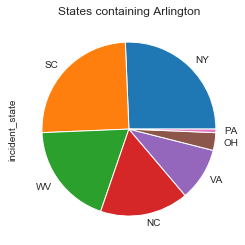

In [9]:
DF[DF.incident_city == 'Arlington'].incident_state.value_counts().plot(kind='pie', title='States containing Arlington')
plt.show()

**Dies lässt zwei mögliche Schlüsse zu: Entweder ist der Datensatz anonymisiert oder gefälscht/künstlich erzeugt!**

### Bereinigen des Datensatzes

*_c39* hat keine Einträge und die Bedeutung von *policy_csl* ist ohne weitere Informationen nicht eindeutig. Daher werden beide Werte aus dem Datensatz entfernt! Zusätzlich bringen wir die Tabelle in die nullte Normalform, d.h. wir sorgen dafür, dass die Werte atomar vorliegen. Dies ist bei den Datumsangaben noch nicht realisiert. Diese werden also in Tag/Monat/Jahr gesplittet. Das ganze wird als Funktion realisiert, da wir die gleichen Routinen später noch einmal brauchen werden.

In [3]:
def cleanup(DF):
    DF = DF.drop(columns=['_c39'])
    DF = DF.drop(columns=['policy_csl'])

    ### Erzeugen einer Nullten Normalform
    AuxList = []
    for val in DF['policy_bind_date']:
        AuxList.append(str(val).split('-'))
    AuxArray = np.array(AuxList, dtype='int64').reshape(-1,3)
    DF['policy_bind_year']  = AuxArray[:,0]
    DF['policy_bind_month'] = AuxArray[:,1]
    DF['policy_bind_day']   = AuxArray[:,2]
    DF = DF.drop(columns=['policy_bind_date'])  

    AuxList = []
    for val in DF['incident_date']:
        AuxList.append(str(val).split('-'))
    AuxArray = np.array(AuxList, dtype='int64').reshape(-1,3)
    DF['incident_year']  = AuxArray[:,0] 
    DF['incident_month'] = AuxArray[:,1]
    DF['incident_day']   = AuxArray[:,2]                               
    DF = DF.drop(columns=['incident_date'])  

    AuxList = []
    for val in DF['incident_location']:
        Adress = (str(val).split(' '))
        AuxList.append([Adress[0], ' '.join(Adress[1:]) ])
    AuxArray = np.array(AuxList).reshape(-1,2)
    DF['incident_location_no']     = AuxArray[:,0].astype('int64')
    DF['incident_location_street'] = AuxArray[:,1]
    DF = DF.drop(columns=['incident_location'])
    return DF

DF = cleanup(DF)

### Data Augmentation
Anstelle der Datumsangaben führen wir noch ein äquivalentes Feature ein, indem wir ein Datum in "Tage seit Referenz" umrechnen.
Für *policy_bind* verwenden wir als Referenz das am weitesten zurückliegende Datum. Für *incident* verwenden wir die Tage im laufenden Jahr, da hier nur Angaben aus dem Jahr 2015 existieren. Wir könnten auch das früheste Datum von *policy_bind* als Referenz hierfür verwenden, würden dann aber nur einen konstanten Shift +k für jeden Wert schaffen (diese Transformation enthält dann keine Informationen). Zudem würden die Werte bei der späteren Skalierung diesen Shift ohnehin wieder verlieren.

In [4]:
#Incident Dates und Policy Bind Dates in Tage seit Referenz umrechnen 

def augment(DF):
    Sort   = DF.sort_values(by=['policy_bind_year','policy_bind_month','policy_bind_day'])
    RefRow = Sort.iloc[0,:]
    y      = RefRow['policy_bind_year']
    m      = RefRow['policy_bind_month']
    d      = RefRow['policy_bind_day']
    date0  = date(y,m,d)

    Deltas = []
    for id in range(len(DF)):
        AuxDF = DF.iloc[id,:]
        y     = AuxDF['policy_bind_year']
        m     = AuxDF['policy_bind_month']
        d     = AuxDF['policy_bind_day']
        date1 = date(y,m,d)
        Deltas.append( (date1-date0).days )
    DF['policy_bind_delta'] = Deltas

    Deltas = []
    date0  = date(2015,1,1)
    for id in range(len(DF)):
        AuxDF = DF.iloc[id,:]
        y     = AuxDF['incident_year']
        m     = AuxDF['incident_month']
        d     = AuxDF['incident_day']
        date1 = date(y,m,d)
        Deltas.append( (date1-date0).days )
    DF['incident_delta'] = Deltas

    DF = DF.drop(columns=['incident_year'])
    return DF

DF = augment(DF)

Insgesamt sind einige Ungereimtheiten aufgefallen, die auf eine künstlicher Erzeugung oder aber auf eine Annonymisierung des Datensatzes hinweisen. Für eine weitere Verarbeitung (Knowledge Discovery und Prediction) musste der Datensatz optimiert werden. Im folgenden Abschnitt wird dieser bereinigte Datensatz nun dazu verwendet werden, latente Informationen und wertvolles Kundenwissen zu extrahieren.

## 2.  Auswertung des Datensatzes (Knowledge Discovery)

Zunächst einmal schauen wir uns die Merkmalsausprägungen an. Wir wählen für jeden Datentyp passende Visualisierungen: Nominale/Ordinale Merkmale werden im Kreisdiagramm, diskrete aber kardinale Merkmale werden in einem Histogramm und kontinuierliche Merkmale mit einer Kerndichteschätzung dargestellt.

Nominale/Ordinale Merkmale


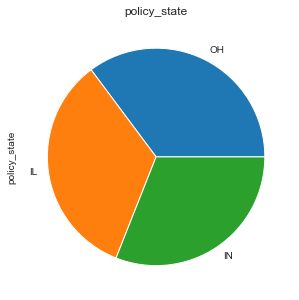

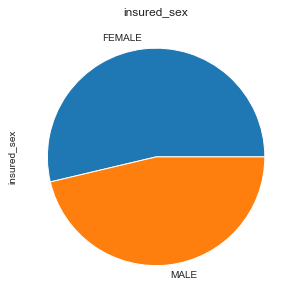

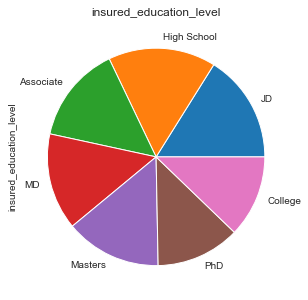

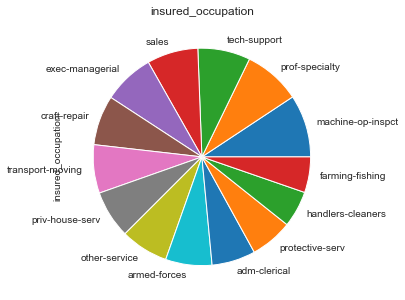

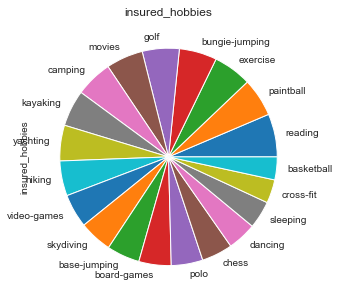

...

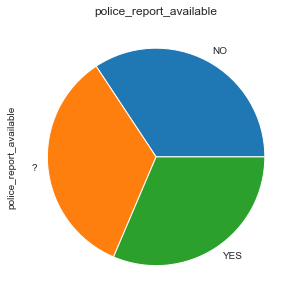

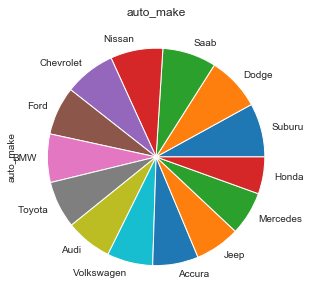

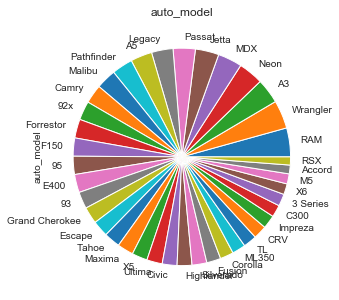

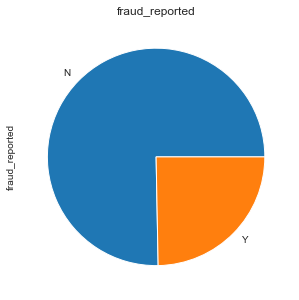

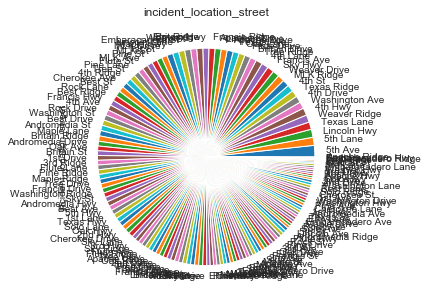

Diskret-Kardinale Merkmale


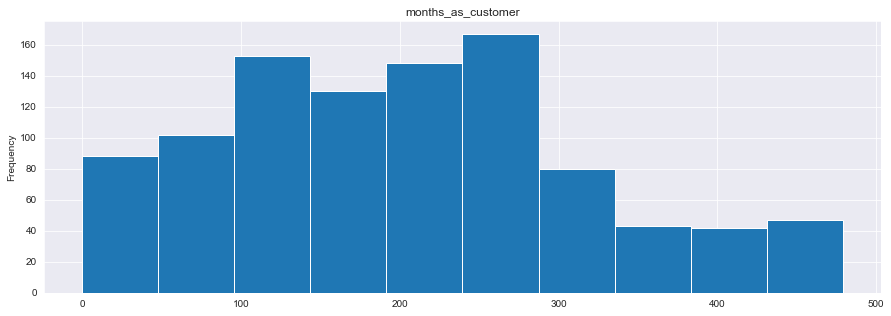

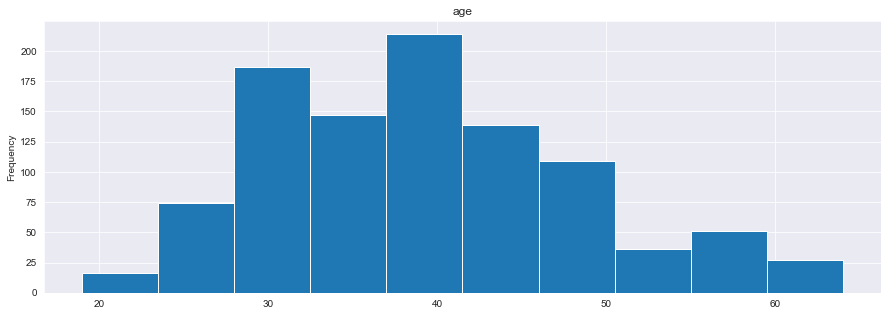

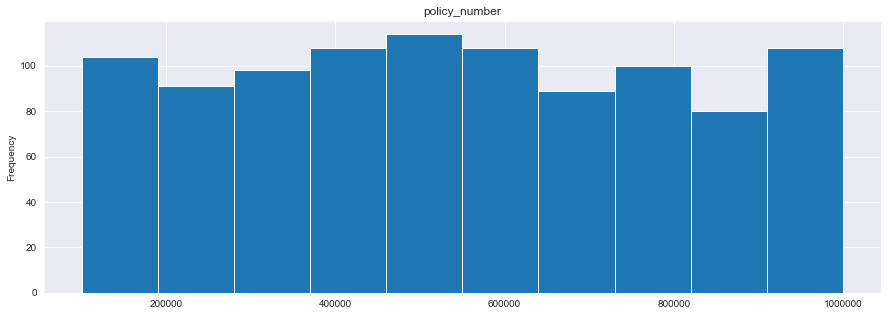

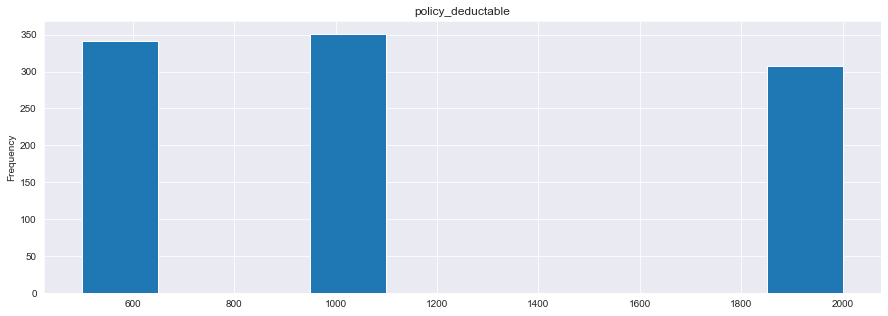

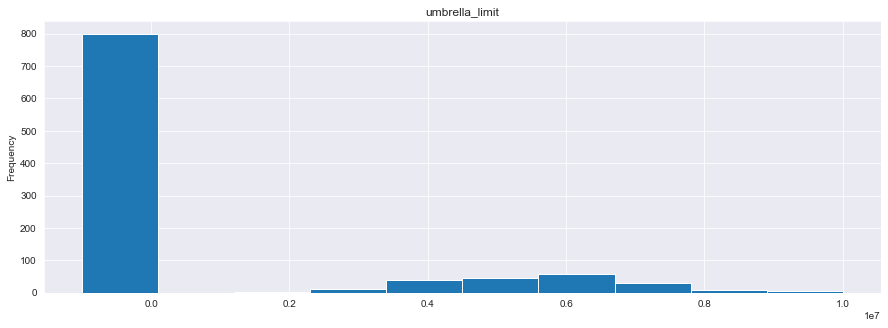

...

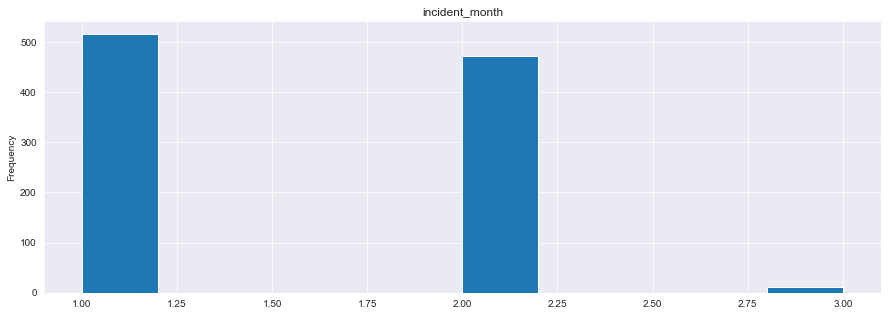

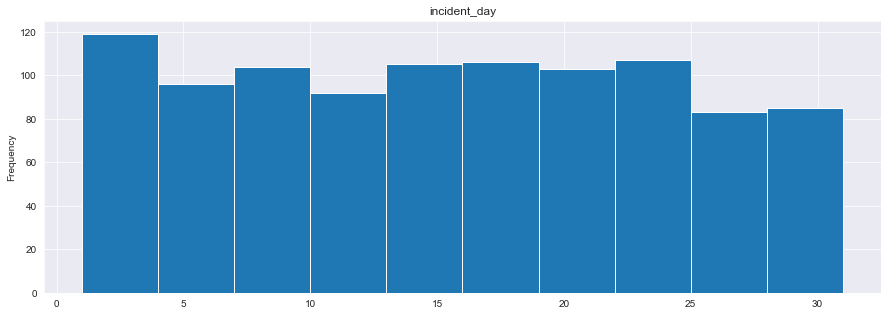

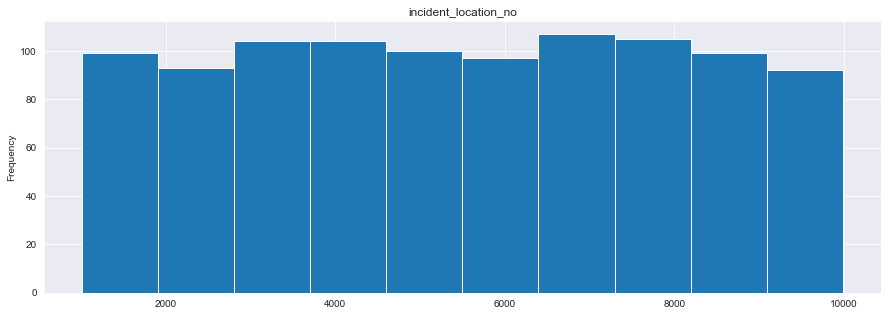

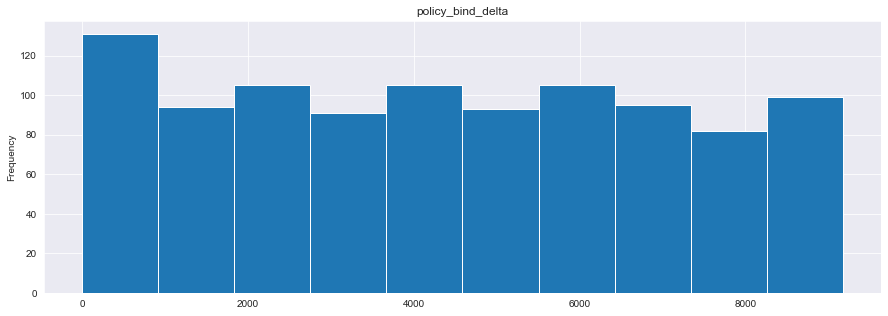

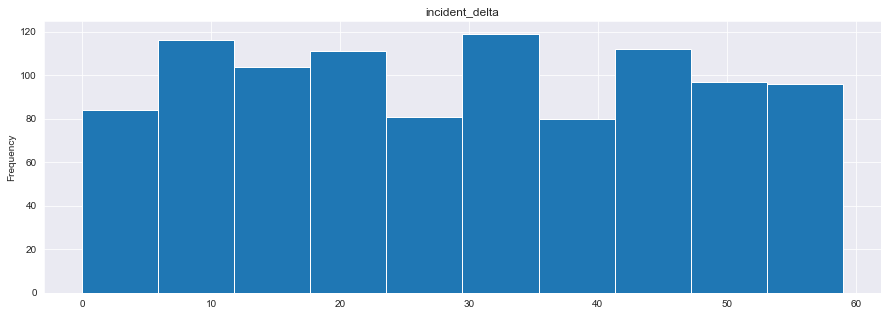

Kontinuierlich-Kardinale Merkmale


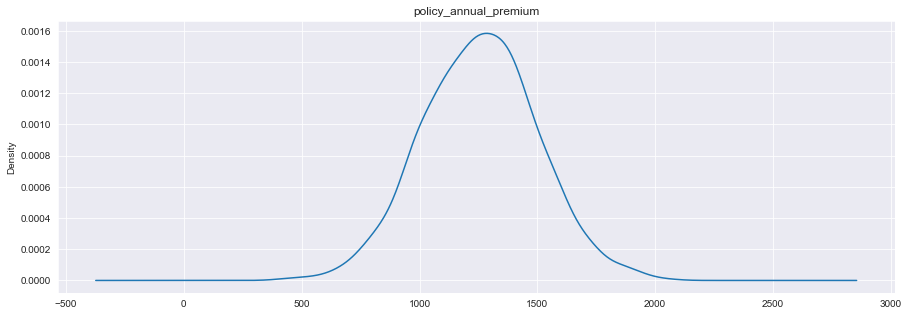

In [93]:
Columns_float  = DF.select_dtypes(include=['float64']).columns
Columns_int    = DF.select_dtypes(include=['int64']).columns
Columns_object = DF.select_dtypes(include=['object']).columns

print("Nominale/Ordinale Merkmale")
for col in Columns_object:
    DF[col].value_counts().plot(kind='pie', title=col, figsize=(15,5))
    plt.show()

print("Diskret-Kardinale Merkmale")
for col in Columns_int:
    DF[col].plot(kind='hist', title=col, figsize=(15,5))
    plt.show()

print("Kontinuierlich-Kardinale Merkmale")
for col in Columns_float:
    DF[col].plot(kind='kde', title=col, figsize=(15,5))
    plt.show()

**Erkenntnisse auf Basis der Daten:**
* Frauen sind deskriptiv häufiger in Unfällen involviert
* Unfallwahrscheinlichkeit ist unabhängig vom Bildungsgrad, Beruf, Hobbys (Risikobereitschaft) und Familienstand
* Die meisten Schadensfälle entstehen durch Kollisionen (ein oder mehrere KFz)
* Bagatellschäden sind selten. Am häufigsten sind geringe Schäden (größer als Bagetell)
* Es ist sehr selten, dass keine Behörden involviert werden
* Unfällhäufigkeit steht nicht im Zusammenhang mit Automarke oder -modell
* In einem Viertel der Fälle liegt ein Betrug vor

* Bis 300 Monaten Kundschaft (~Fahrerfahrung) steigt die Unfallwahrscheinlichkeit
* Ab 300 Monaten Kundschaft (~Fahrerfahrung) sinkt die Unfallwahrscheinlichkeit
* Am häufigsten sind Fahrer zwischen 30 und 40 Jahren betroffen
* Für nahezu alle Unfälle ist kein Umbrella Limit festgesetzt
* Die Unfallwahrscheinlichkeit ist während des Berufsverkehrs und nachts am höchsten
* Am häufigsten ist nur ein Auto involviert
* Wenn mehrere KFz involviert sind, dann sind es wahrscheinlich eher 3 als nur 2
* Die Gesamtforderung ist entweder sehr gering oder normalverteilt mit Mittelwert zwischen 60k und 70k
* Der meiste Anteil dieser Forderung entstammt der KFz-Kosten.
* Am häufigsten passieren Unfälle, wenn die Versicherung im Winter (Dezember, Januar) greift
* Unfälle passieren am häufigsten bei Kunden mit jährlicher Prämie von 1000 bis 1500 Euro

**Anmerkungen zu den Erkenntnissen:**
* Die Verteilung der Daten erscheint seltsam, viele der ordinalen Merkmale sind nahezu perfekt gleichverteilt, viele der kardinalen Daten weisen (mit Ausnahmewerten) eine angenäherte Normalverteilung auf. I.a.W.: Die Aufteilung ist zu "gut"
* Die Monate als Kunde sind sehr hoch. Eine deutlich Ballung der Werte in den unteren Monaten ist zu erwarten und Werte von ~480 Monaten = 40 Jahren sollten sehr selten auftreten
* Die Anzahl der involvierten Fahrzeuge erscheint nicht plausibel: Kasko-Schäden können die hohe Anzahl von einem Fahrzeug erklären, aber dass deutlich öfter drei Fahrzeuge als zwei involviert sind, erscheint falsch
* Eine steigende Unfallwahrscheinlichkeit bis 300 Monate Kundschaft erscheint ebenfalls falsch. Die Statistiken im deutschen Markt zeigen nach Mitte 20 (somit also sogar mit Führerschein ab 16 bei ~120-150 Monaten) ein Abfallen der Unfallwahrscheinlichkeit, die erst wieder im Rentenalter ansteigt

An dieser Stelle sind weitere Indikationen zutage getreten, die eine weitere Plausibilitätsprüfung nötig machen.

### Plausibilitätsprüfung

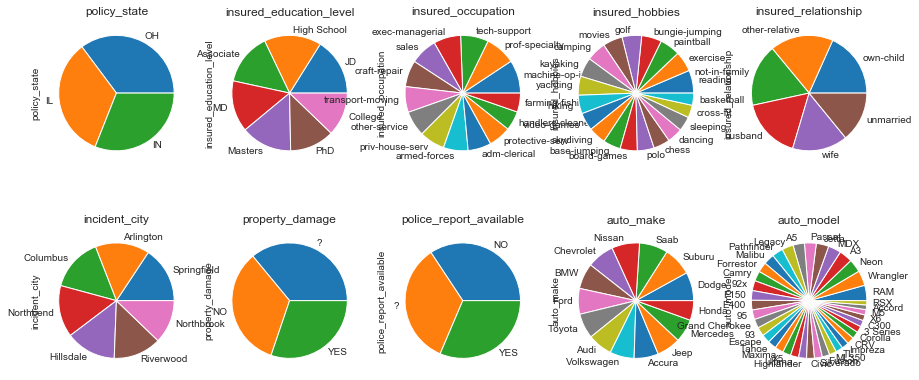

In [13]:
fig, axarr = plt.subplots(nrows=2, ncols=5, figsize=(15,7))
fig_id=0
for col in ['policy_state','insured_education_level', 'insured_occupation',
            'insured_hobbies', 'insured_relationship', 'incident_city',
            'property_damage', 'police_report_available', 'auto_make',
            'auto_model']:
    DF[col].value_counts().plot(kind='pie', title=col, ax=axarr[fig_id//5,fig_id%5])
    fig_id +=1
plt.show()

Fast alle nominalskalierten Merkmale weisen eine perfekte Gleichverteilung auf, die über so viele Merkmale hinweg nicht realistisch ist. Daraus kann gefolgert werden, dass dieser Datensatz künstlich generiert wurde oder dass dieser ein sehr gut ausgewälter Teildatensatz aus einem größeren Datenbestand darstellt. Bei den kardinalskalierten Merkmalen sind sehr häufig Gleichverteilungen zu erkennen bzw. bei einigen Merkmalen Normalverteilungen mit zusätzlichen Werten außerhalb, wie bereits oben erwähnt.

Zusammen mit den falschen Adressen und in Kombination mit der fachlichen Prüfung liegt die Vermutung nahe, dass der Datensatz konstruiert worden ist. Auf Basis dieser Vermutung und einer anschließenden Suche haben wir eine Version gefunden, die für eine Watson-Schulung verwendet wurde (https://bookdown.org/caoying4work/watsonstudio-workshop/auto.html). Wir gehen davon aus, dass dieser Datensatz zu Schulungszewecken künstlich generiert wurde und anschließend seinen Weg in öffentliche Repositories wie z.B. Kaggle fand. Es ist interessant, dass dies keinem Data Scientisten, der bisher sein Notebook auf Kaggle veröffentlicht hat, aufgefallen zu sein scheint.

Wir lernen daraus: Bevor wir loslegen, sollte **immer** eine Plausibilitätsprüfung durch Personen mit entsprechendem fachlichen Know-How erfolgen. Auch wenn Data Science und Machine Learning wertvolle Instrumente zur Verfügung stellen, genügt ein reines Anwenden von ML-Algorithmen nicht, um sinnvolle Ergebnisse zu produzieren. Vielmehr muss (fachliches) Know-How genutzt werden, um zu prüfen, ob die Daten plausibel sind, welche Daten verwendet werden (dürfen) und wie die Ergebnisse zu interpretieren sind. Oder, um es auf den Punkt zu bringen: **Data Science alleine genügt nicht, es muss (im Versicherungskontext) ebenfalls aktuarielles Know-How vorhanden sein, damit die Ergebnisse belastbar werden.**

Wir werden aber weiterhin mit diesen Datensatz arbeiten um Knowledge-Discovery und Prediction zu demonstrieren, wenn der Datensatz "echt" wäre.

### Gruppierte Auswertung

Im folgenden werden statistische Merkmale in vielen Kombinationen in gruppierten Boxplot-Diagrammen ausgewertet. Hierdurch lassen sich viele Zusammenhänge erkennen, die eine größere semantische Information besitzen, als die Betrachtung von z.B. Korrelationen.



 policy_state 




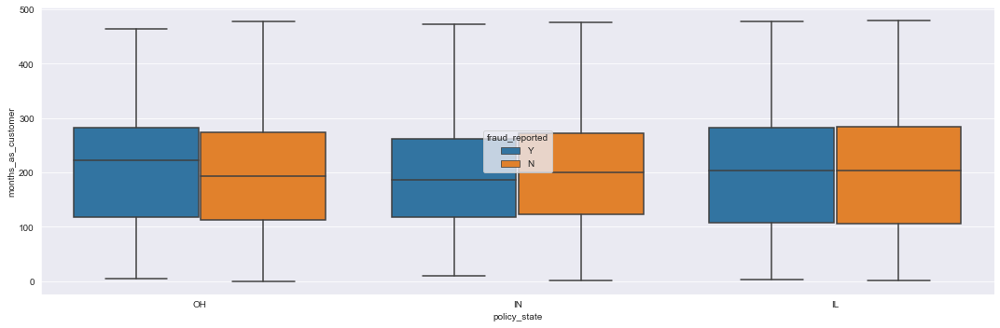

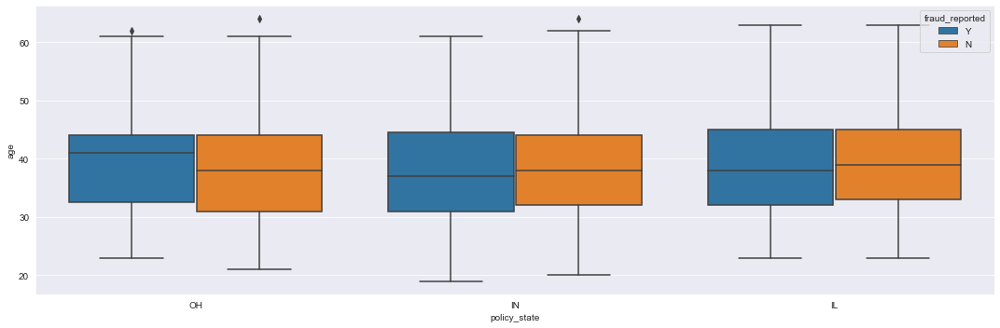

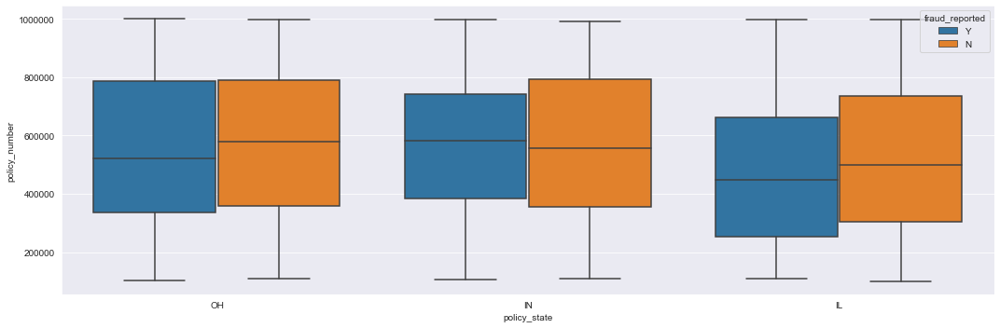

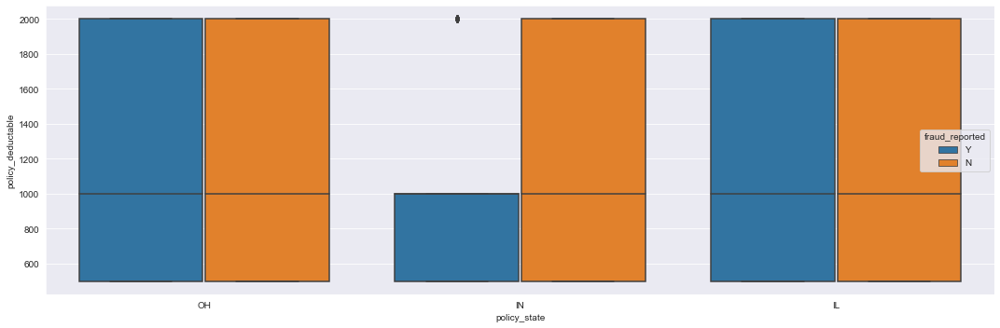

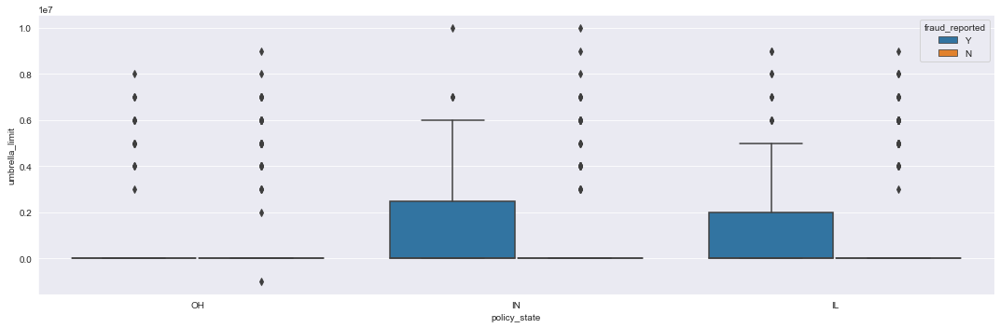

...

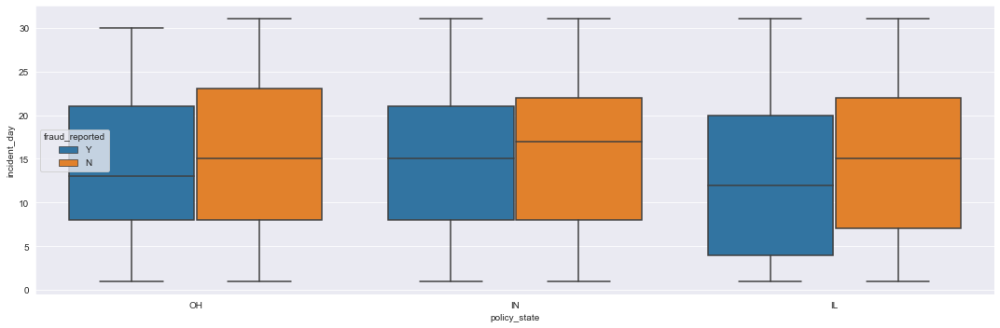

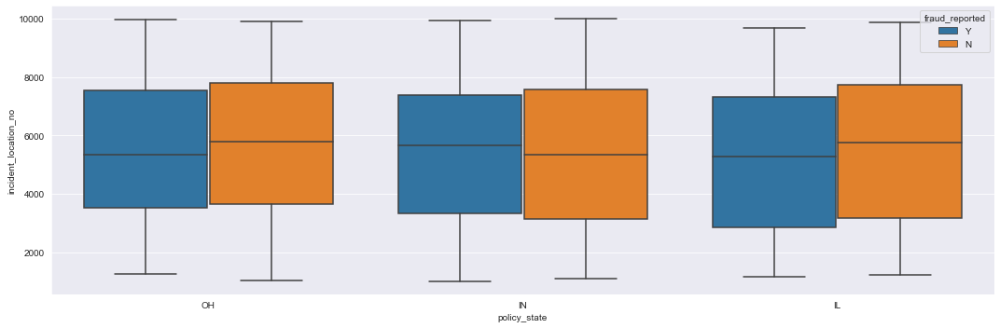

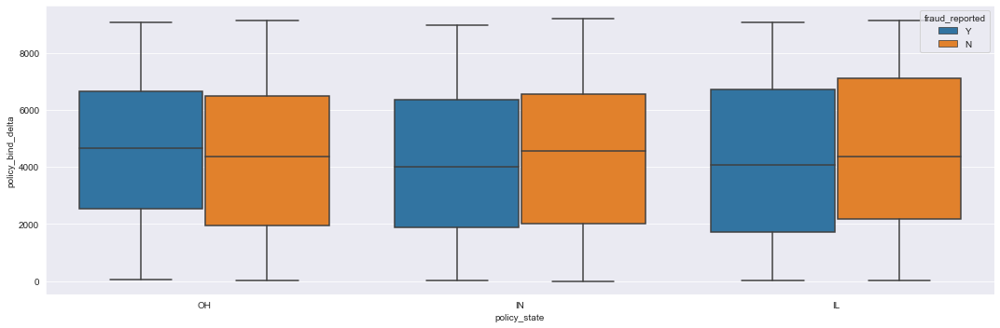

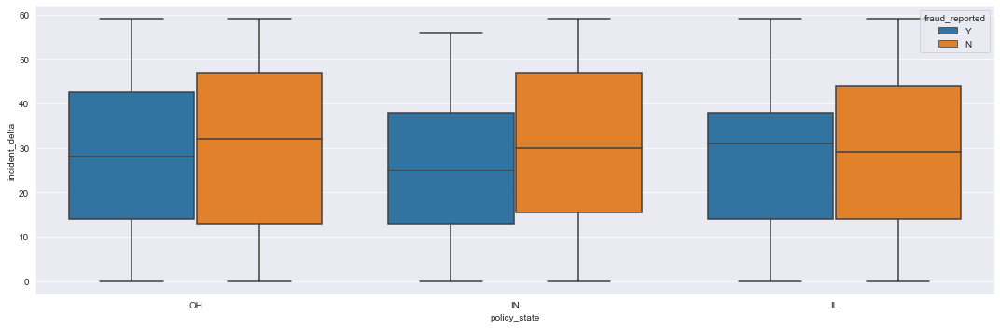

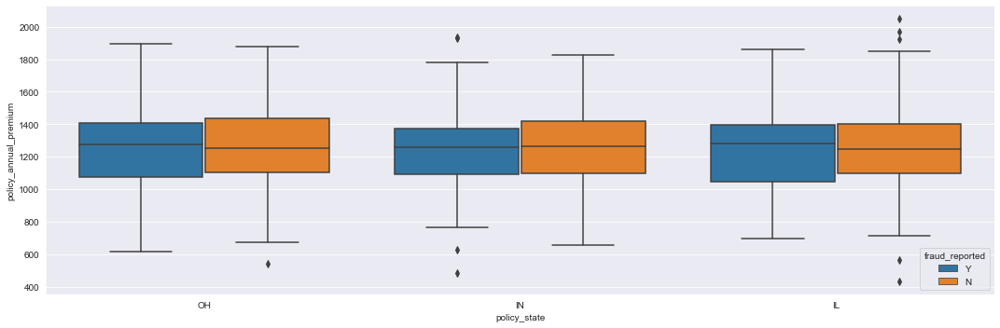



 insured_sex 




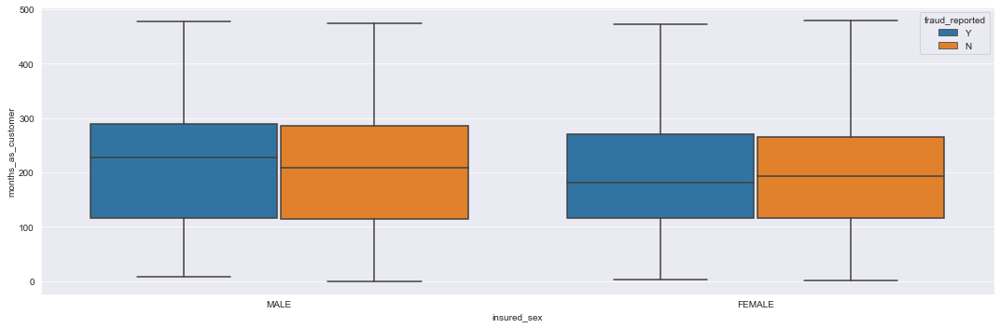

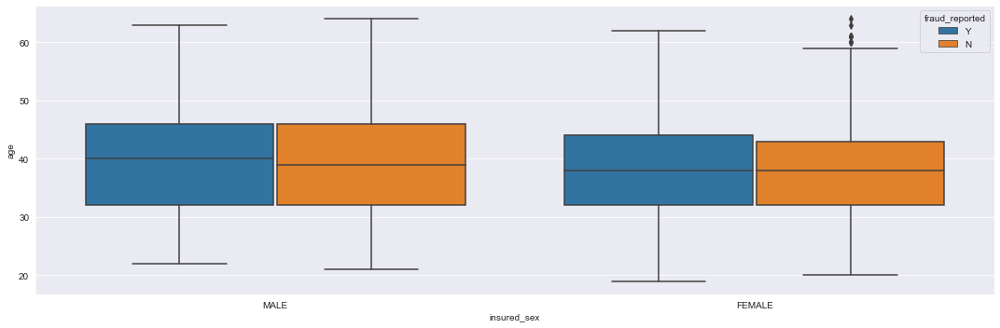

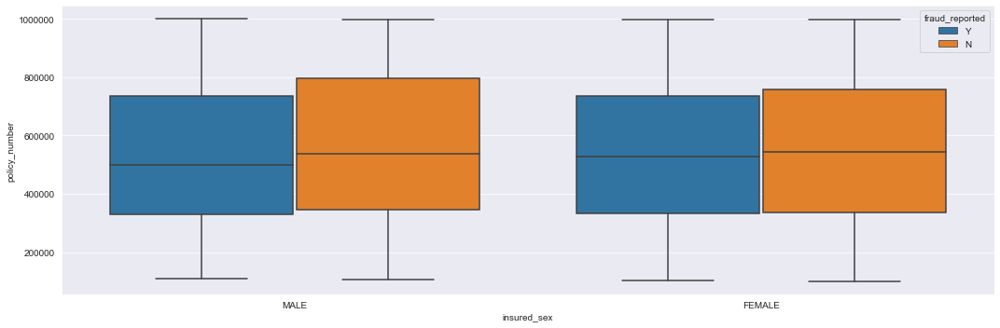

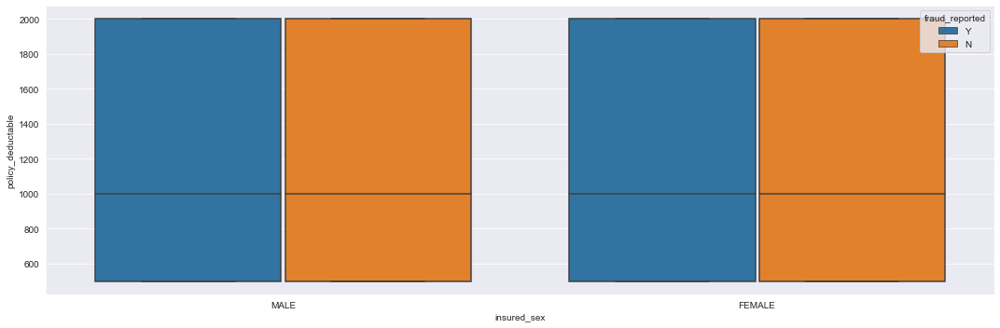

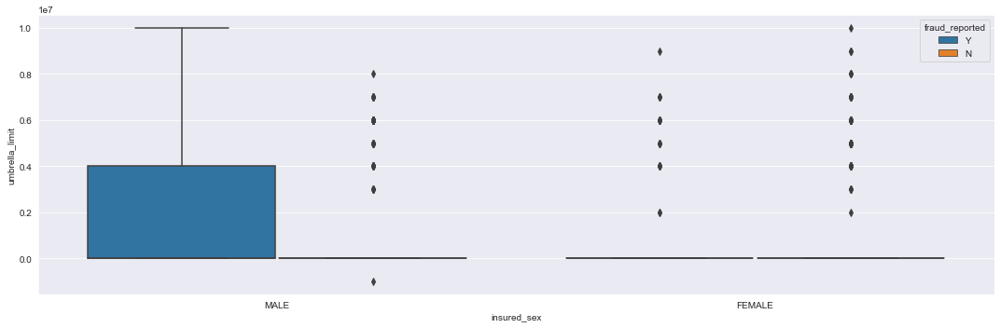

...

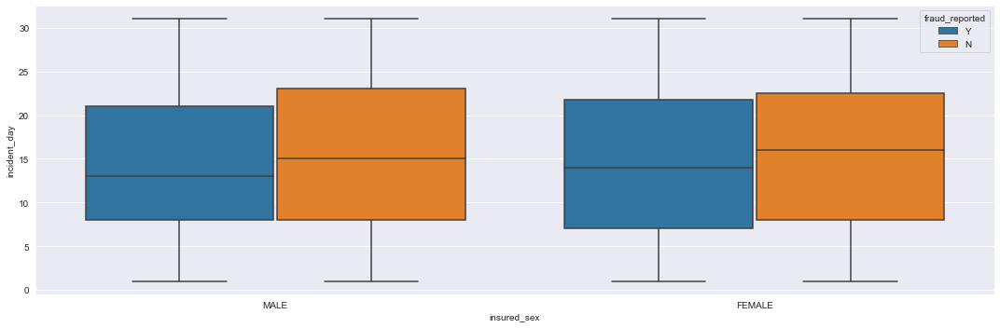

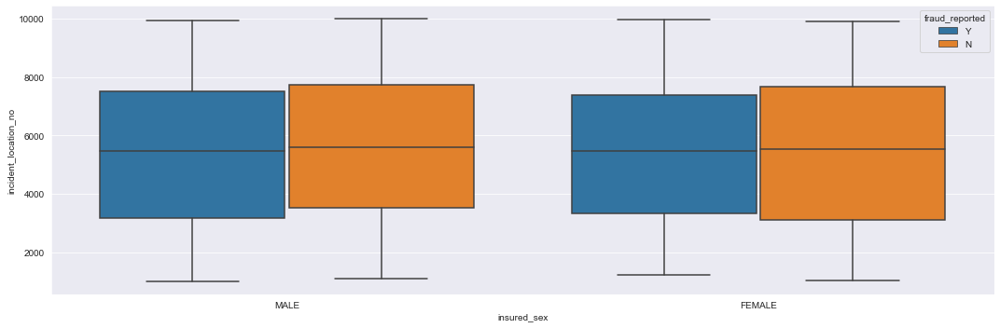

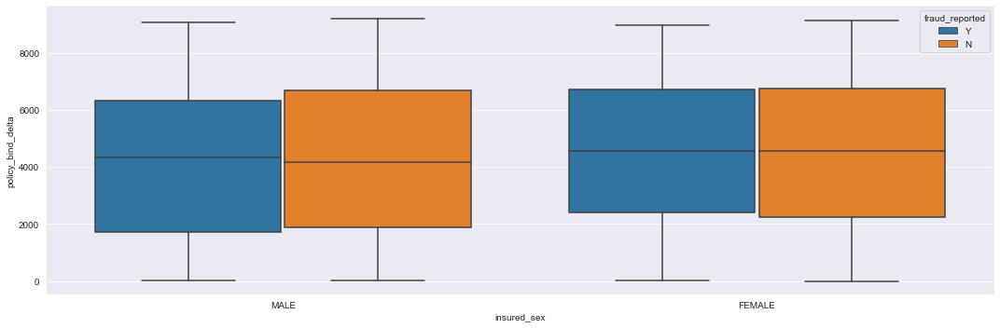

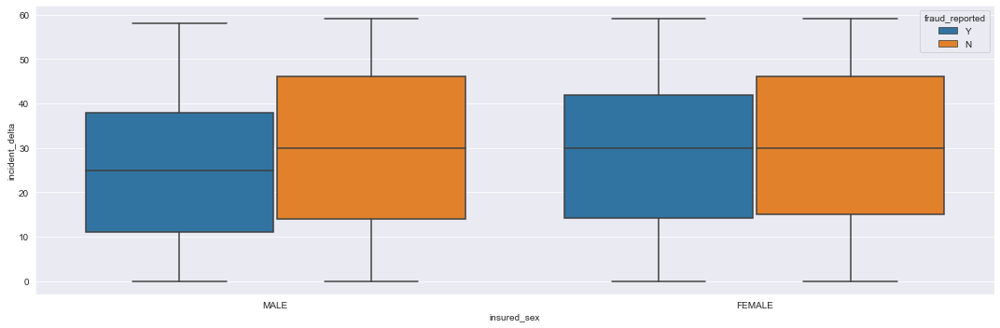

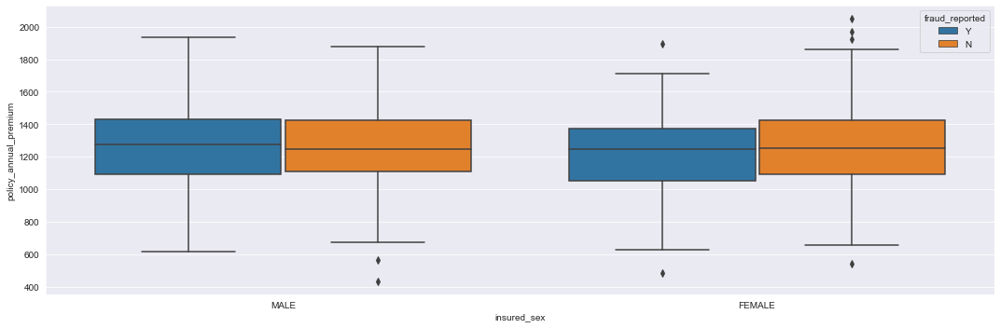



 insured_education_level 




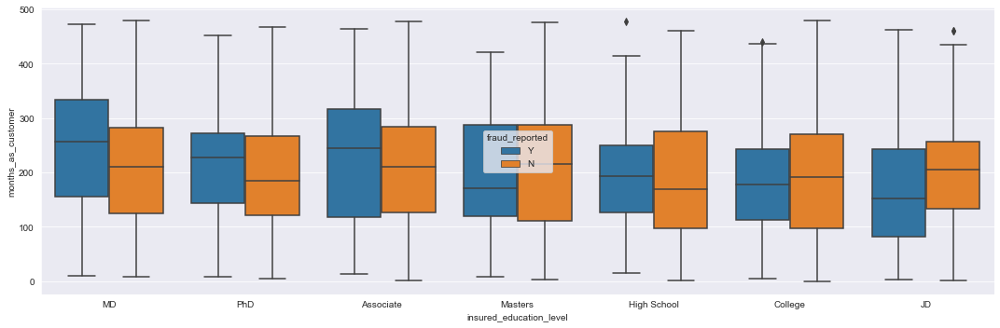

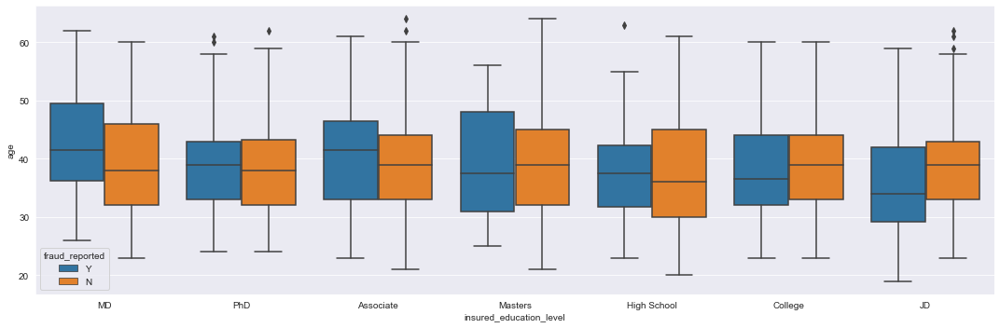

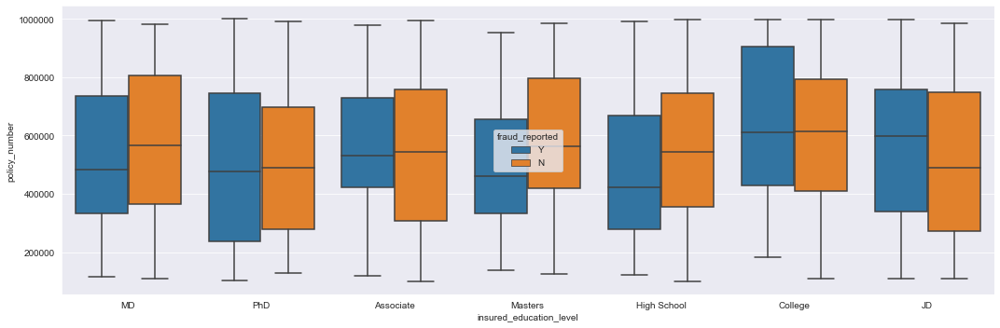

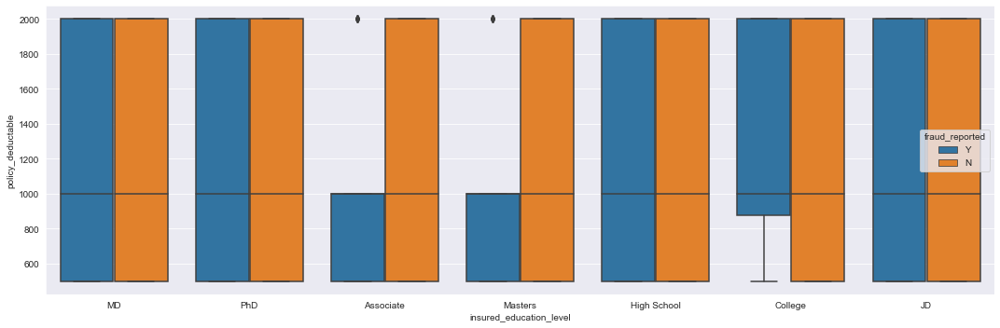

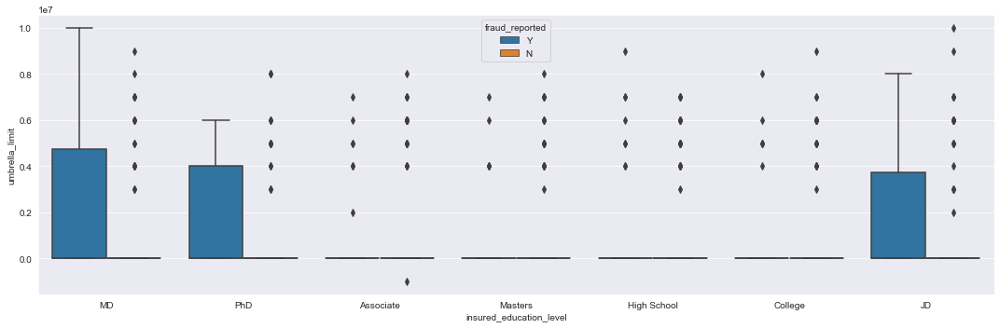

...

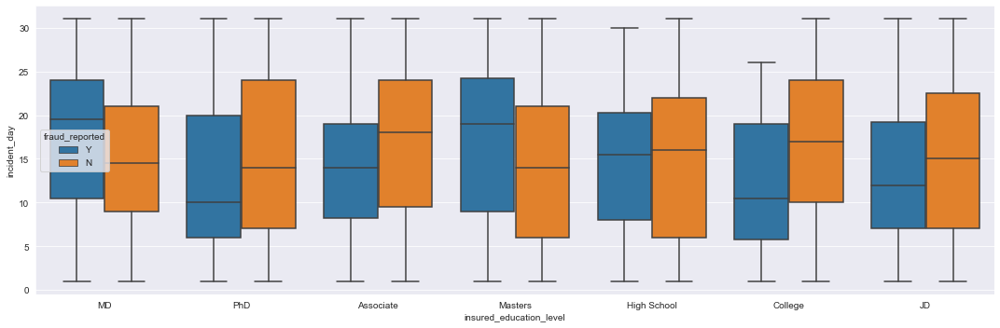

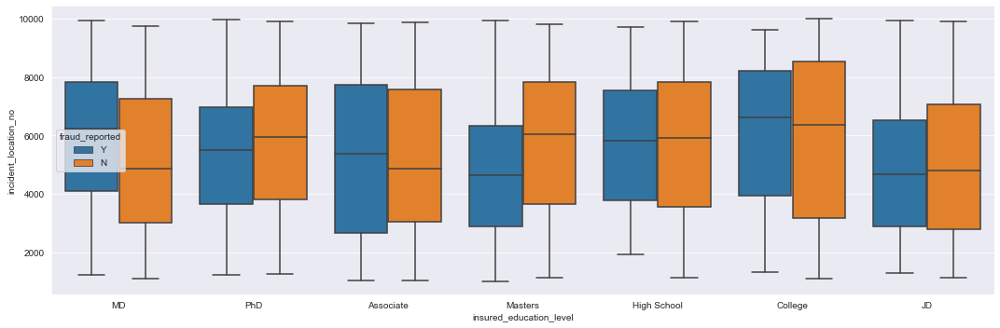

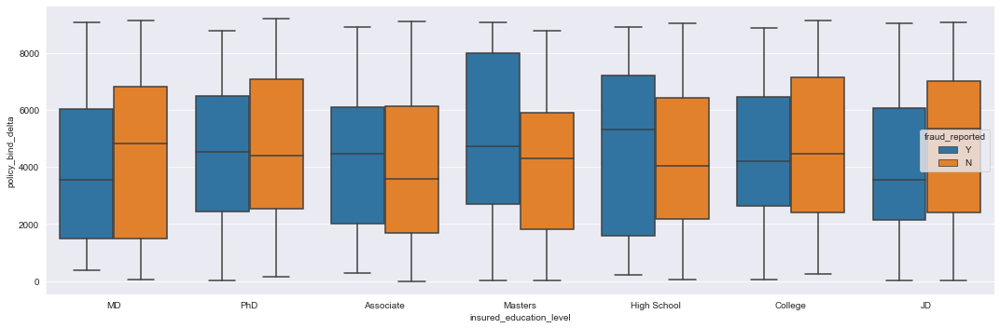

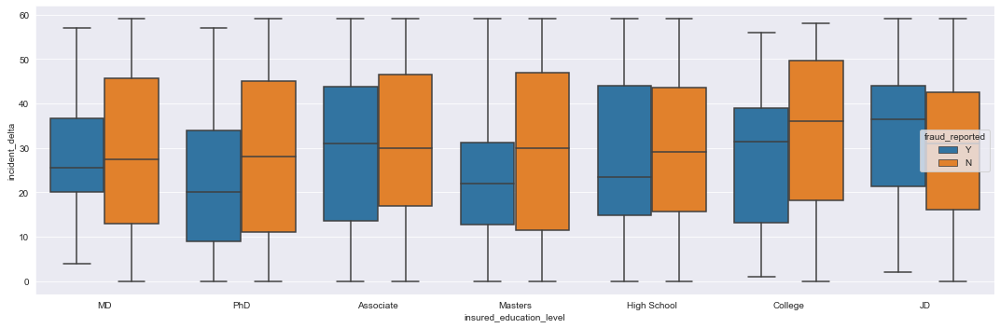

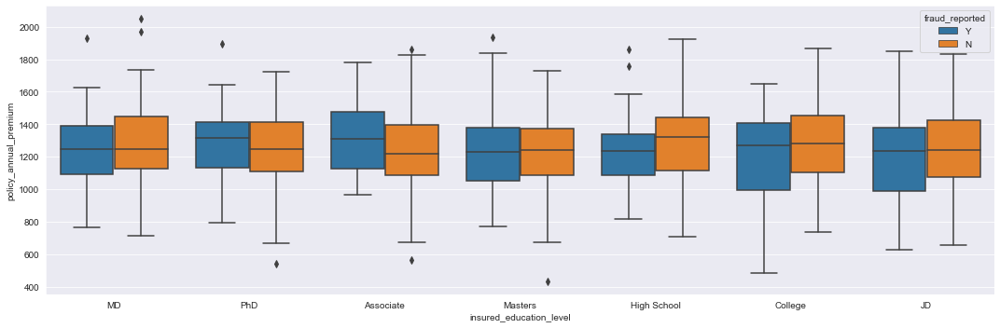



 insured_occupation 




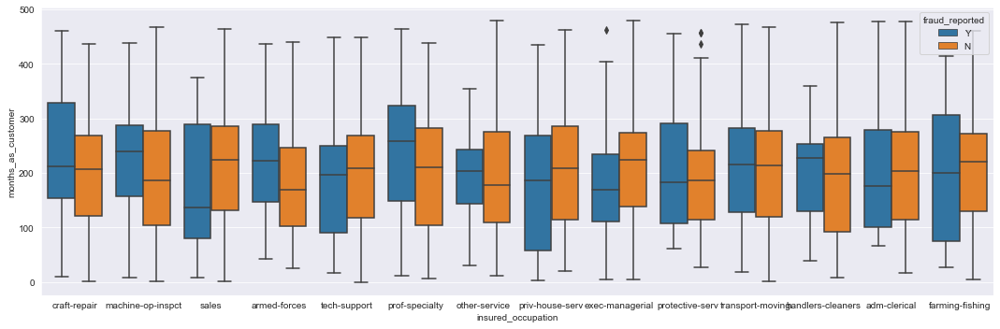

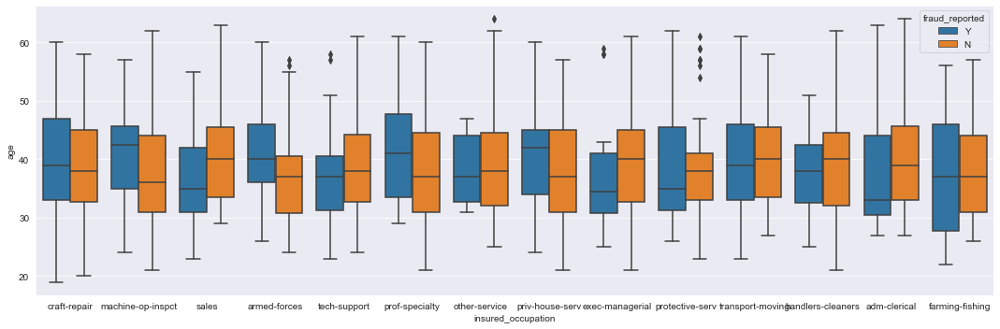

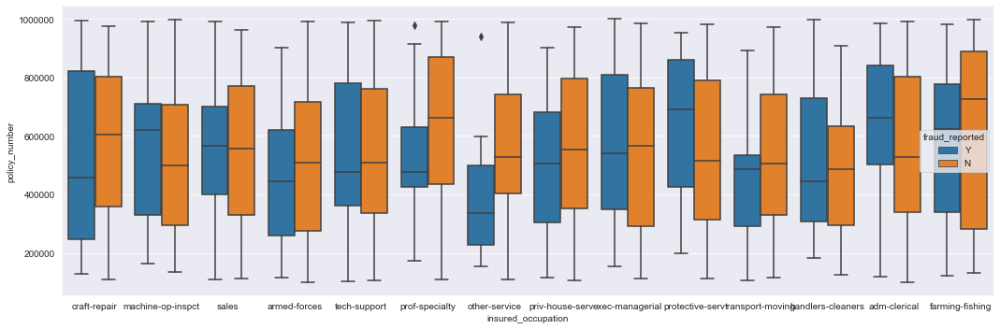

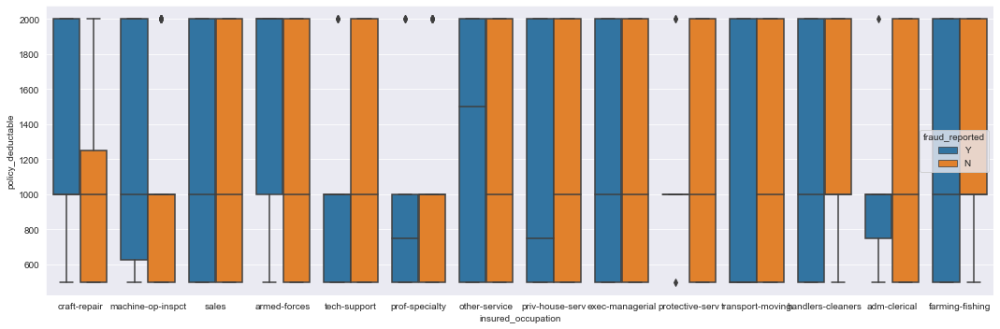

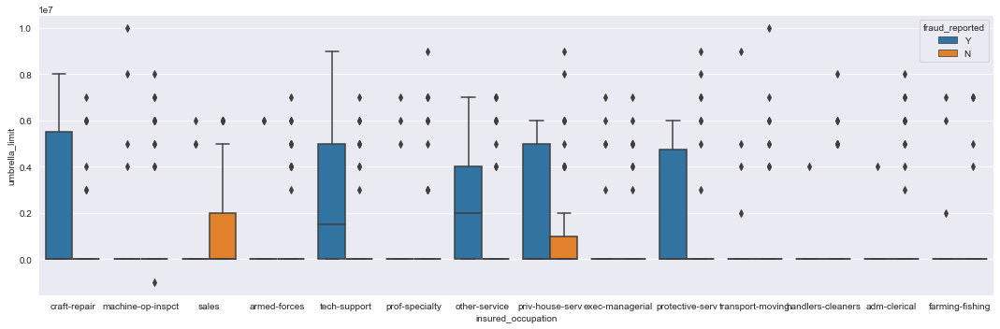

...

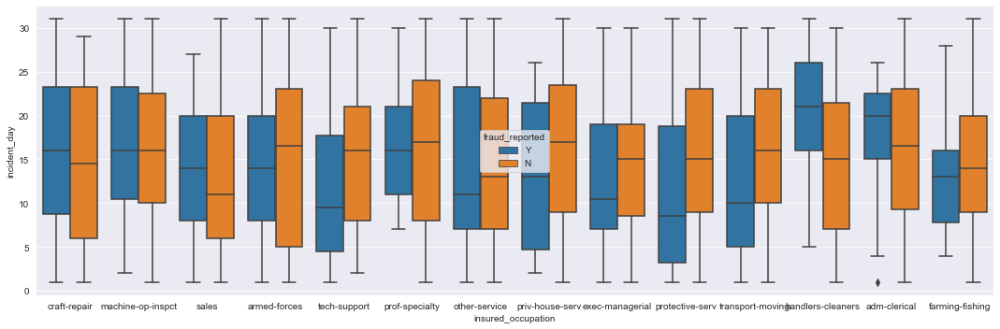

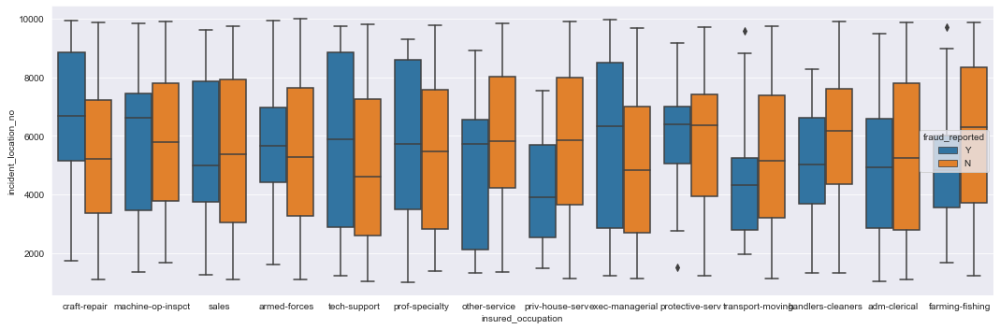

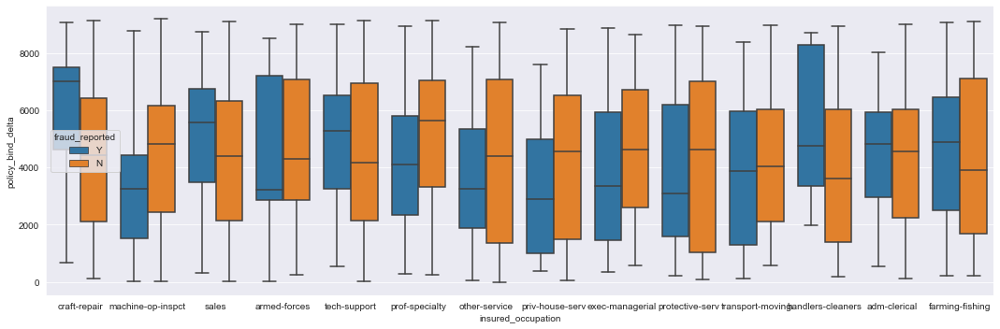

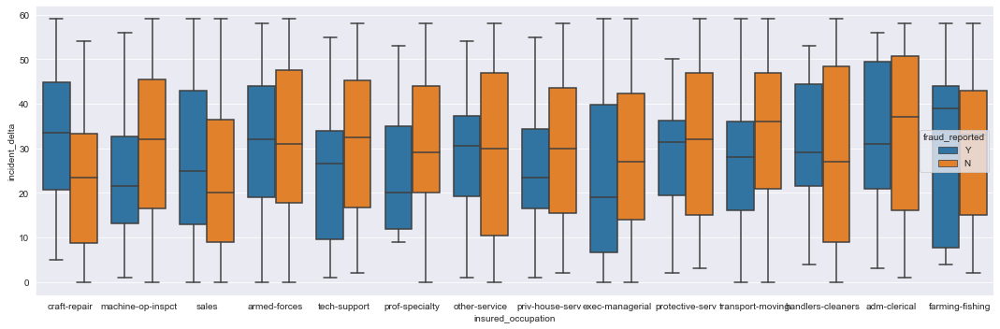

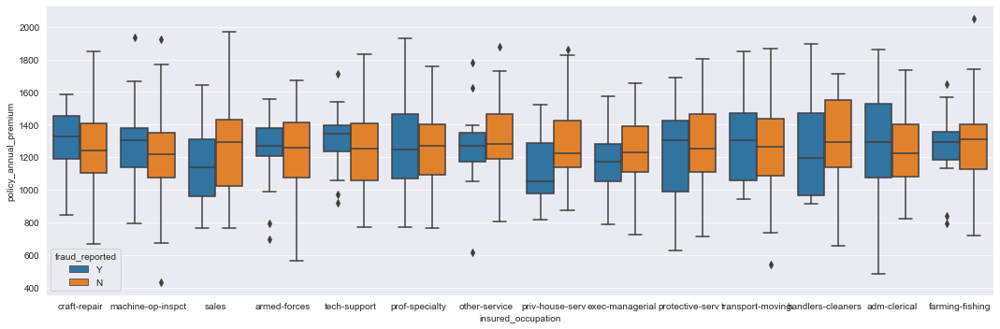



 insured_hobbies 




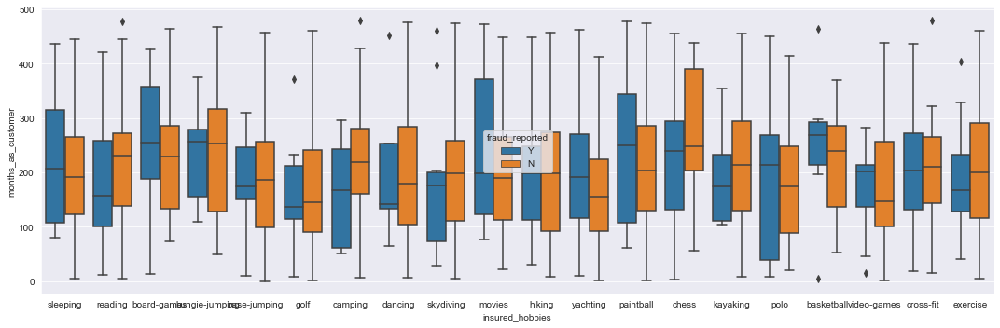

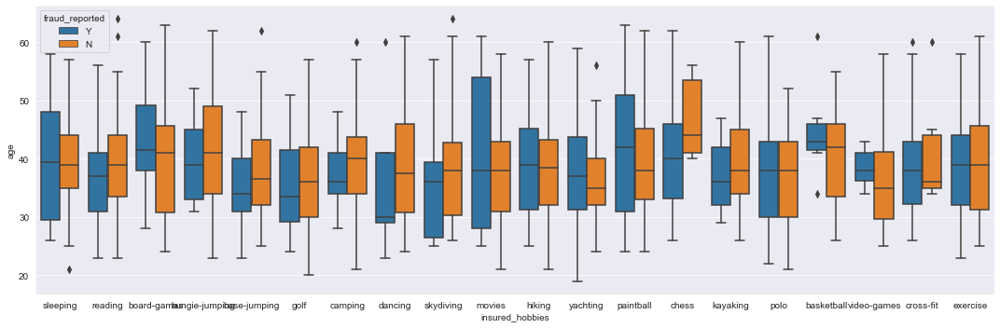

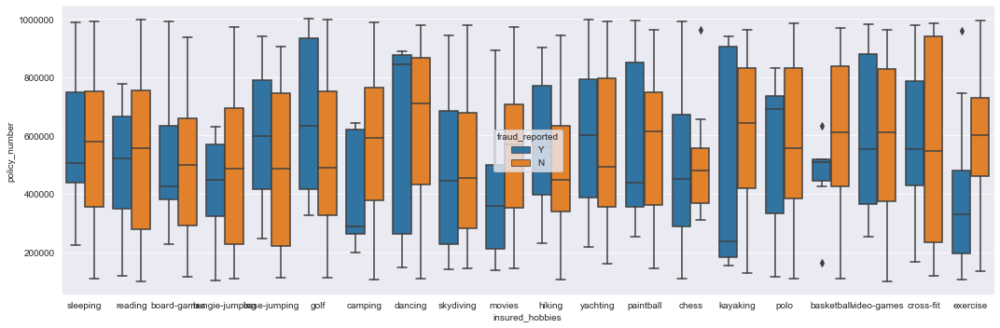

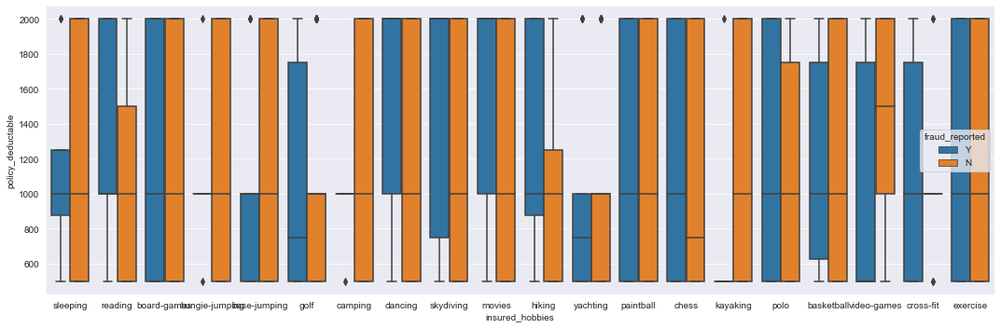

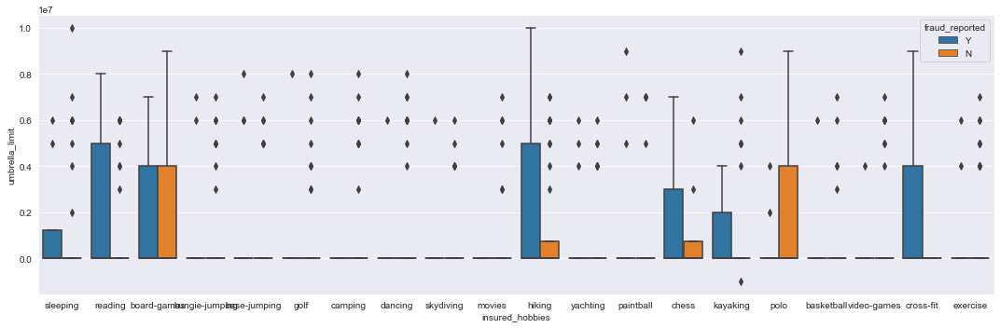

...

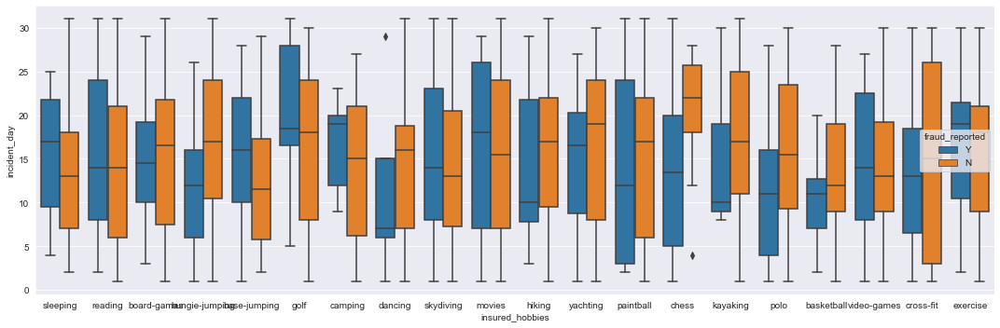

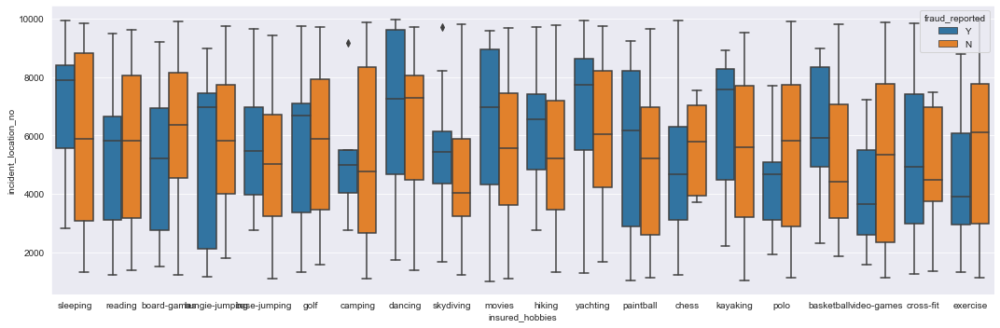

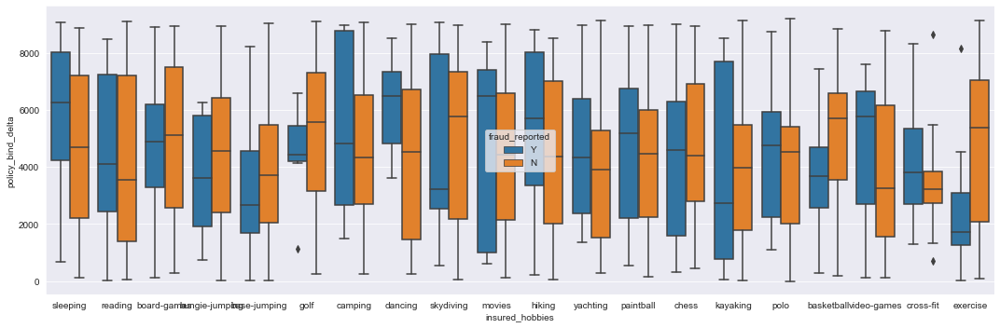

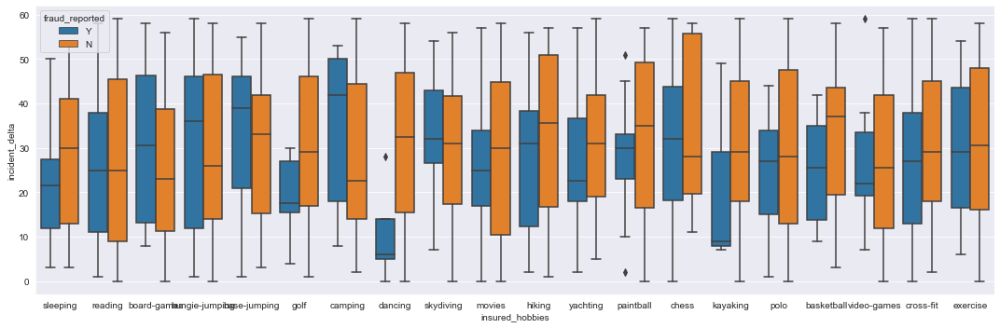

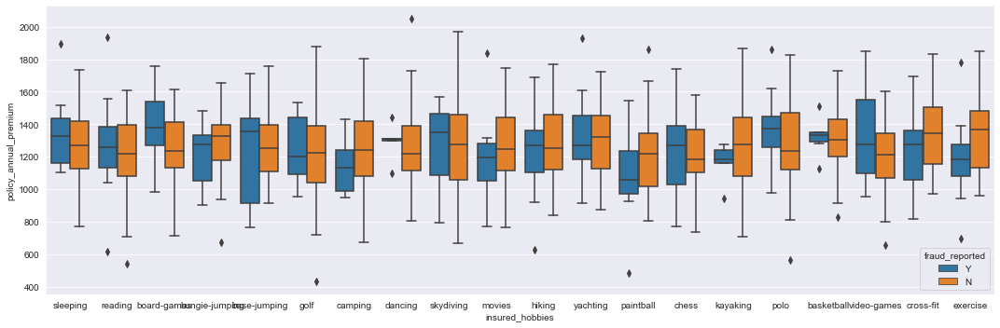



 insured_relationship 




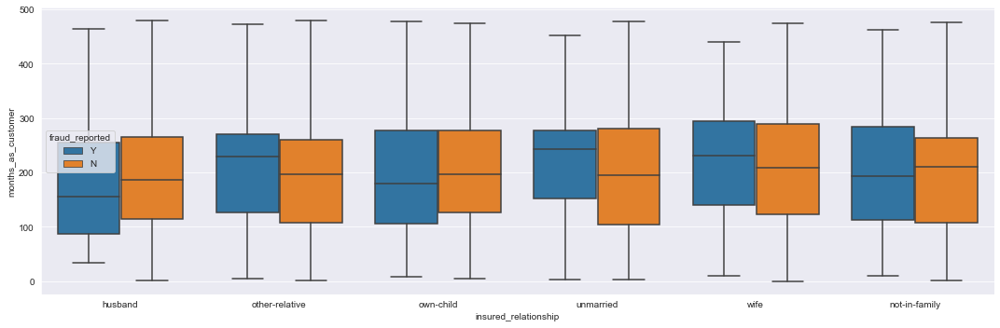

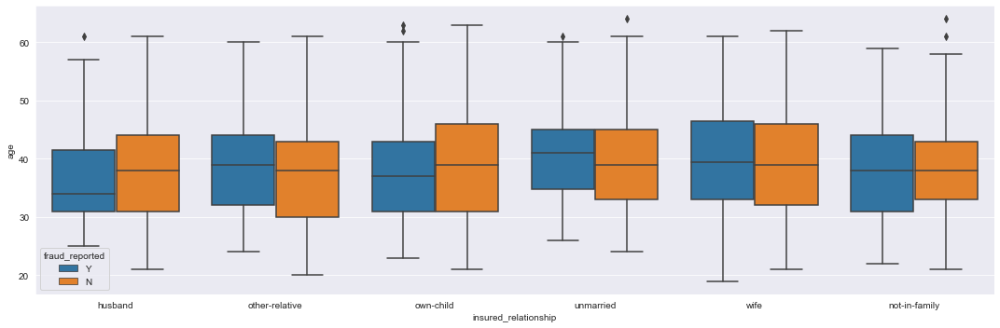

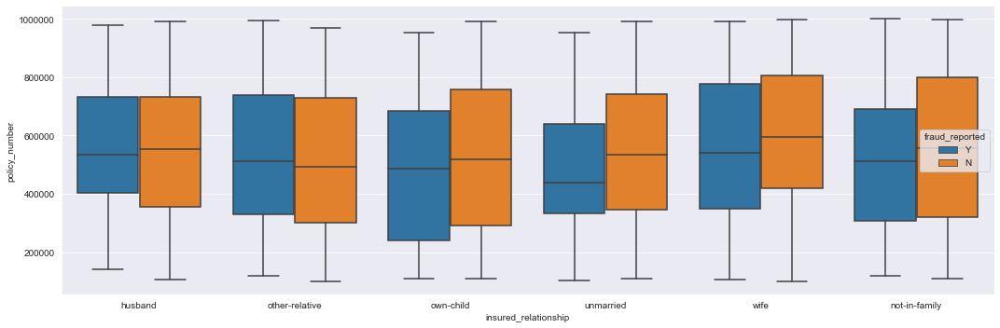

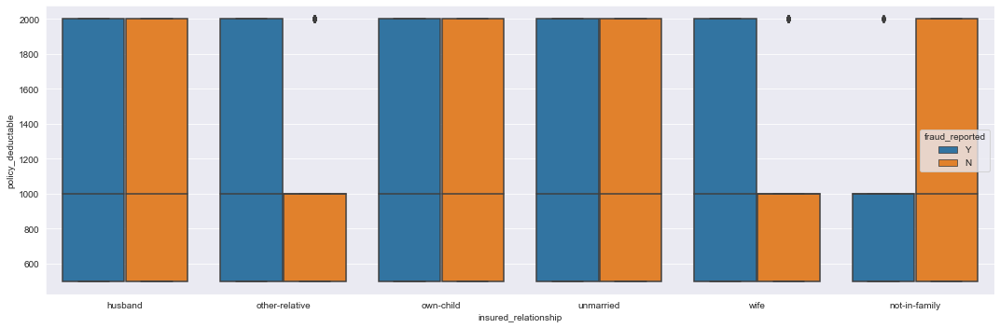

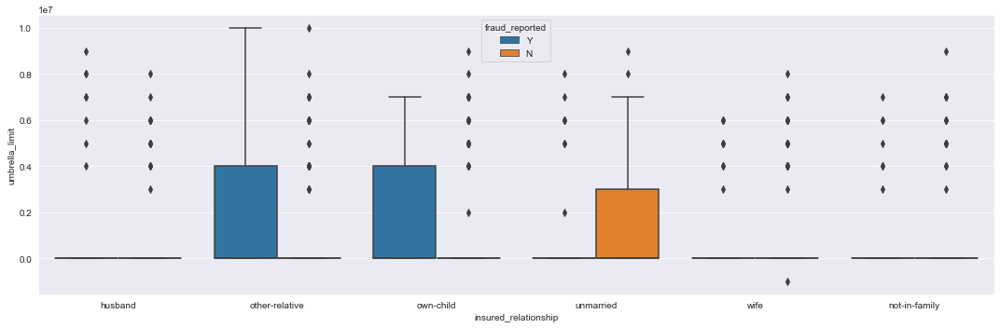

...

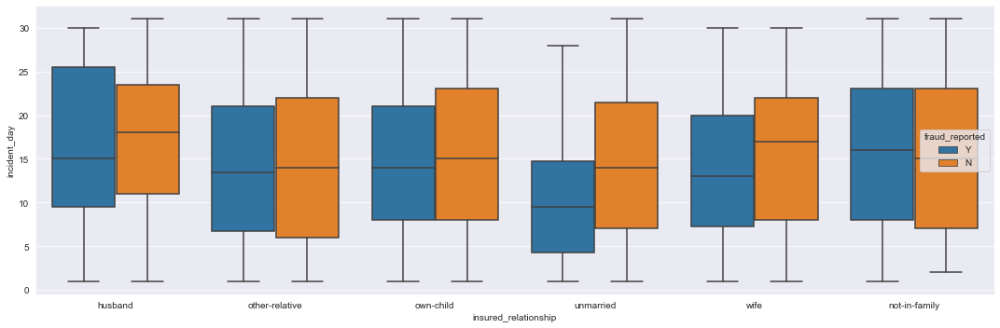

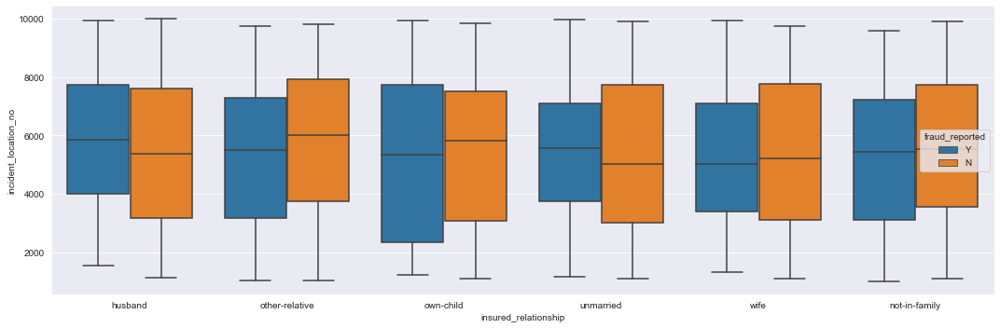

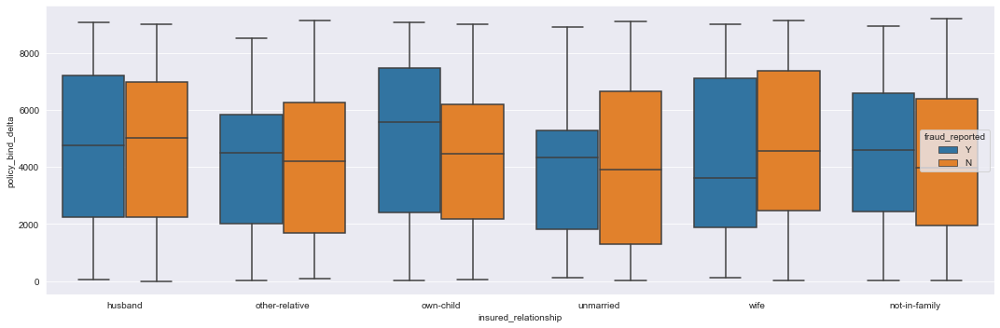

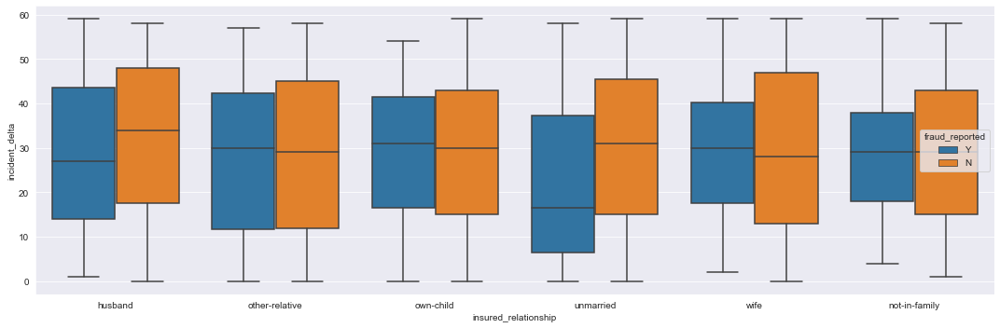

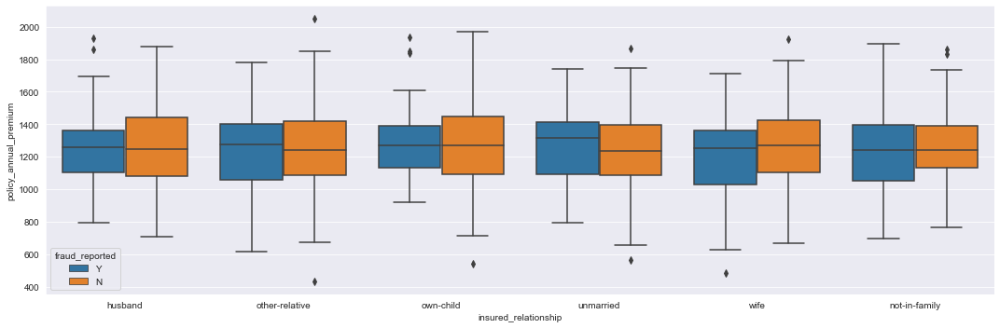



 incident_type 




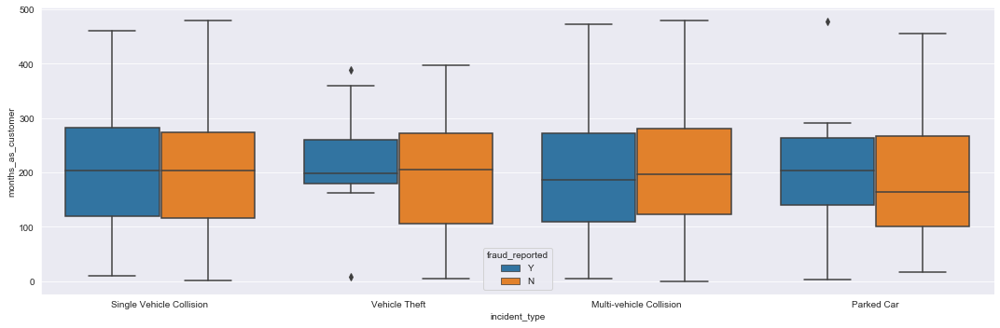

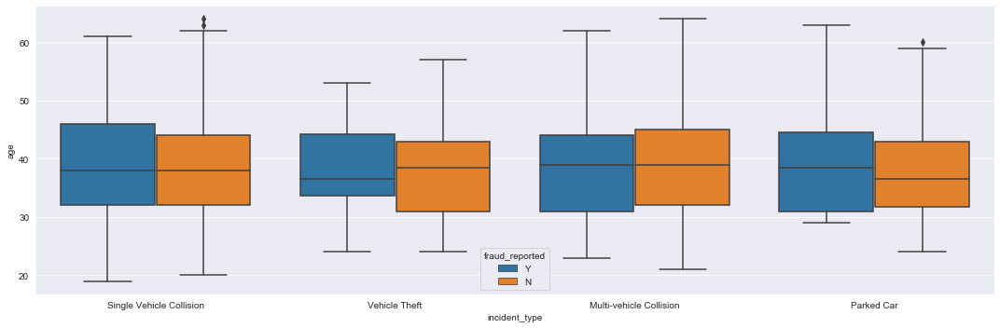

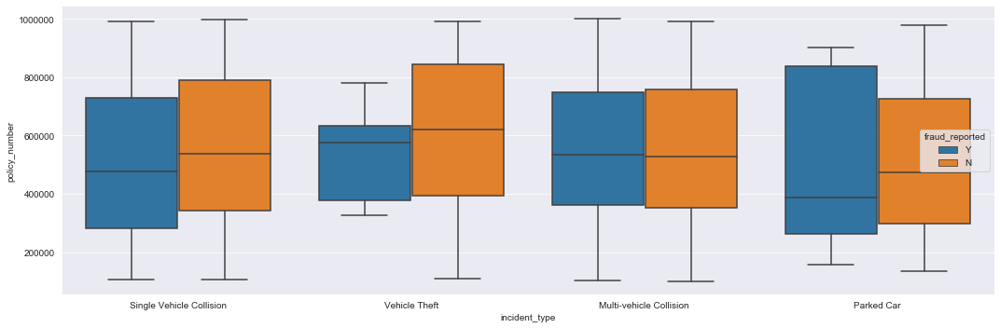

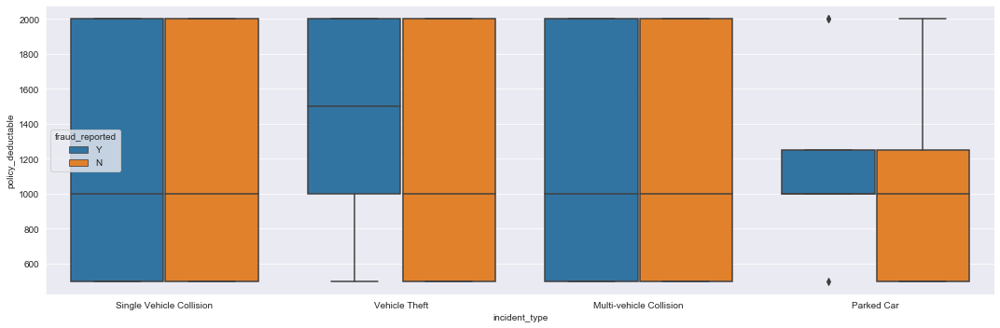

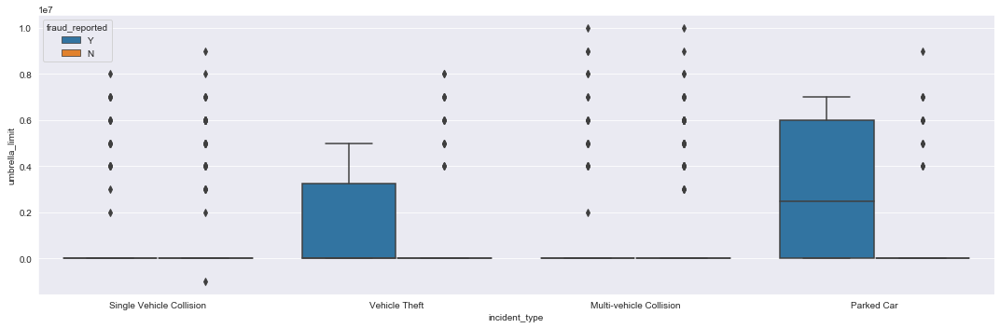

...

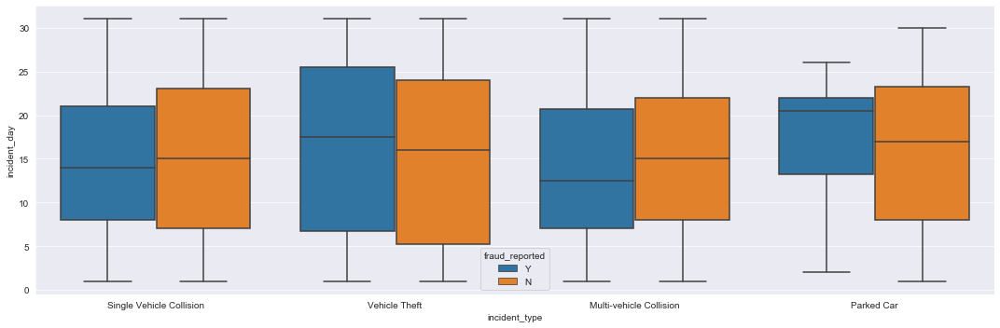

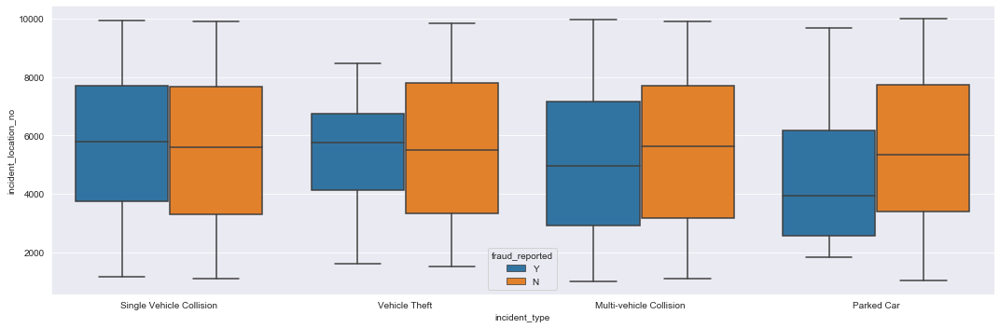

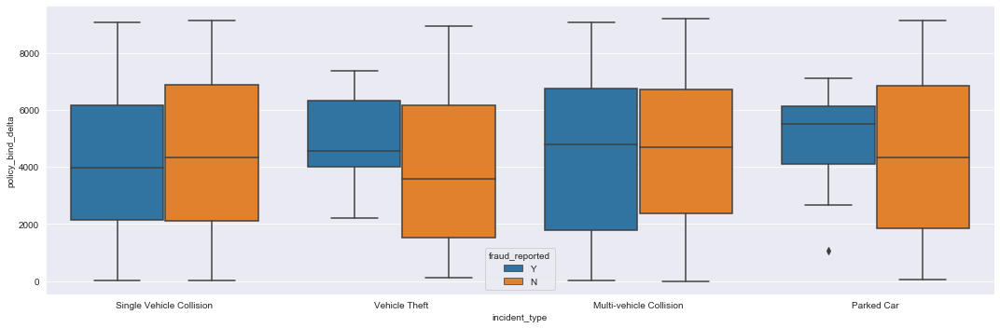

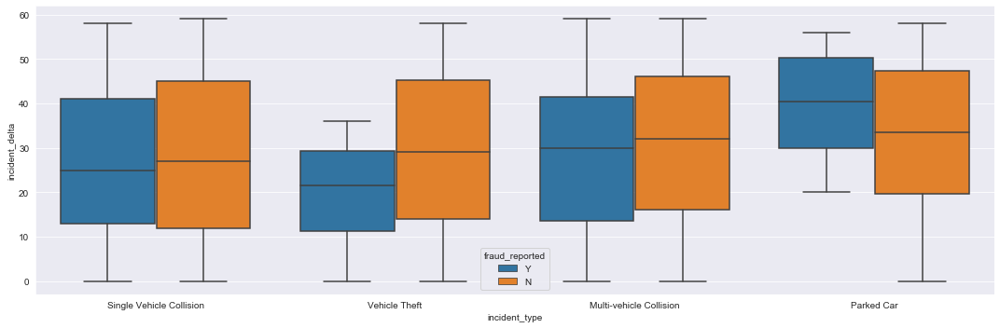

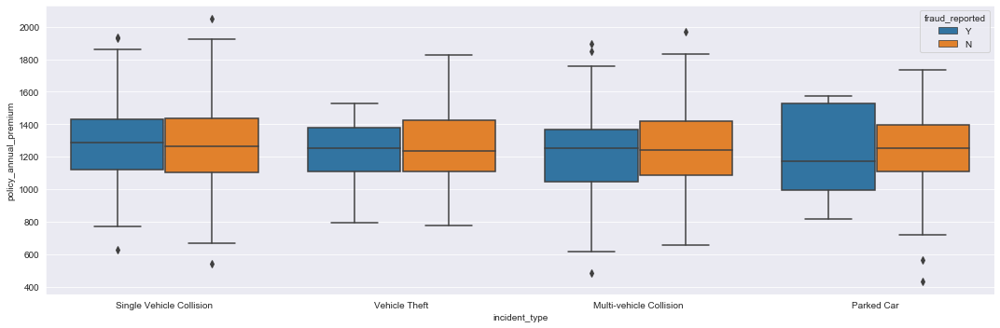



 collision_type 




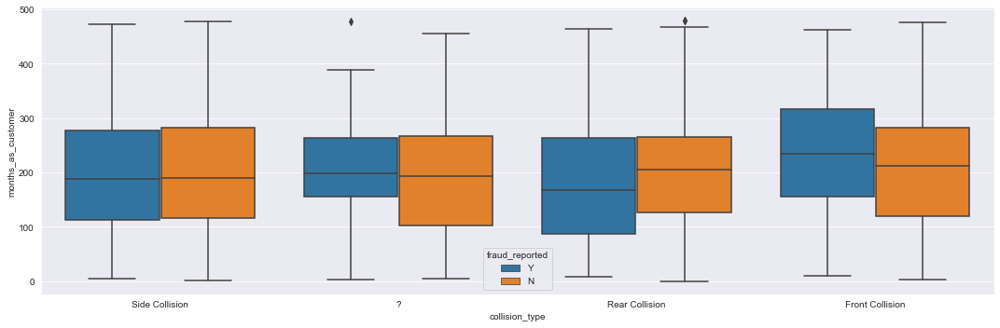

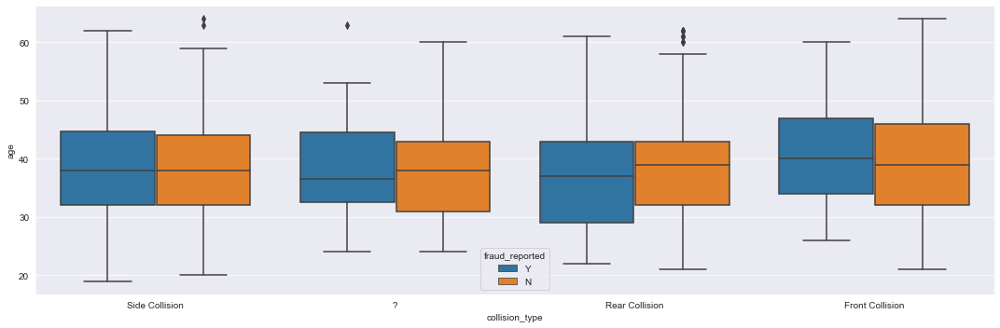

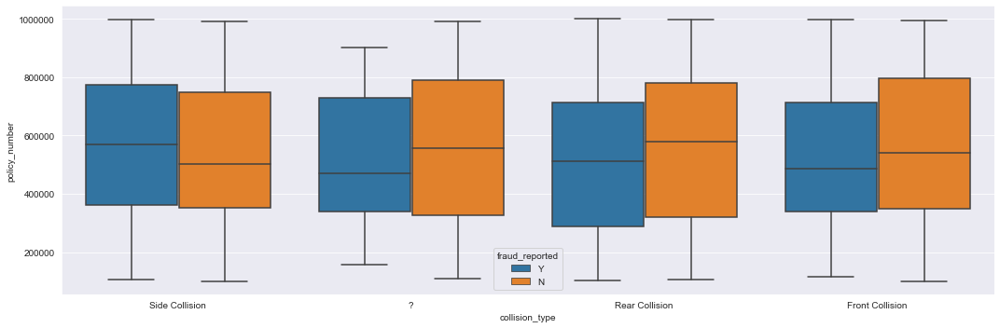

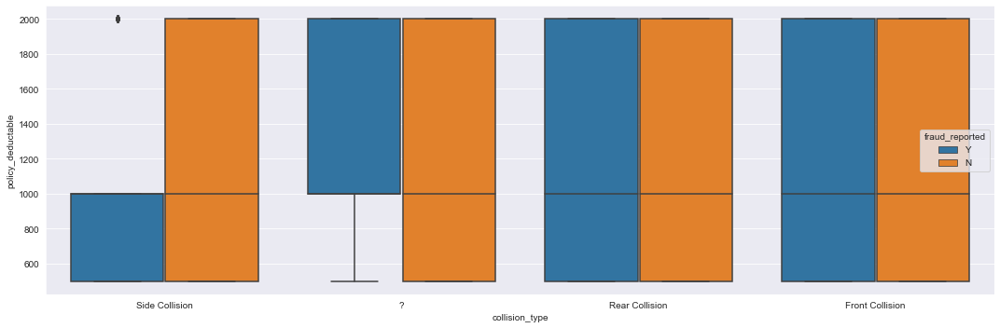

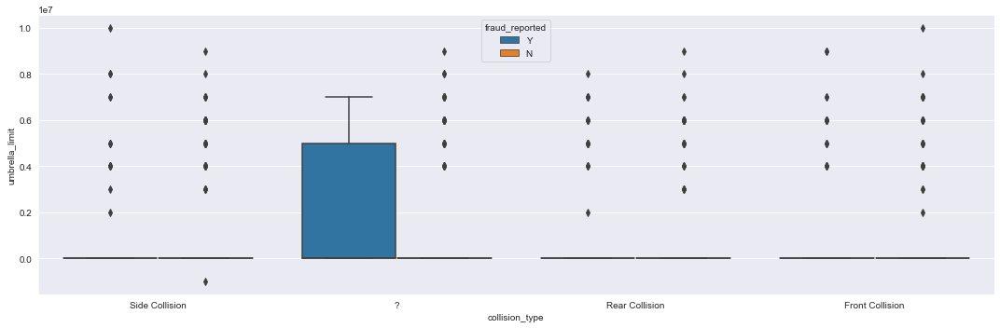

...

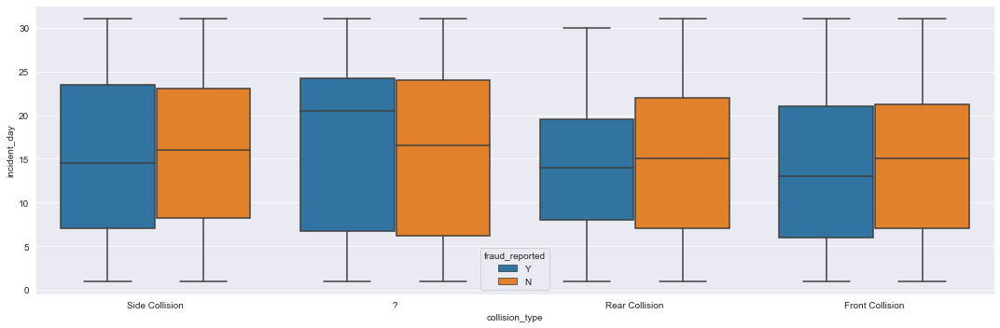

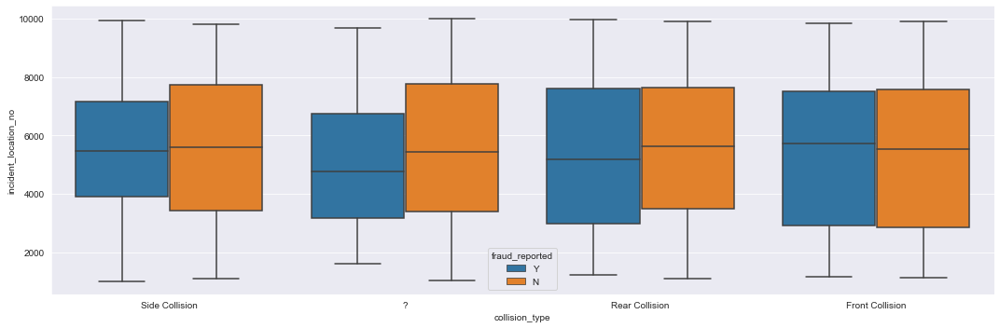

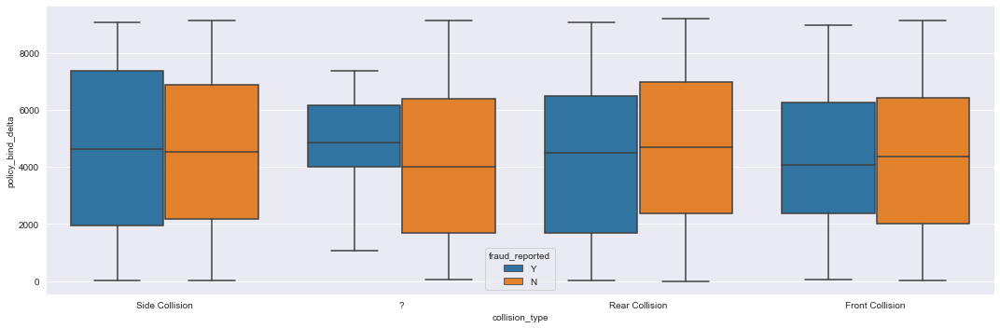

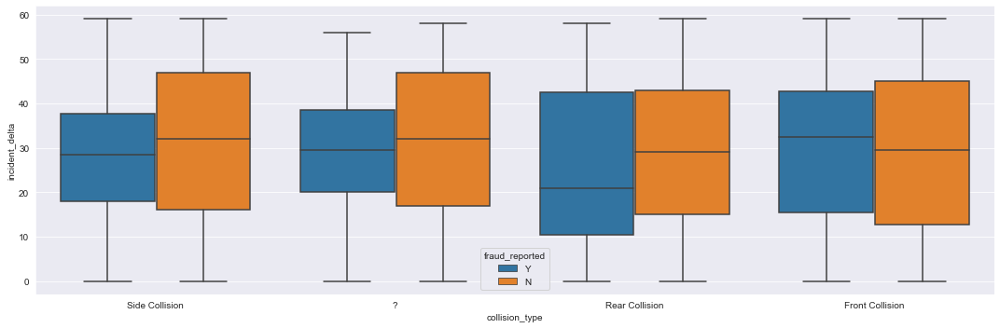

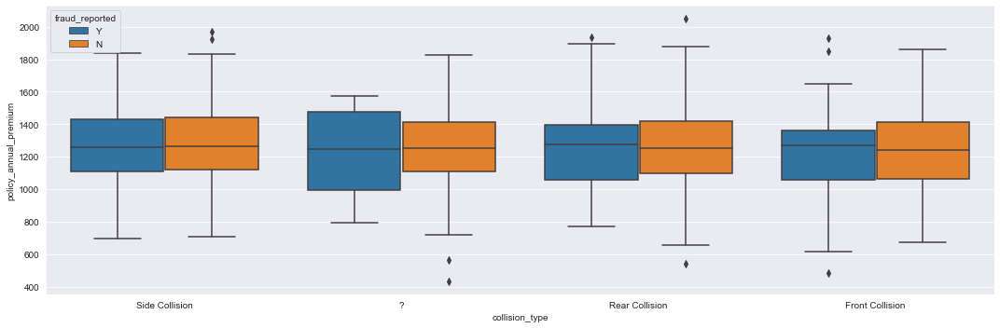



 incident_severity 




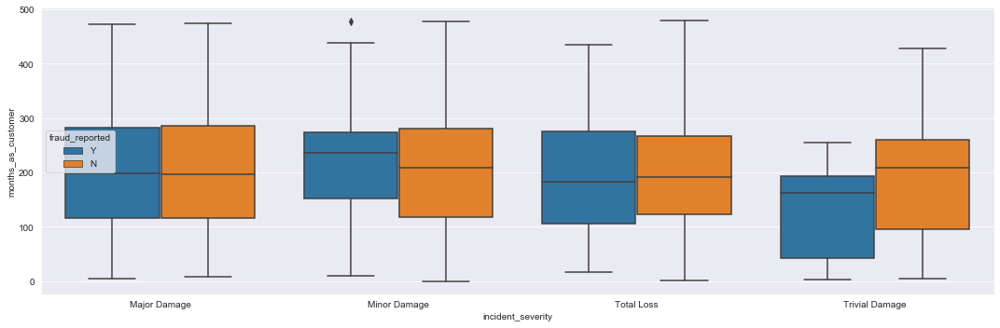

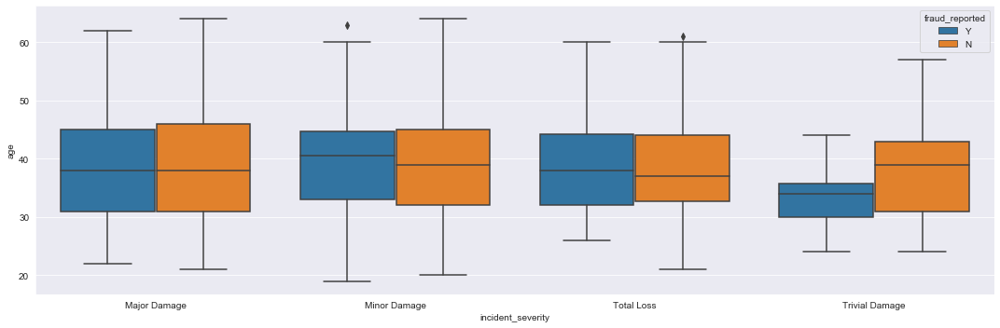

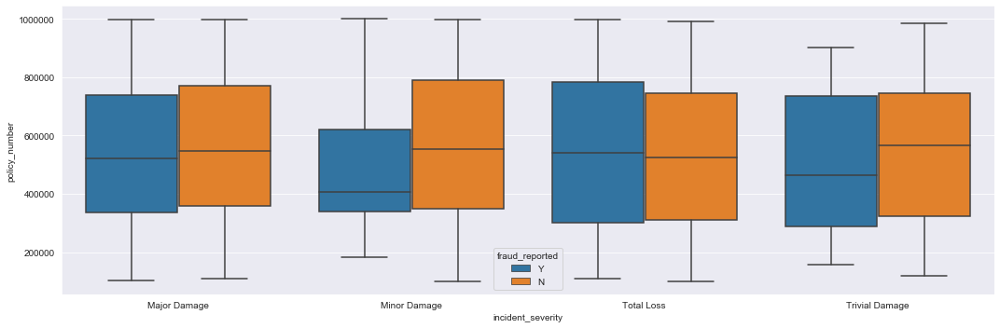

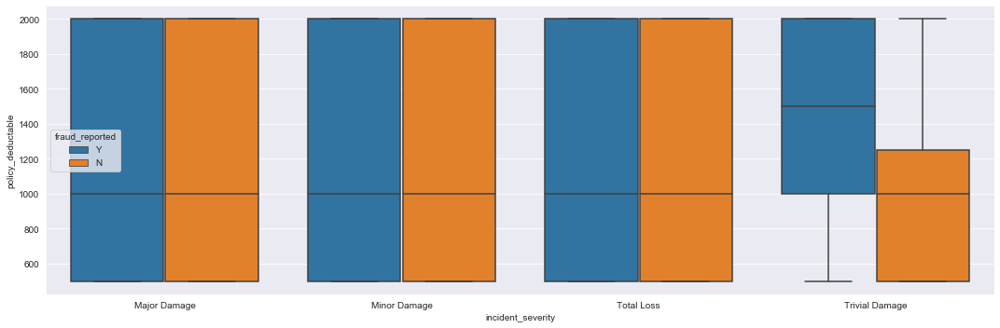

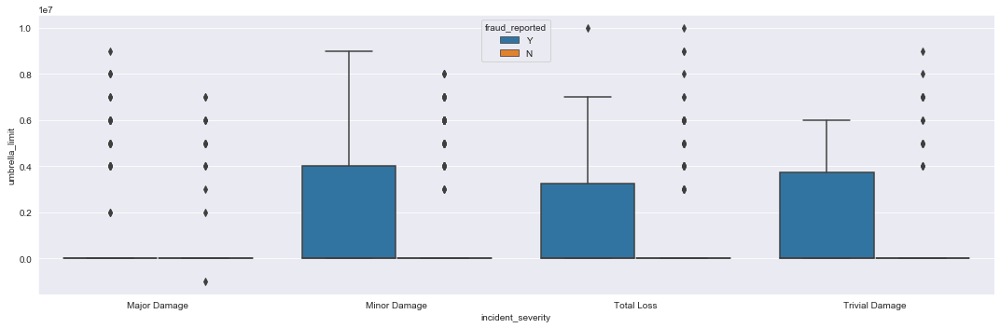

...

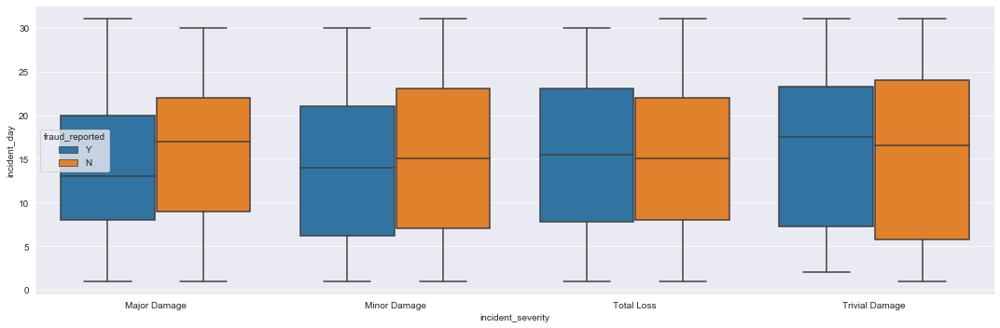

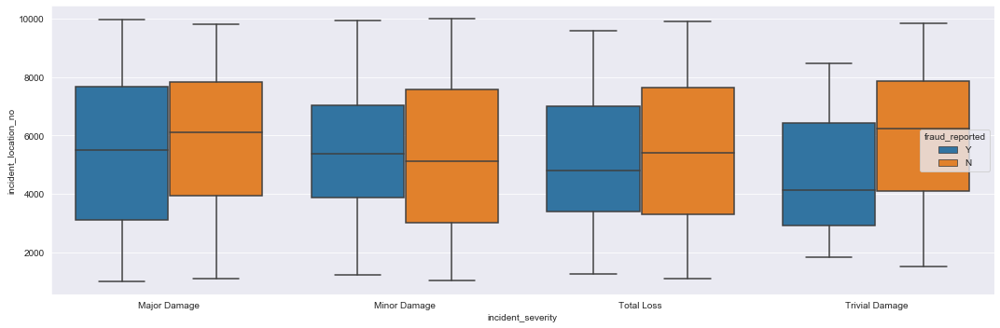

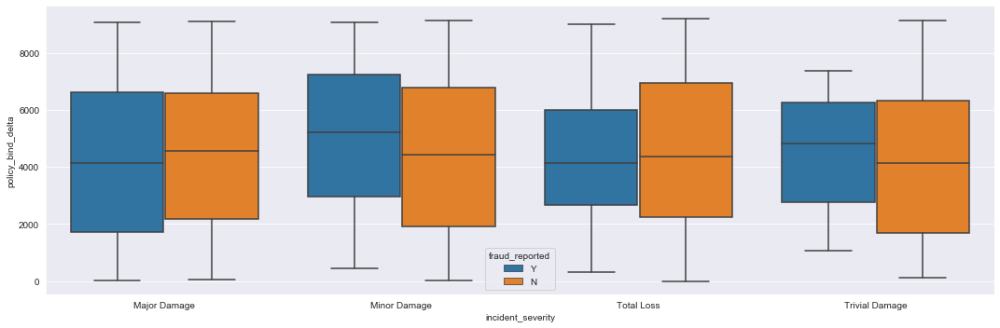

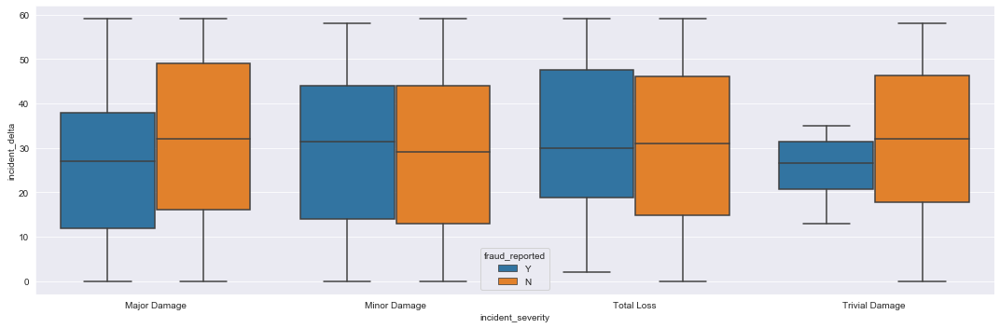

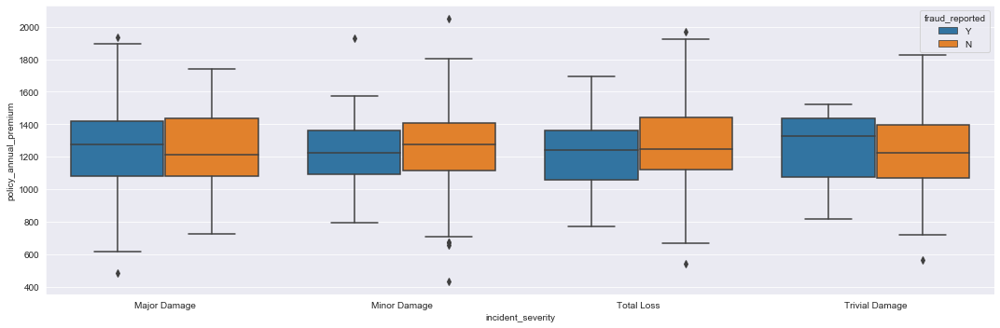



 authorities_contacted 




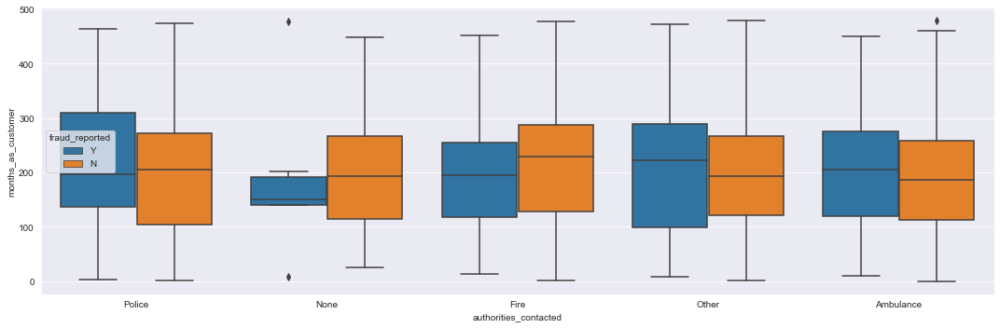

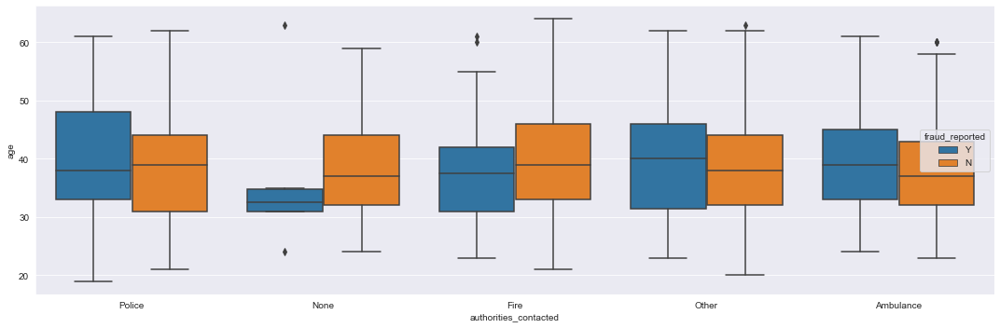

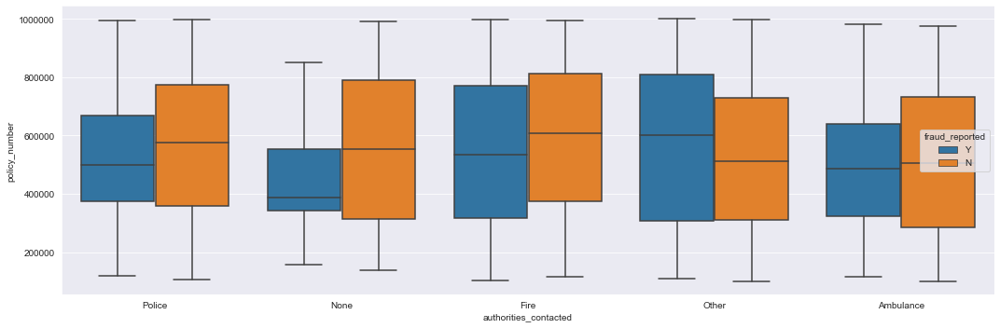

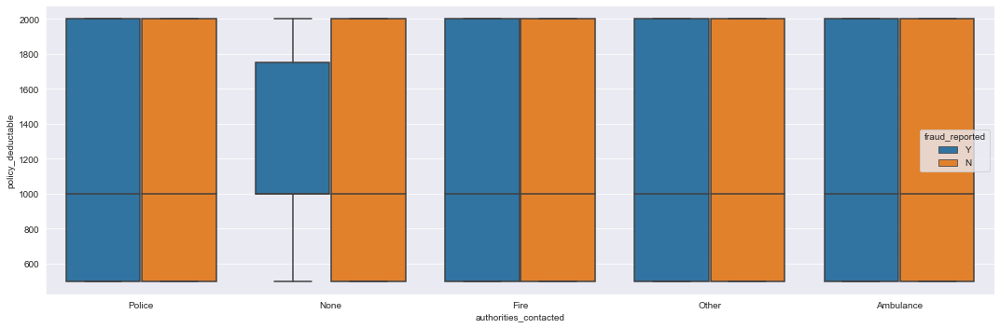

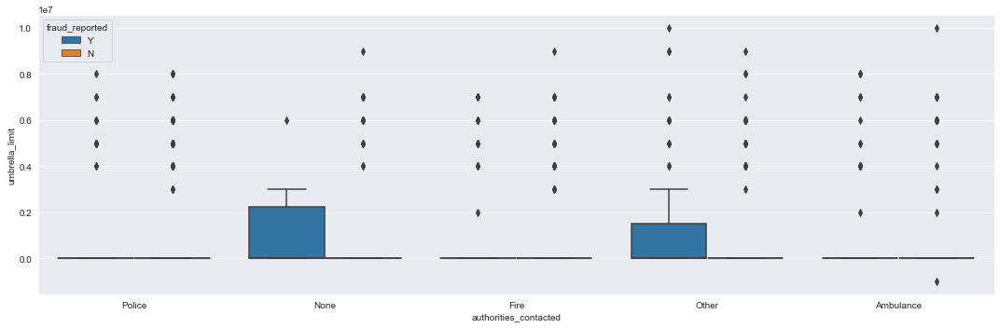

...

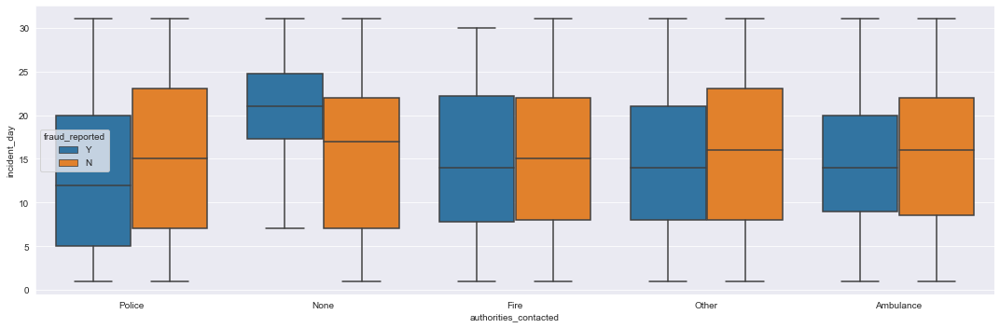

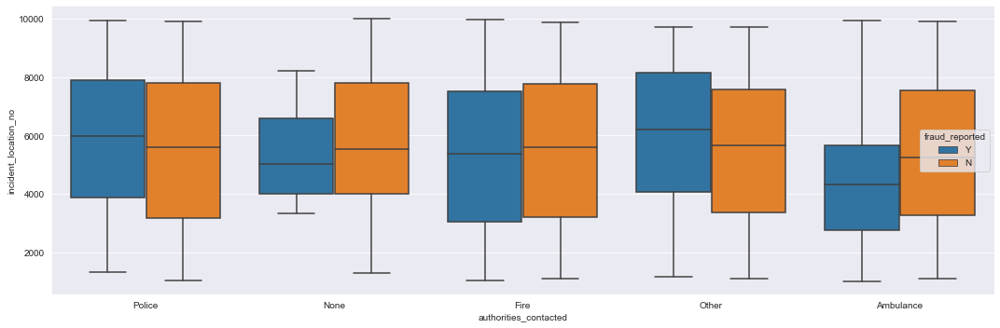

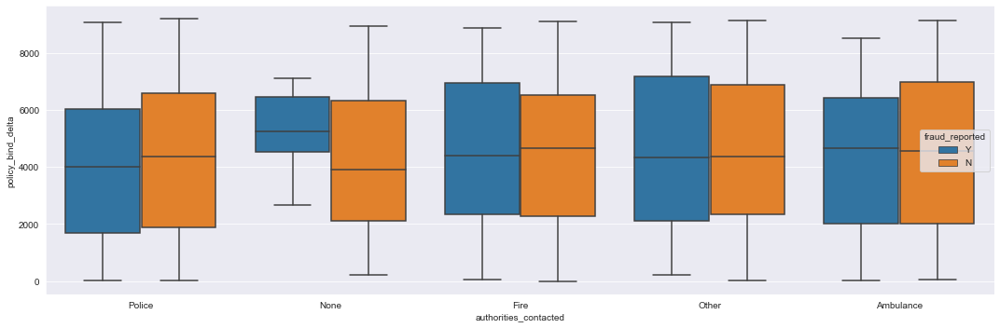

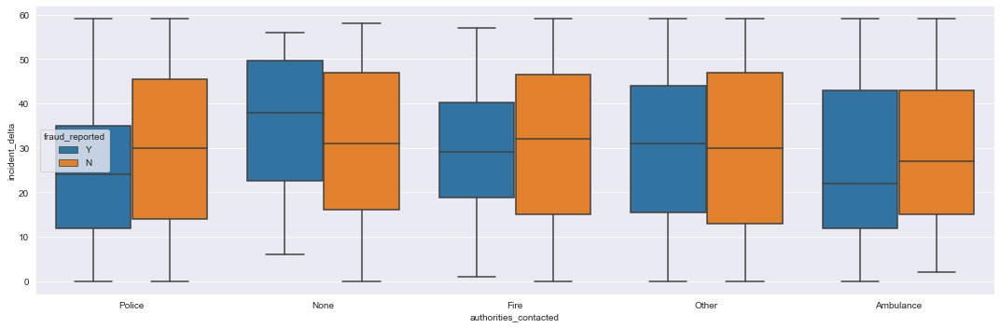

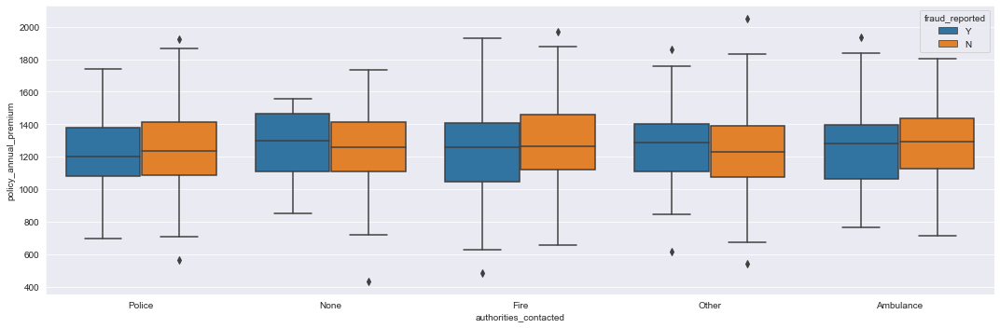



 incident_state 




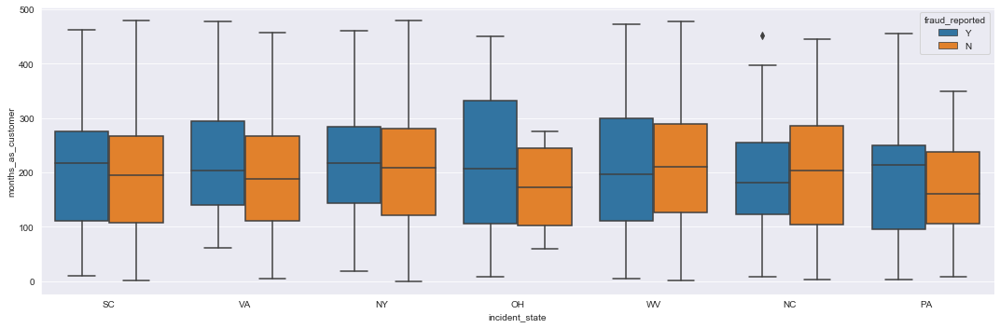

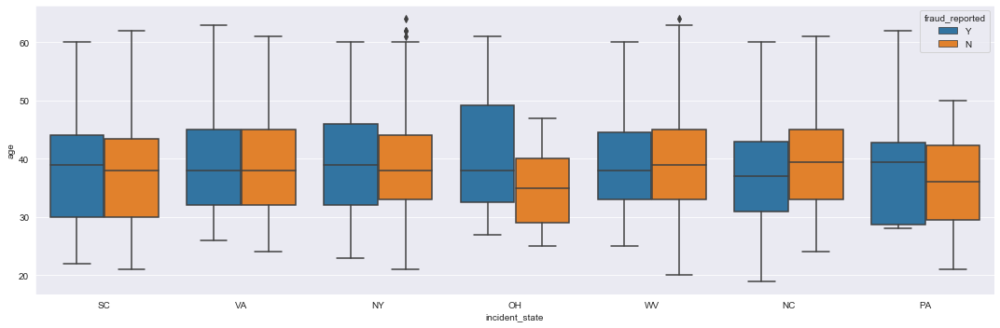

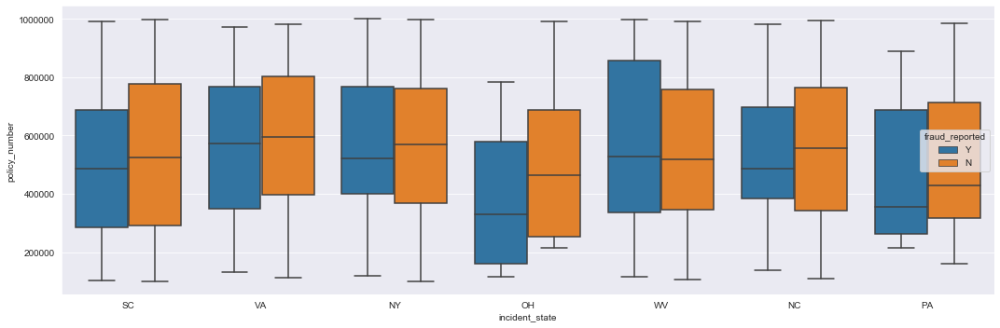

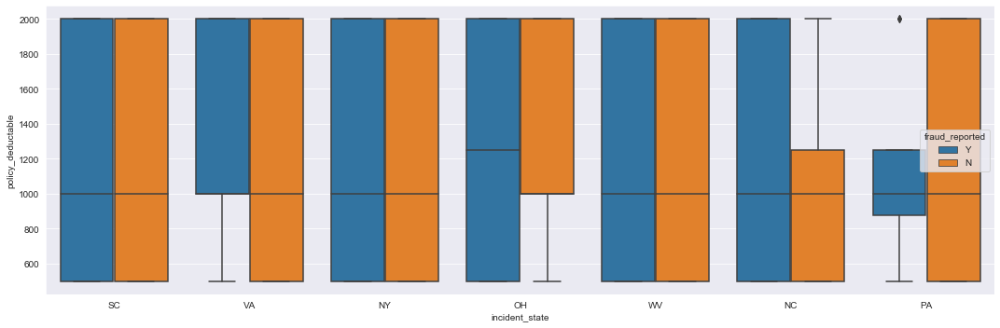

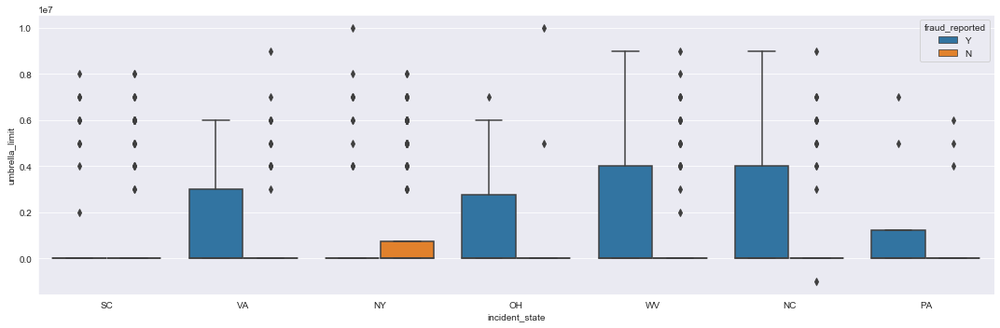

...

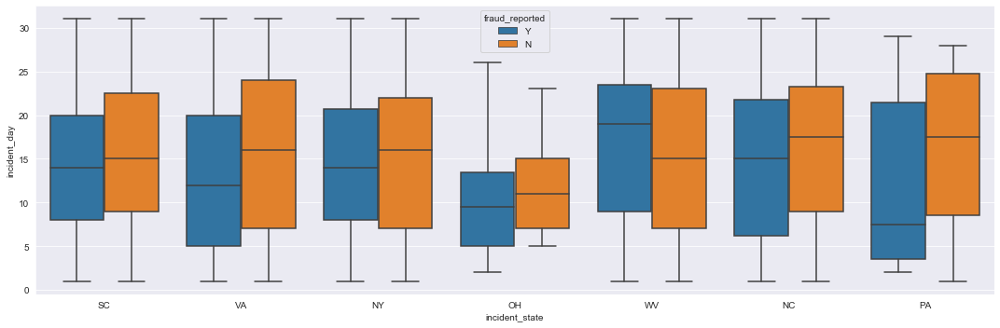

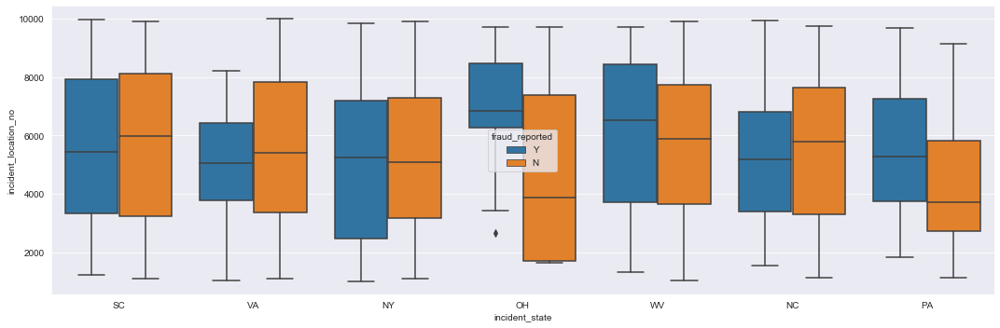

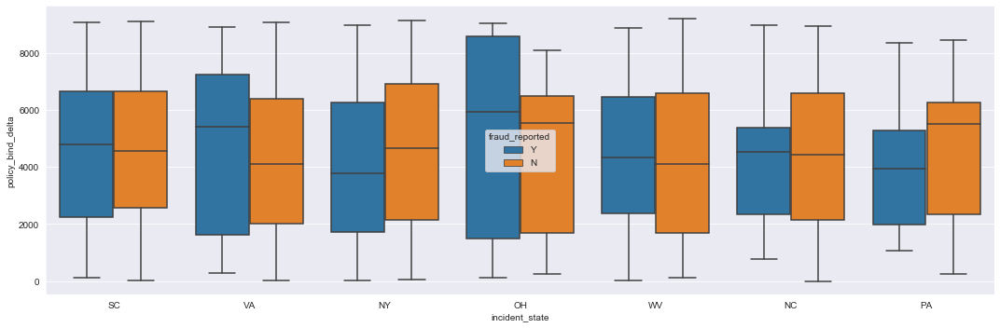

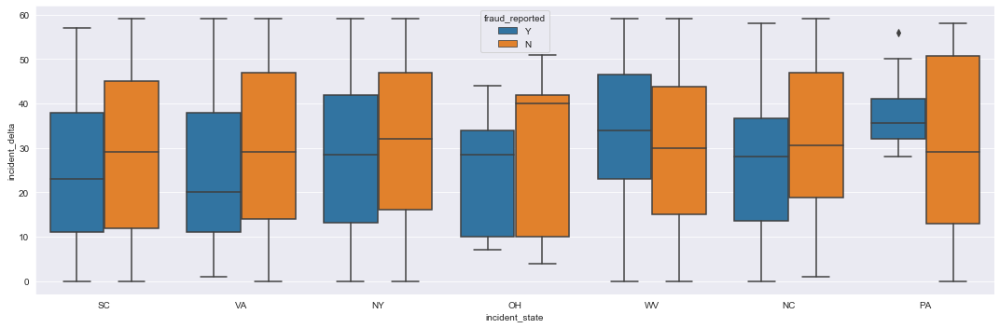

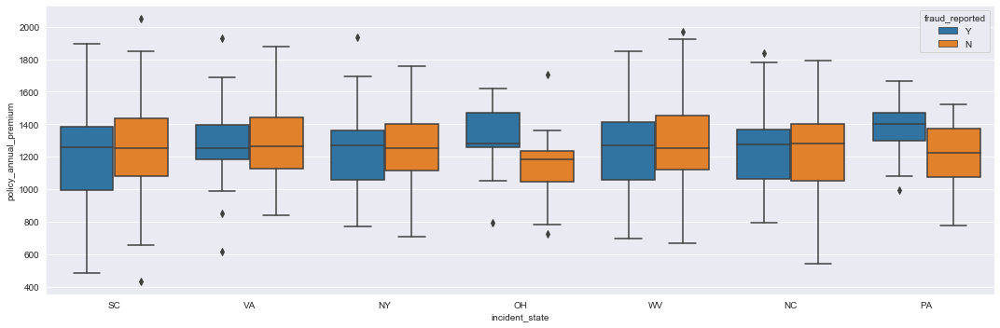



 incident_city 




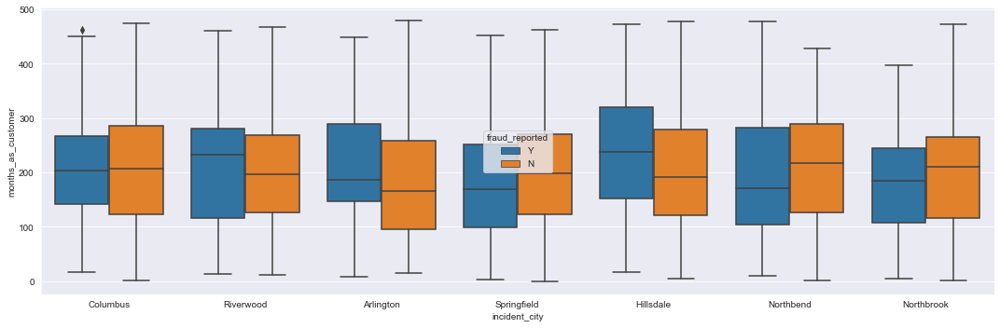

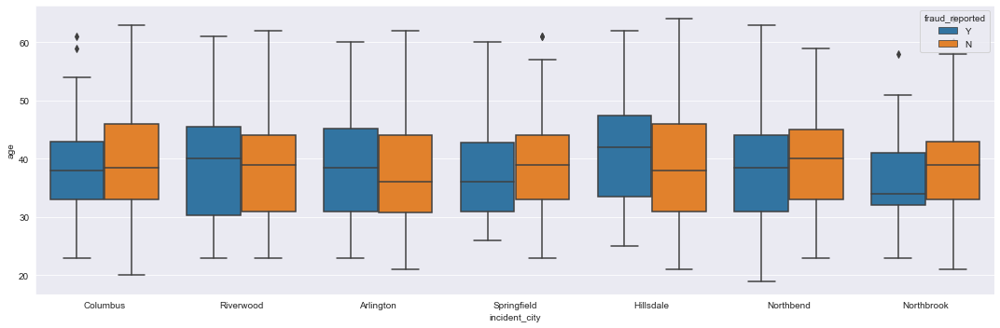

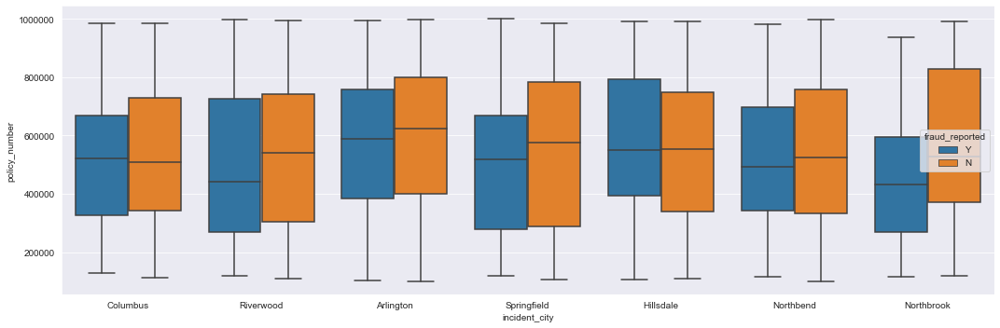

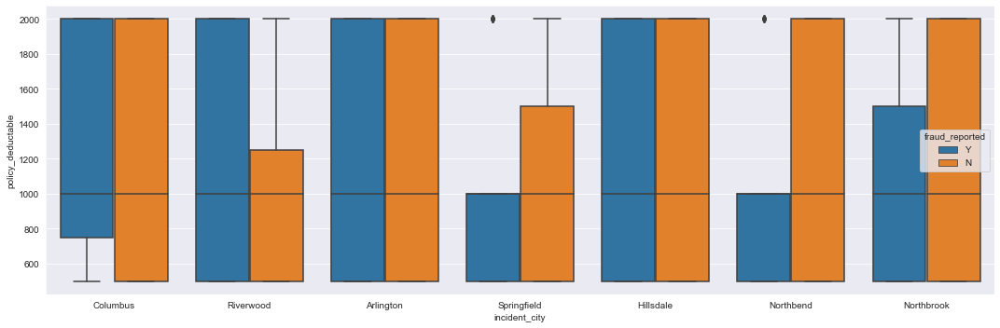

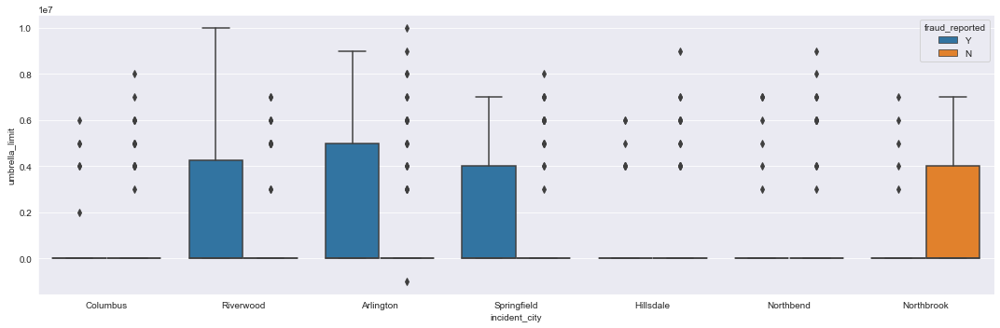

...

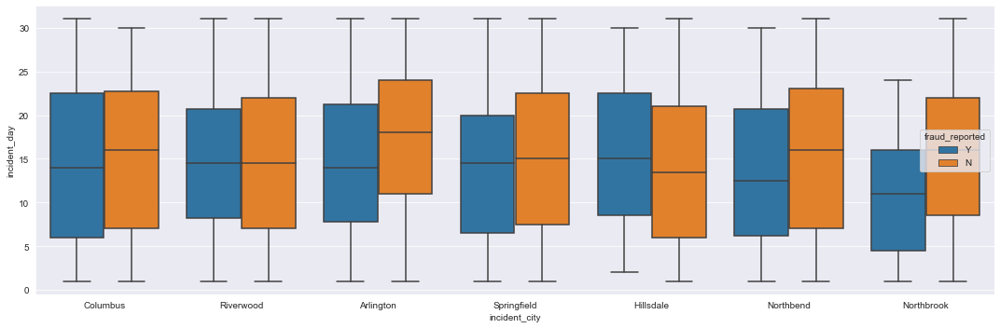

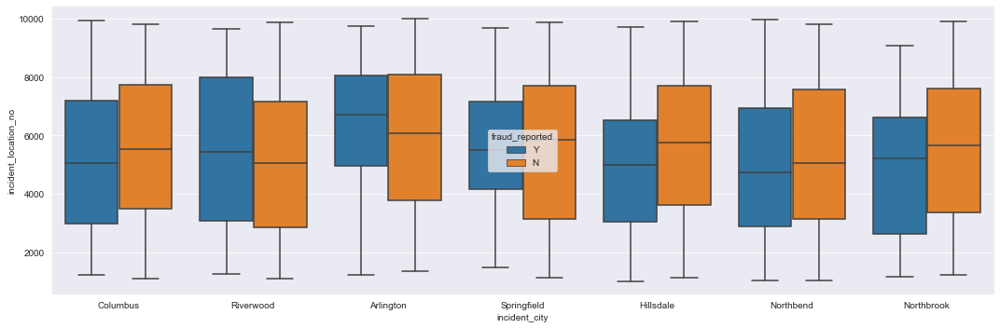

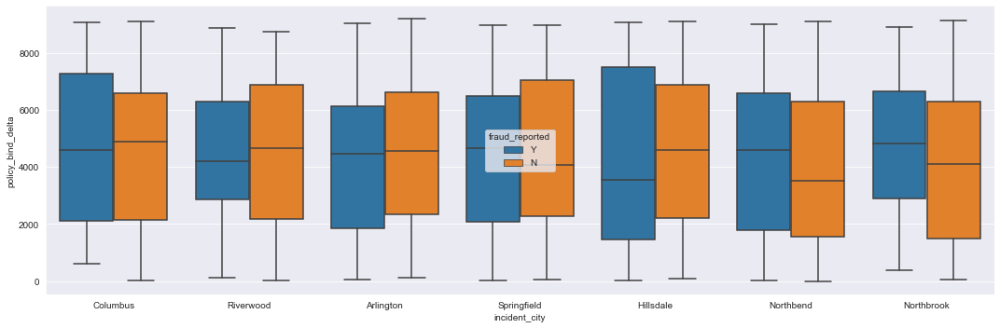

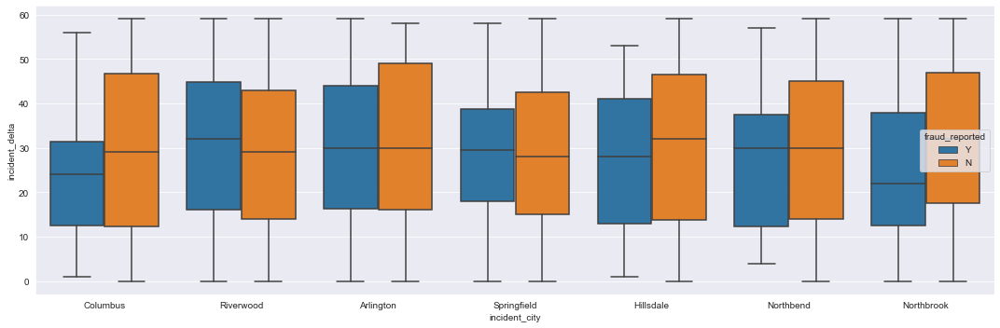

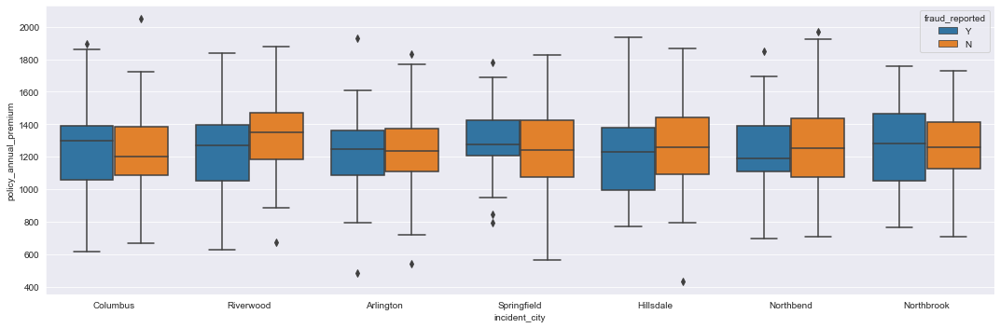



 property_damage 




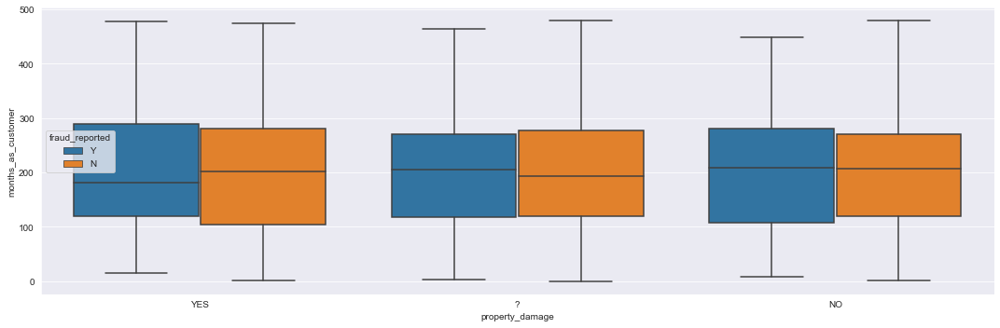

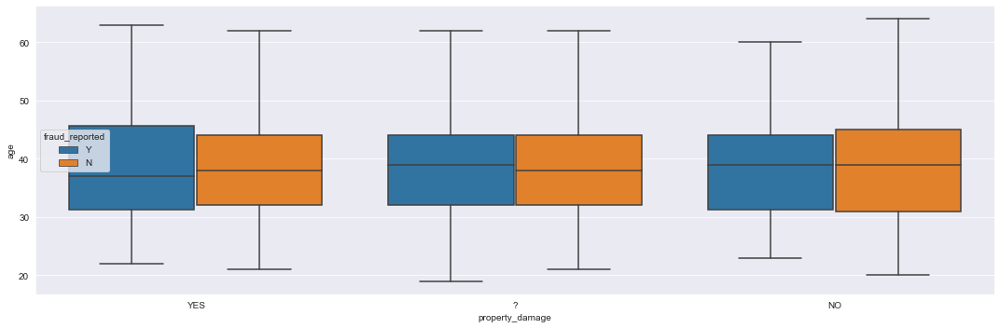

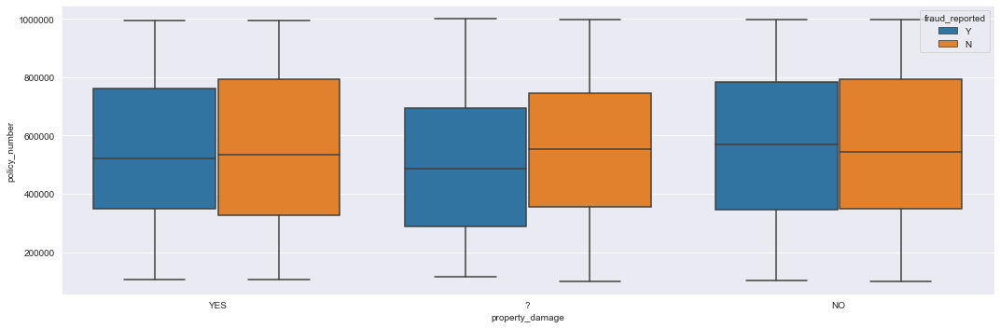

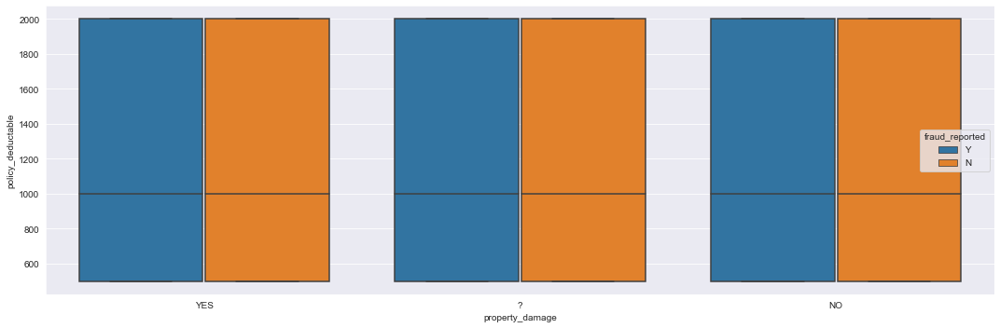

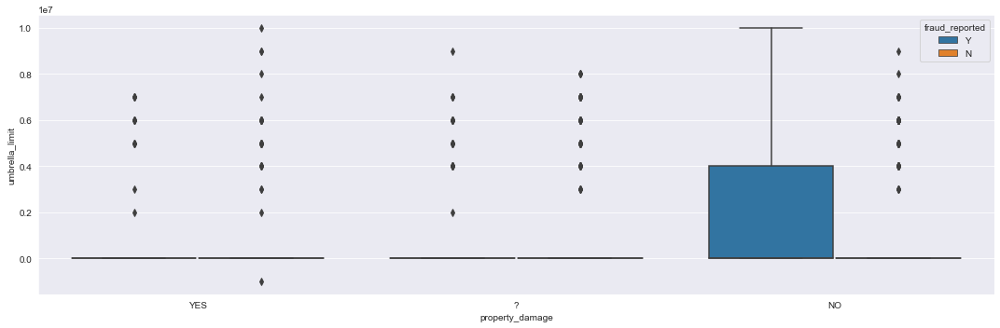

...

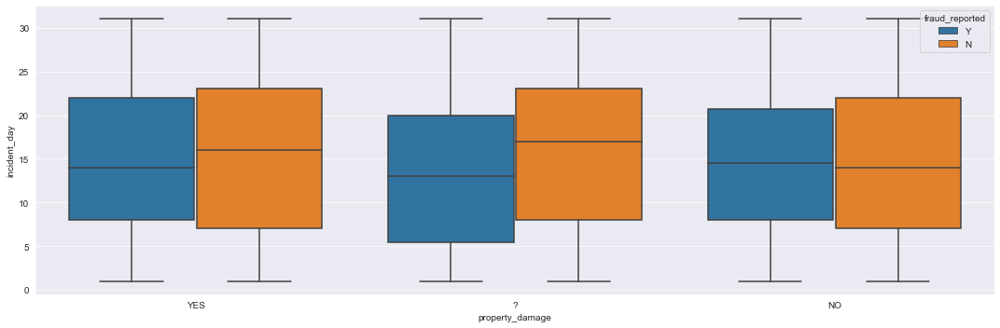

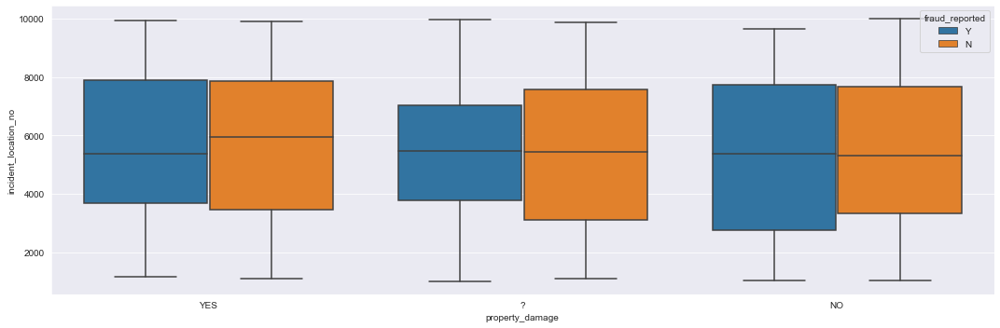

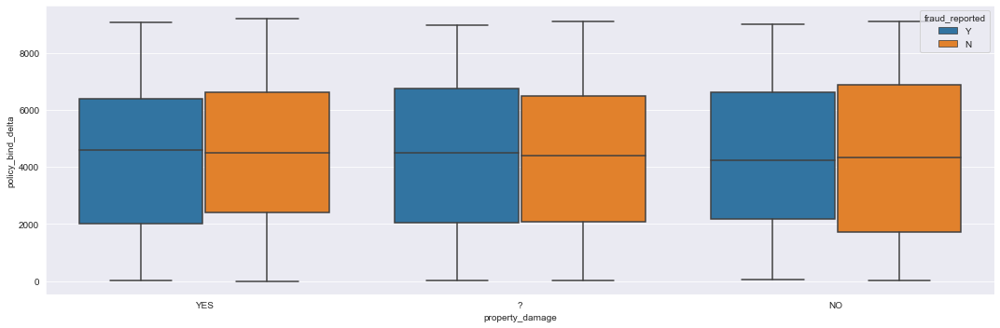

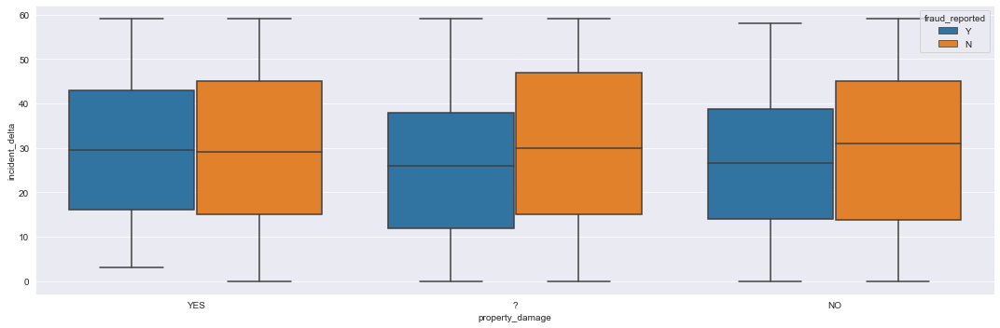

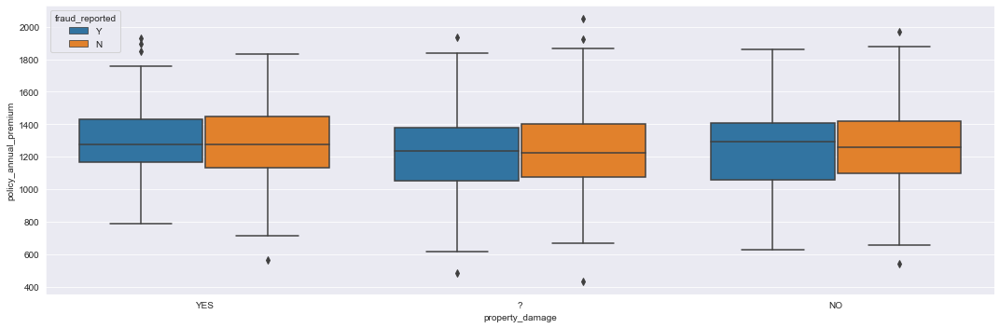



 police_report_available 




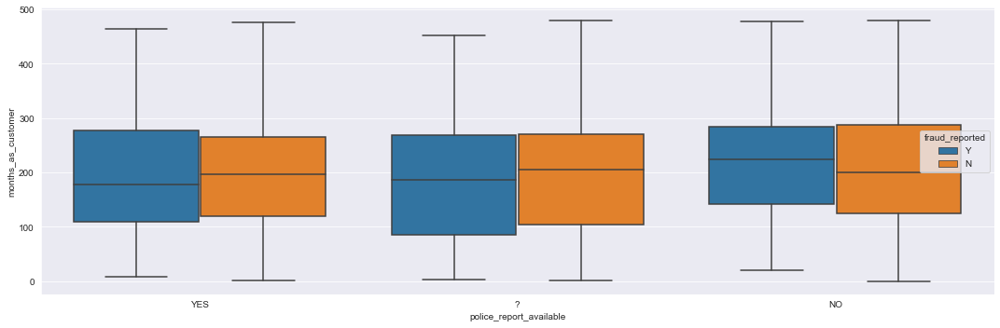

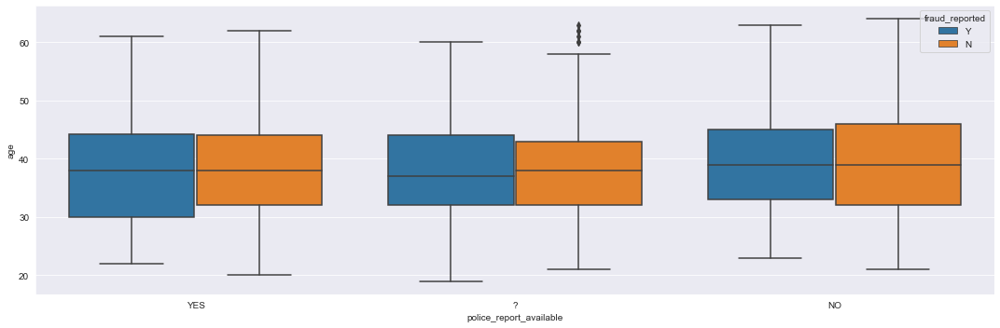

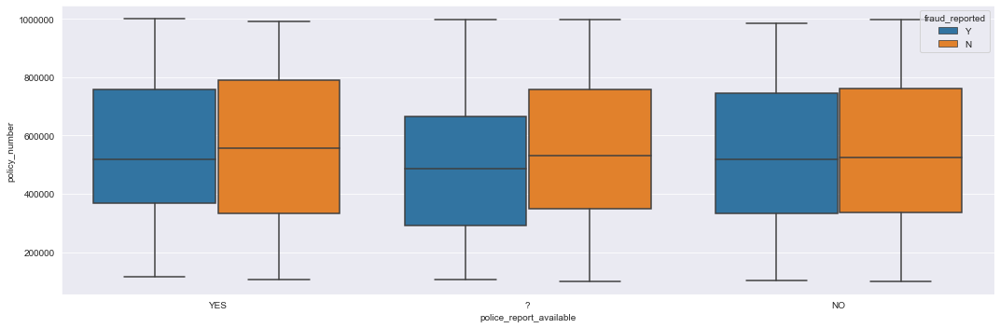

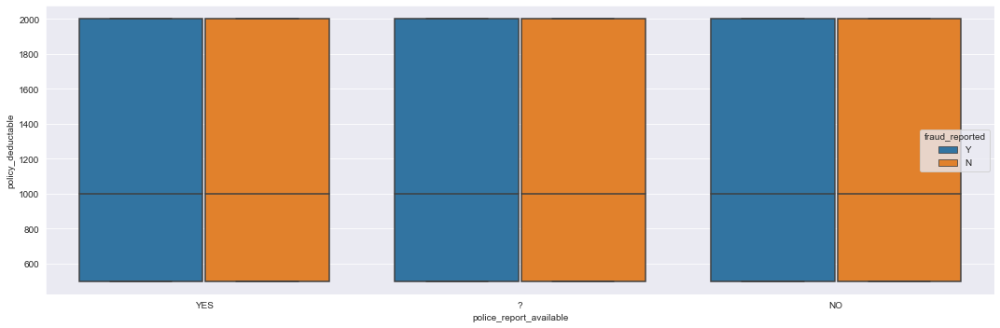

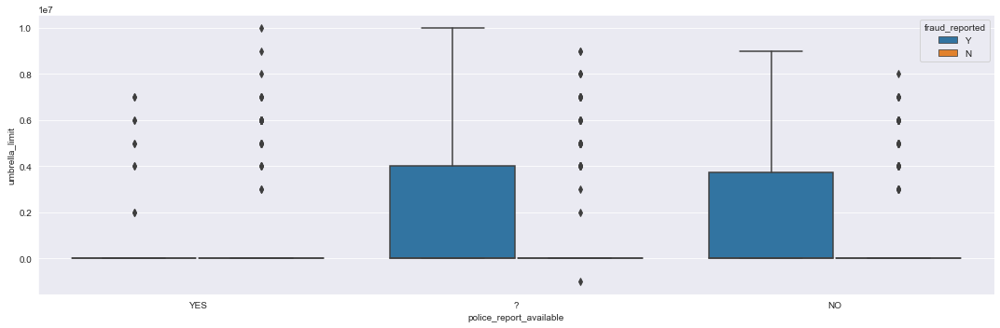

...

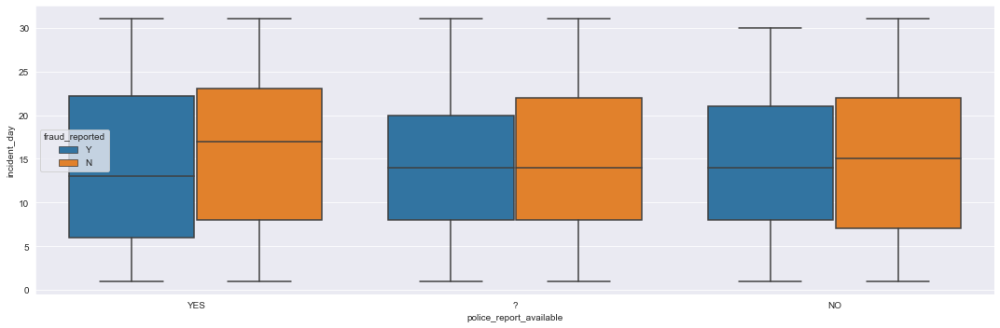

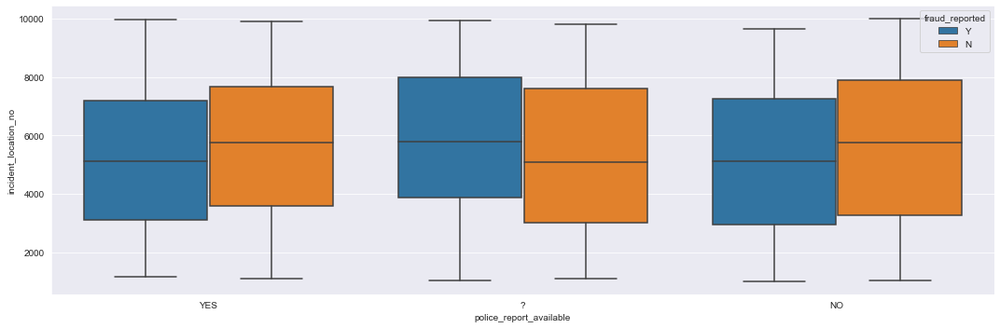

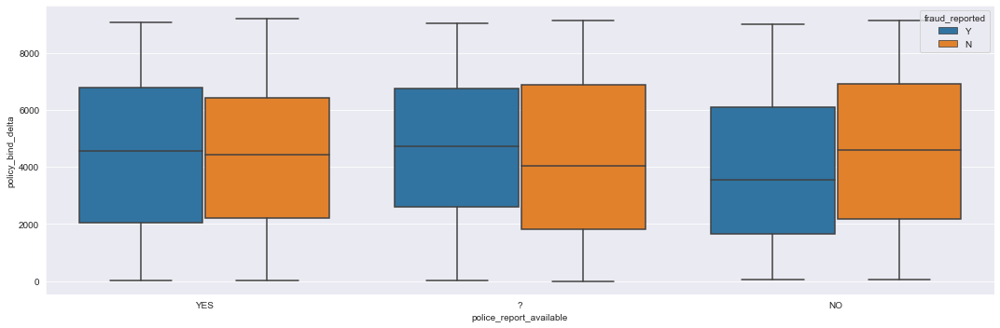

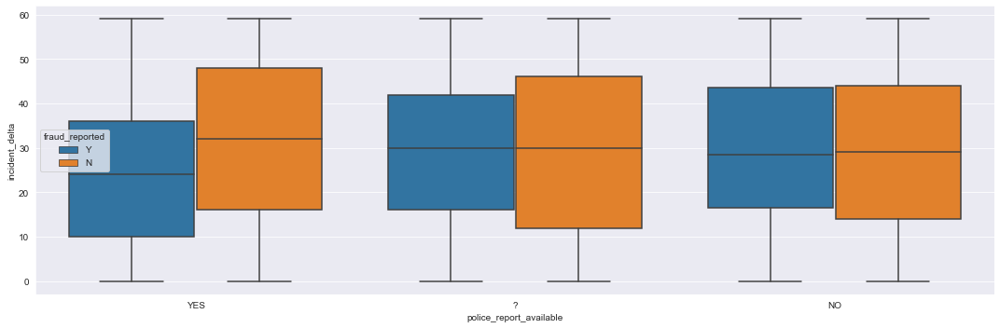

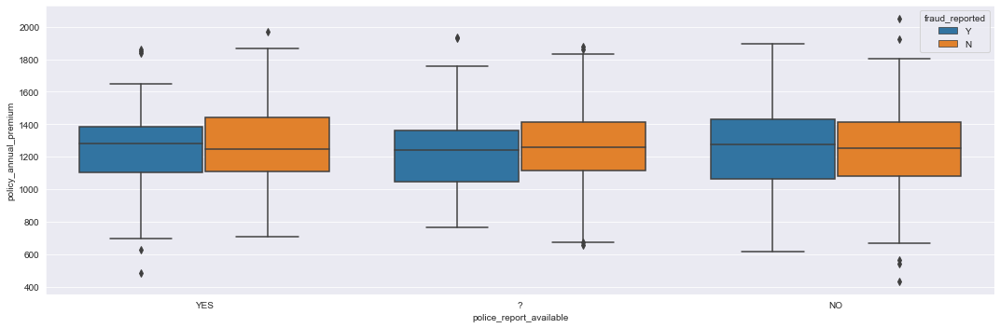



 auto_make 




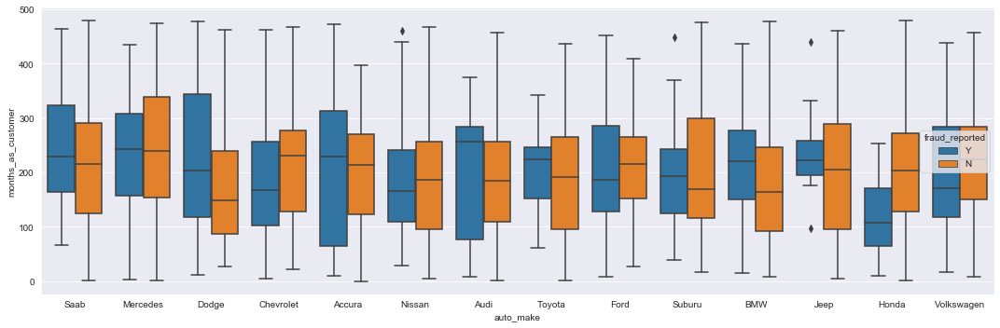

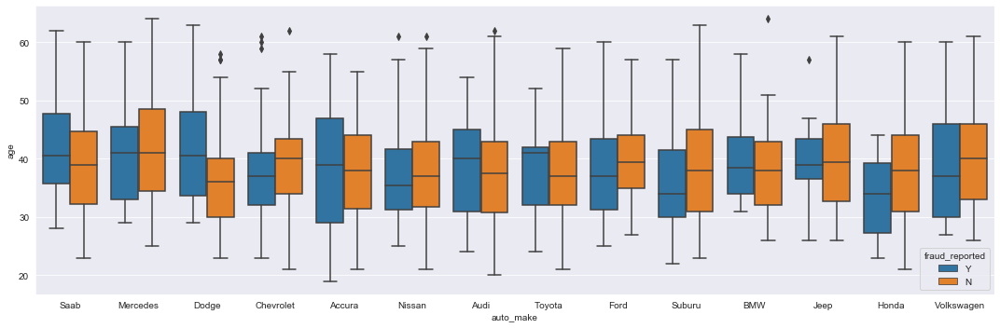

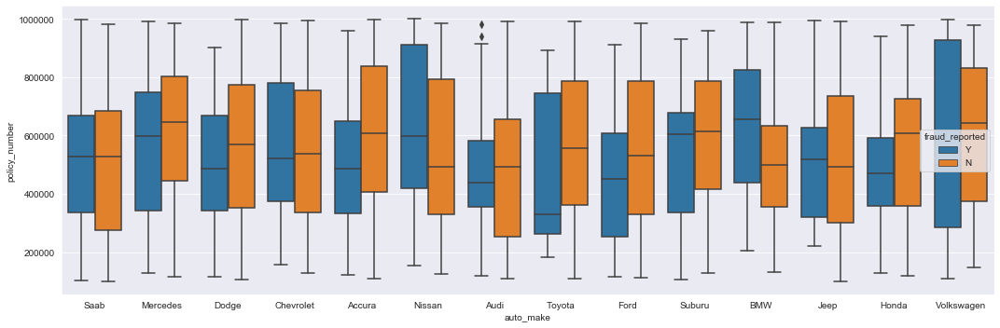

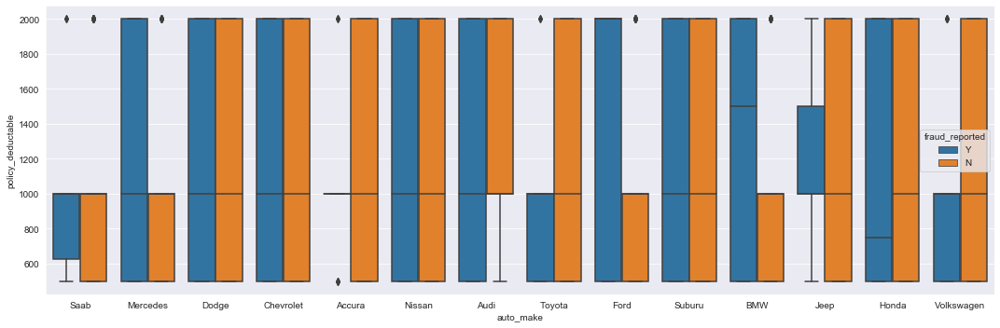

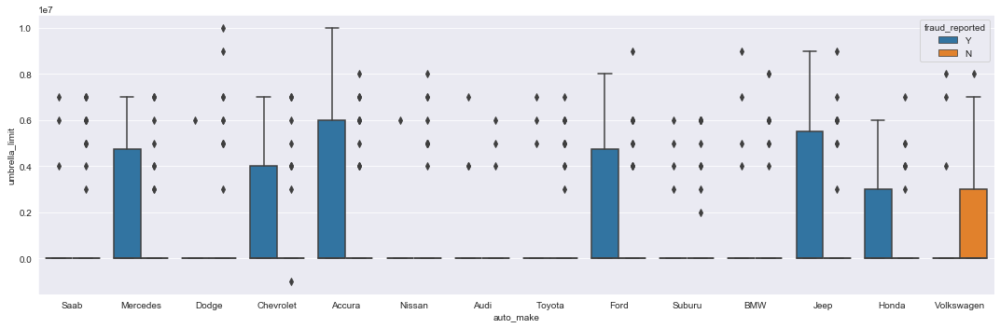

...

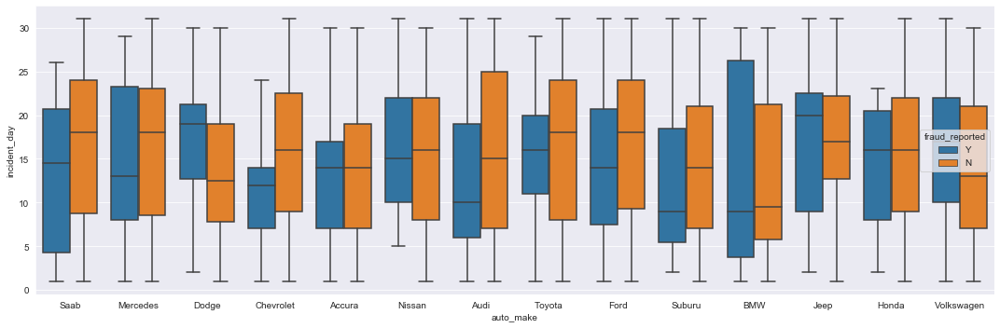

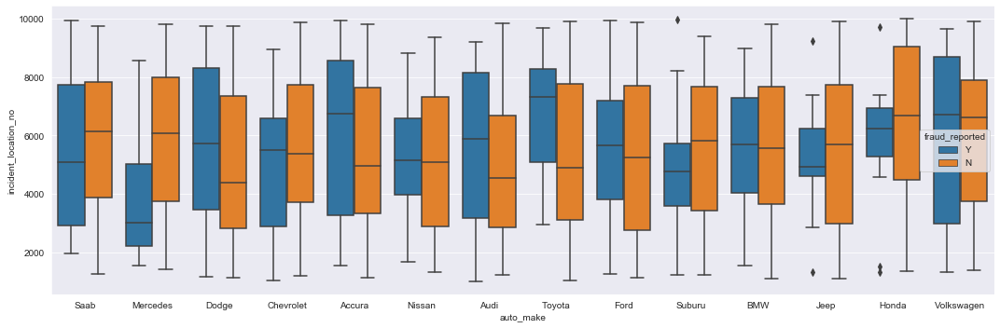

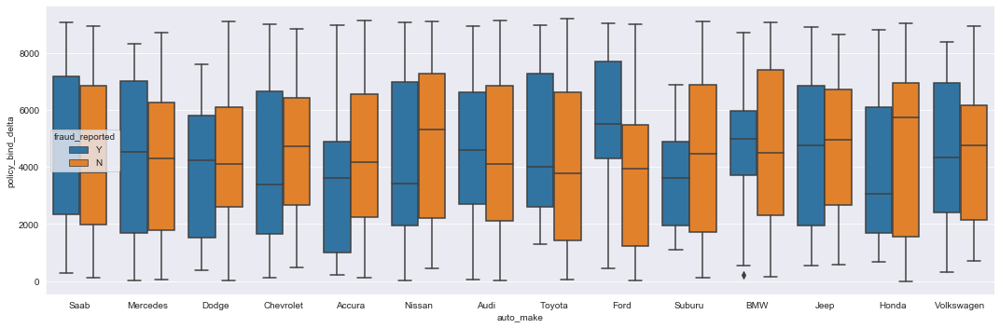

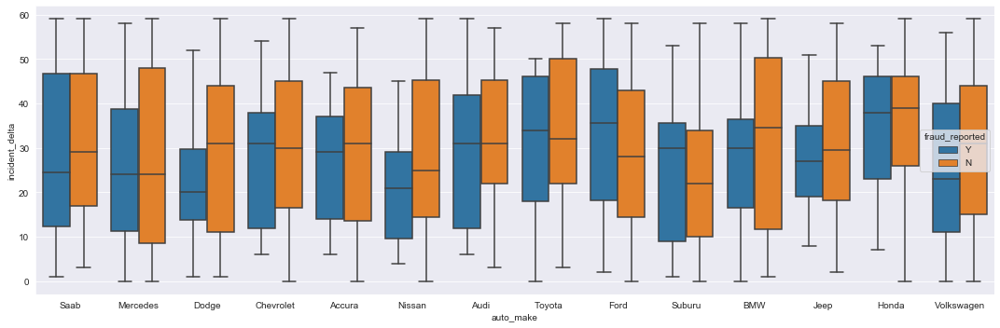

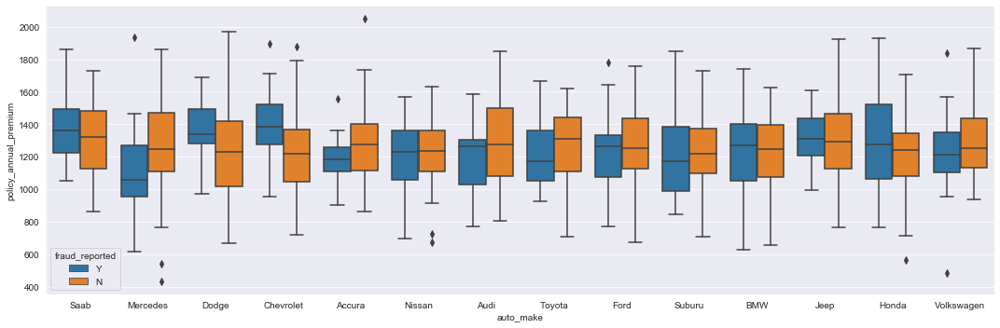



 auto_model 




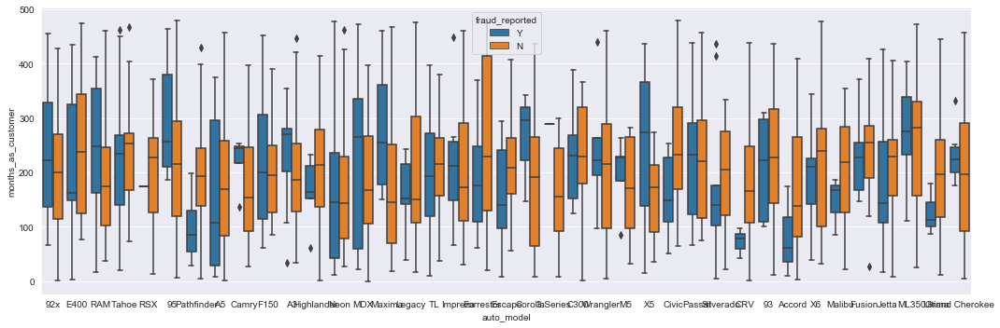

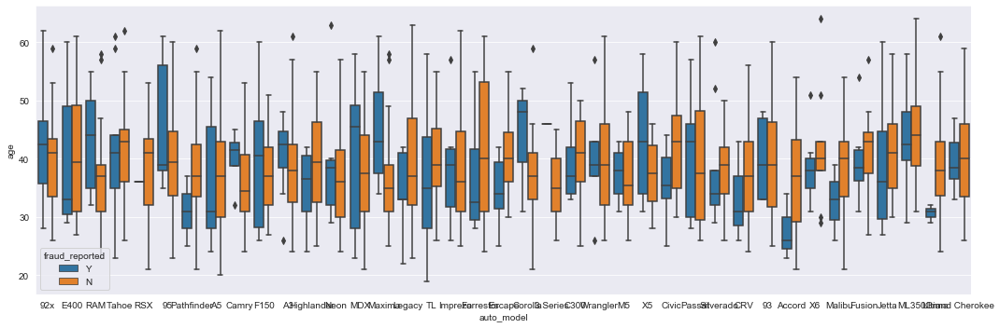

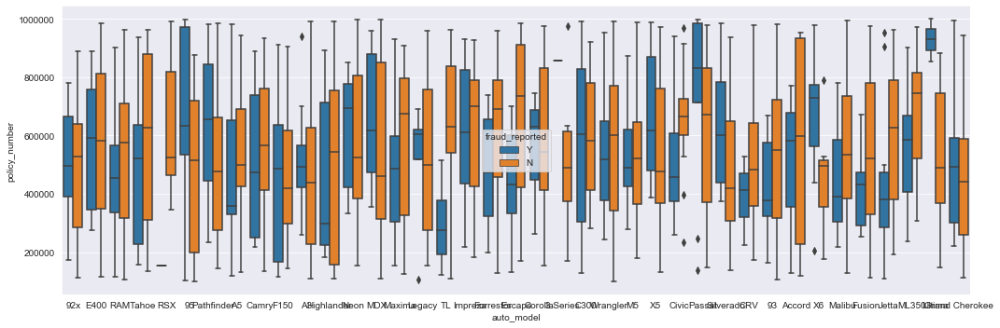

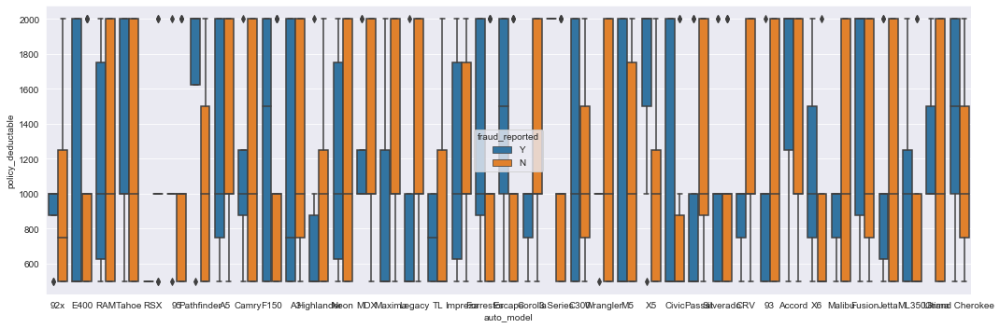

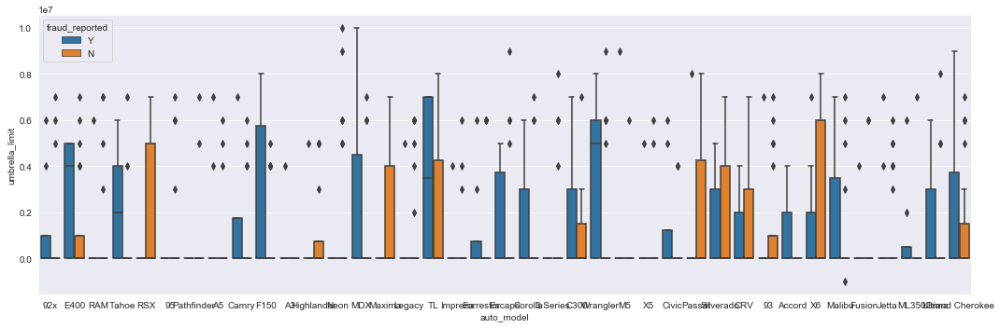

...

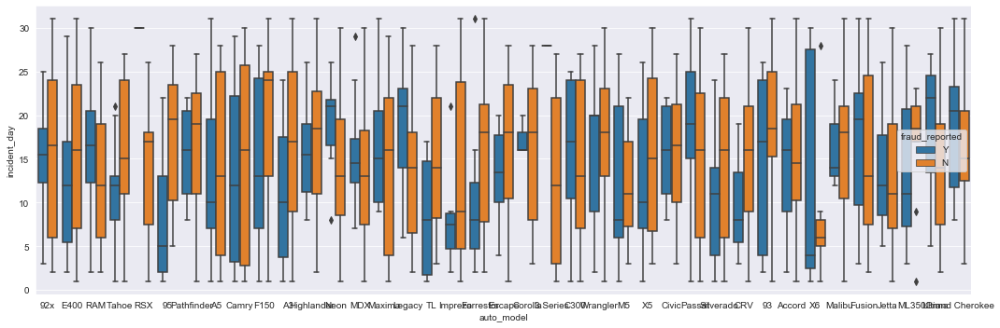

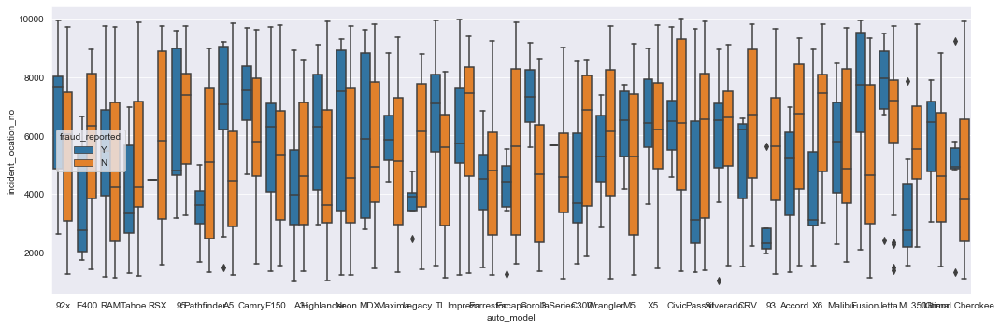

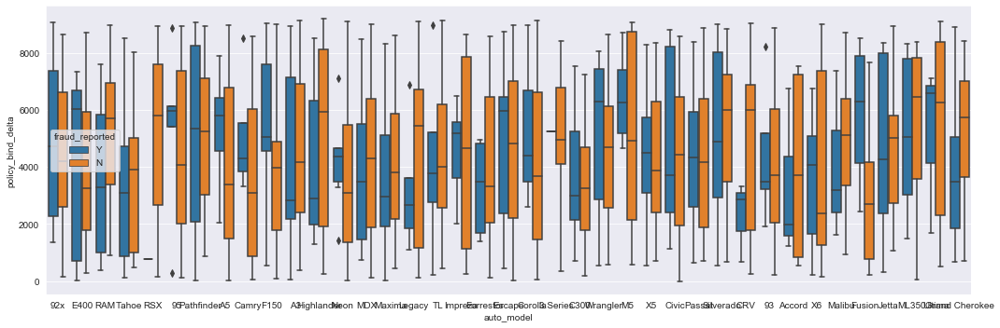

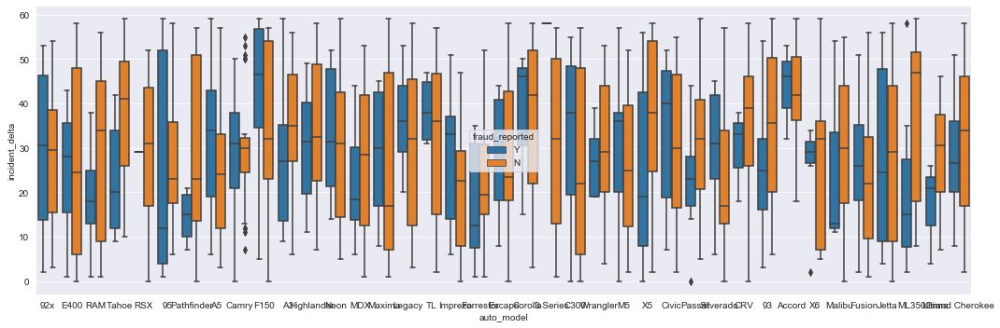

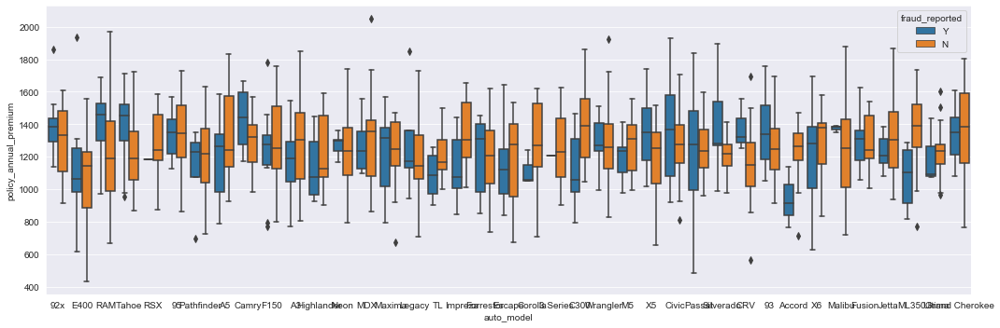



 fraud_reported 




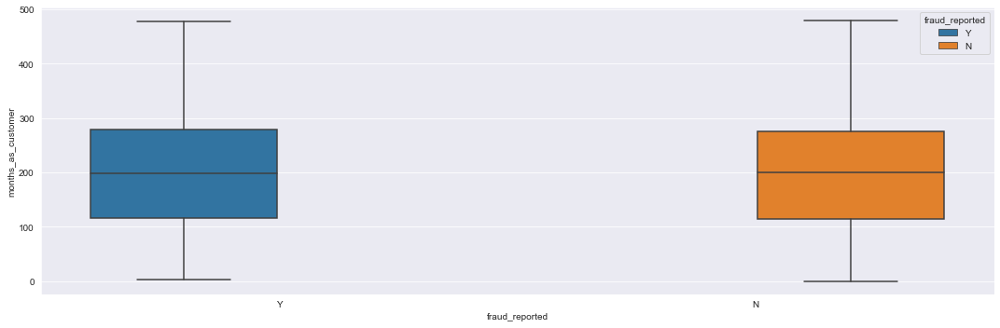

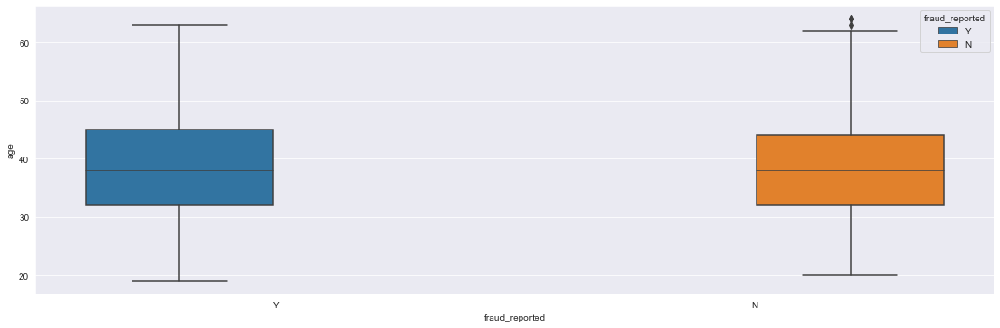

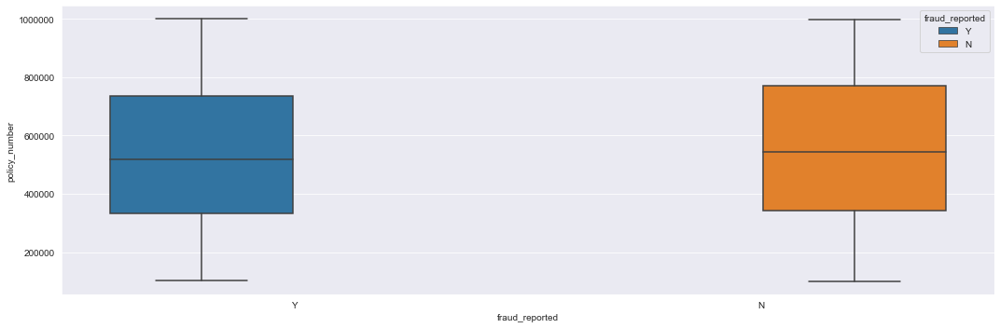

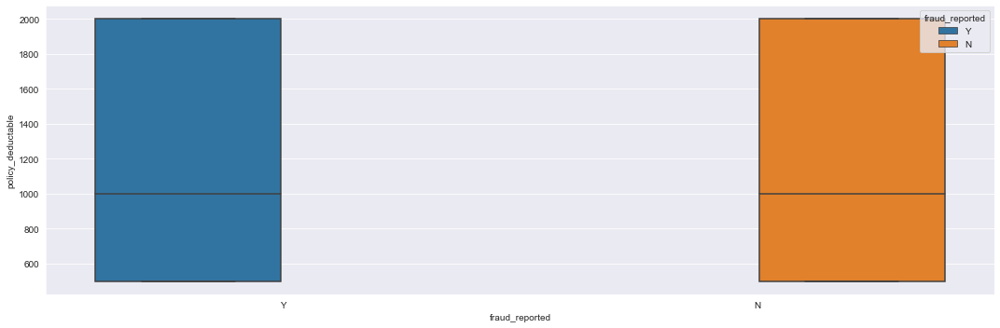

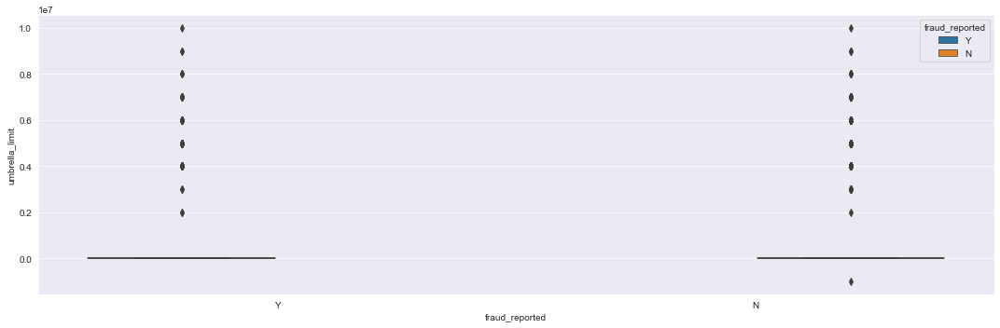

...

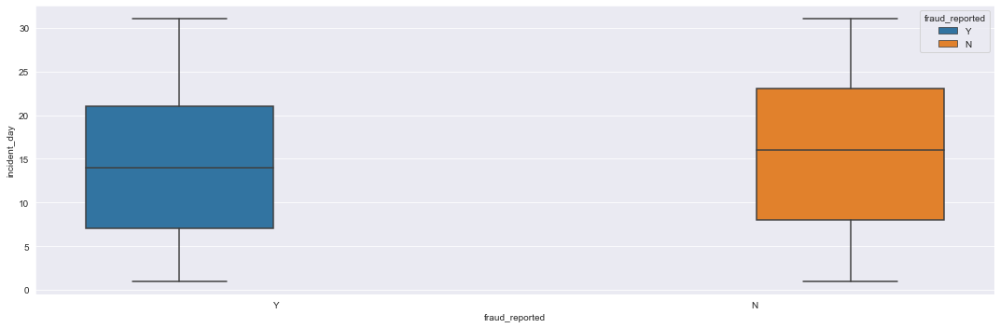

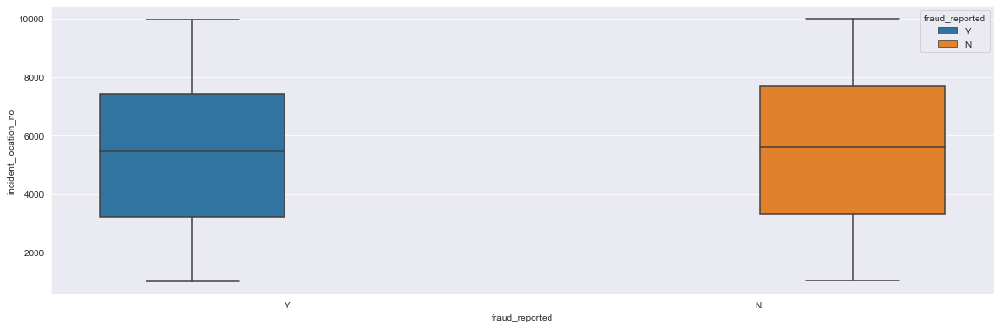

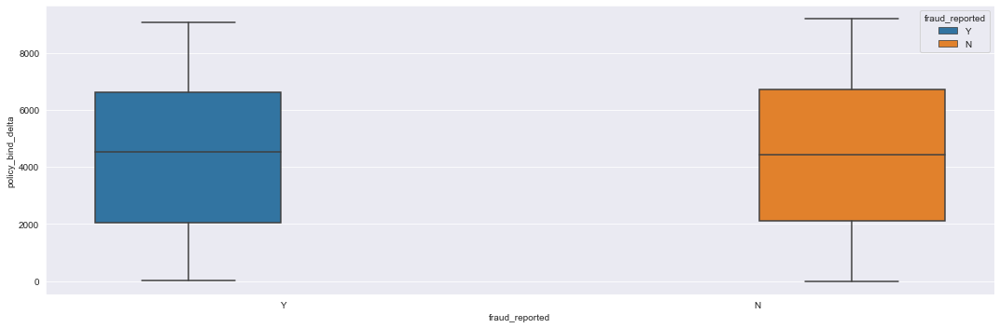

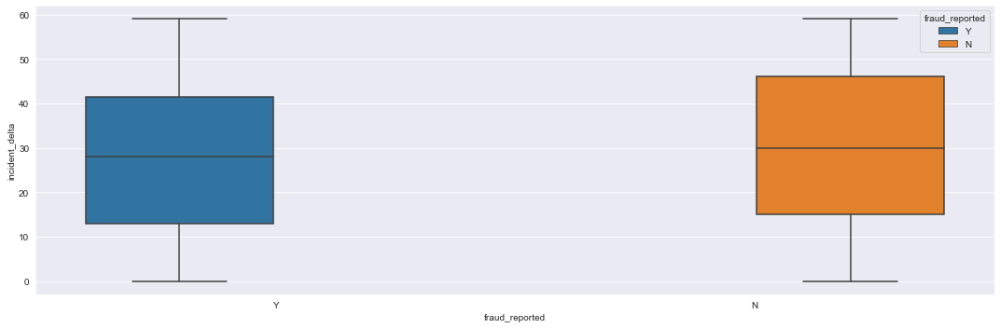

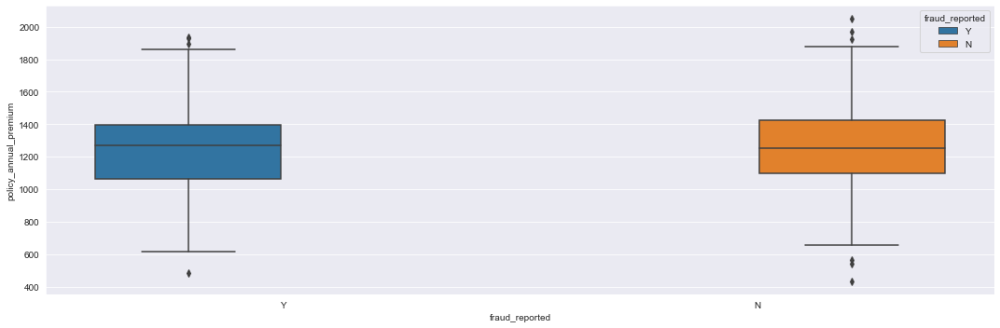



 incident_location_street 




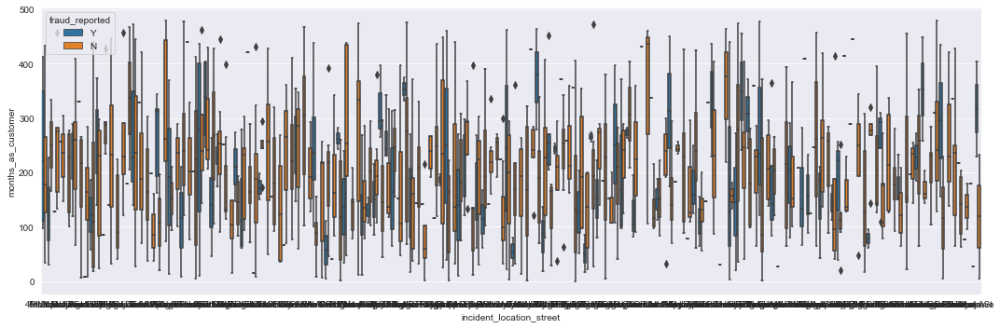

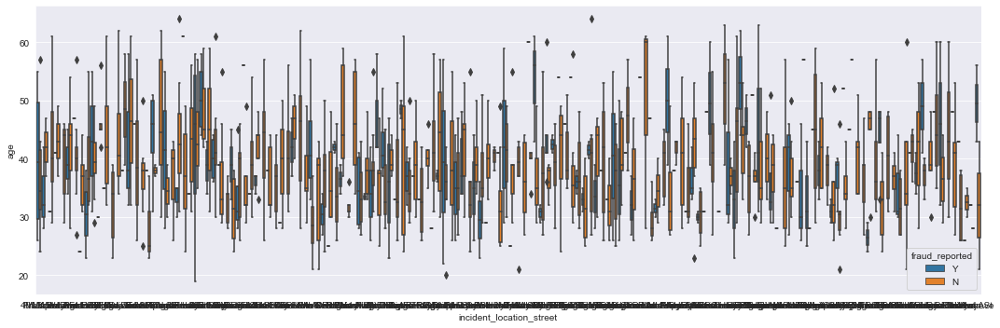

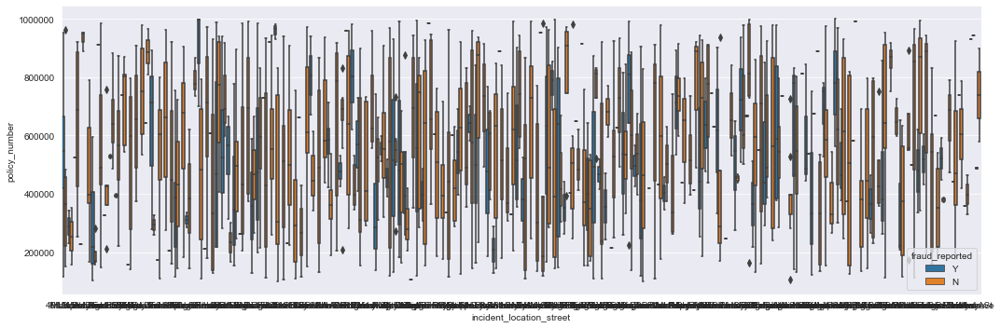

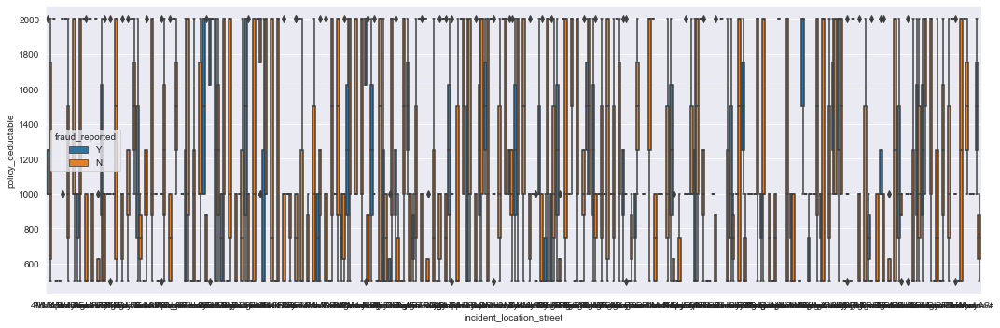

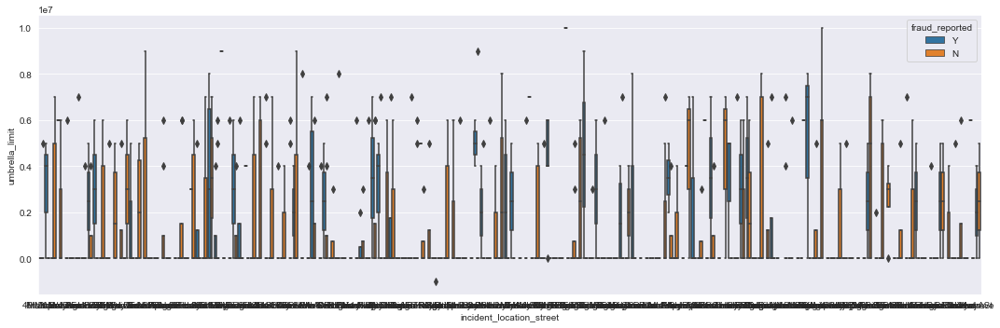

...

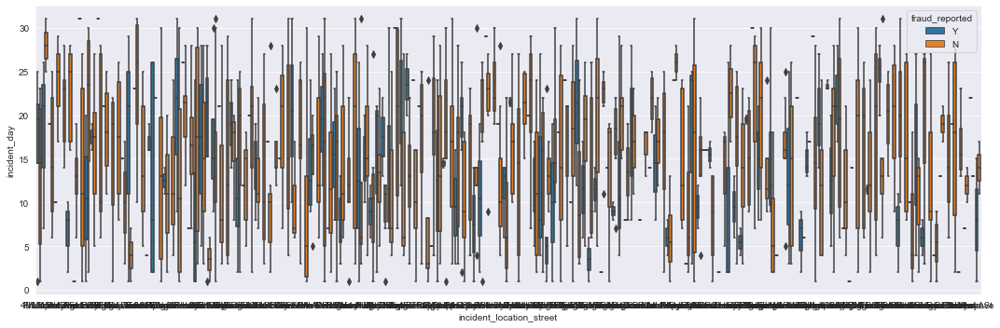

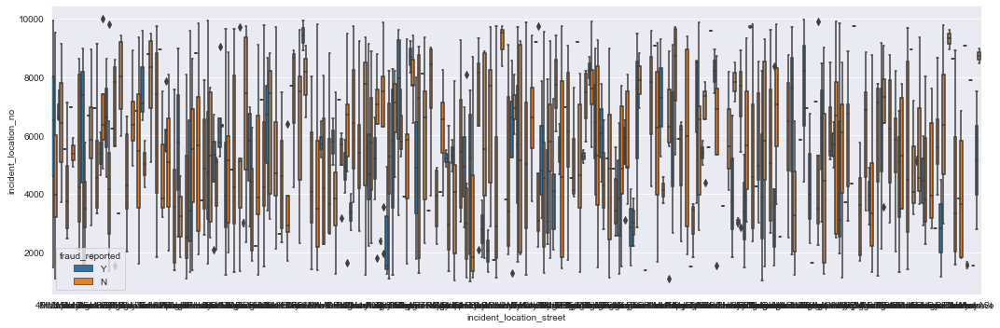

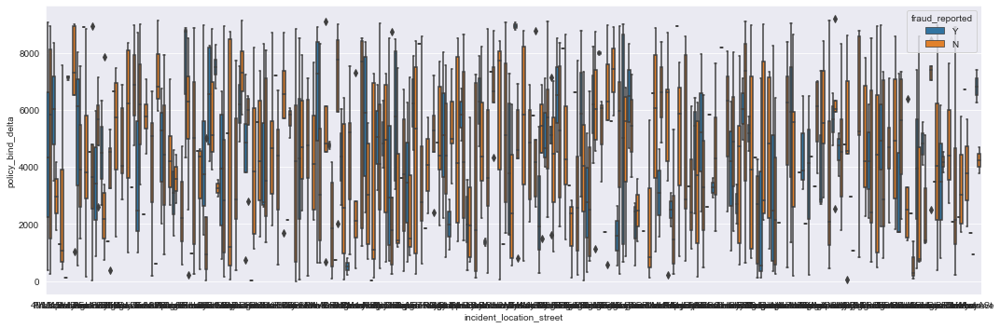

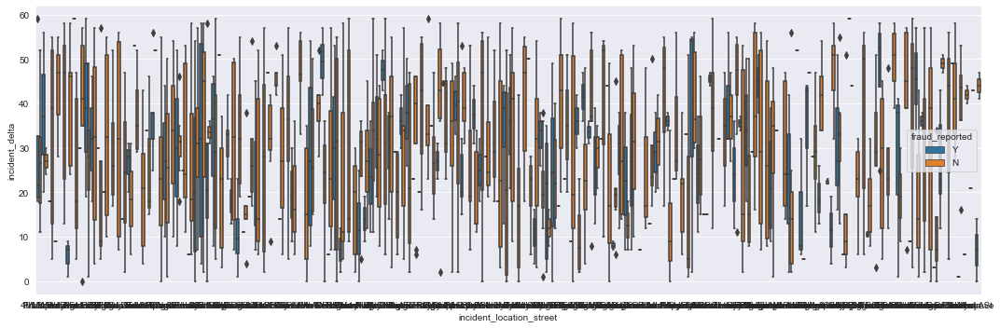

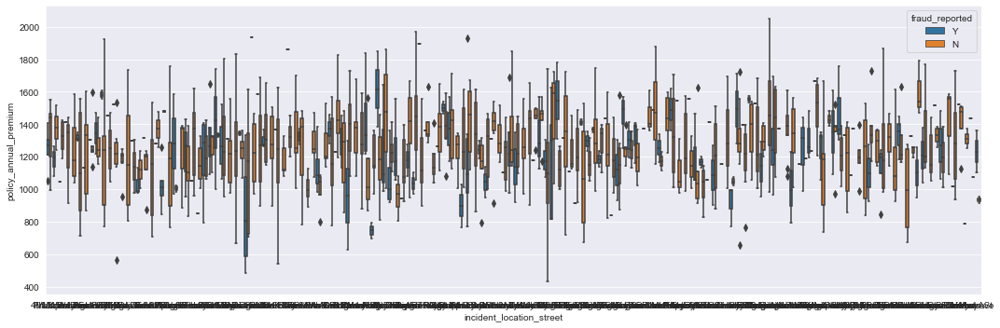

In [14]:
for col1 in Columns_object:
    print('\n\n', col1, '\n\n')
    for col2 in list(Columns_int)+list(Columns_float):
        fig,axarr = plt.subplots(nrows=1, figsize=(15,5))
        sns.boxplot(x=col1, y=col2, hue='fraud_reported', ax=axarr, data=DF)
        plt.tight_layout()
        plt.show()

**Erkenntnisse:**
* Erst ab ca. 50k-60k Euro Gesamtforderung müssen Betrugsversuche vermutet werden, aber nicht darunter
* Nur Männer mit *Umbrella Limit* über null haben Betrug begangen
* Wenn Männer mehr als 2 Zeugen benennen, ist Vorsicht geboten, da ein Betrug wahrscheinlich ist
* Benennen Männer nur einen Zeugen, ist ein Betrug unwahrscheinlich
* Kunden mit PhD und High Schoolabschluss sind generell vertrauenswürdig, außer sie kommen aus einem niedrigen *Zip*-Bereich
* Schachspieler im Alter zwischen 30 und 40 betrügen Wahrscheinlich, ab 40 werden sie ehrlicher
* Basketballer, denen etwas zwischen Mitternacht und 5:00am passiert, haben alle betrogen
* Menschen, die gerne schlafen, betrügen, wenn sie vor 10:00am einen Schaden generiert haben
* Hohe Verletzungskosten (für KFz geltend gemacht) bei Polospielern und Paintballern sind wahrscheinlich Betrug
* Hohe Eigentumsschäden (für KFz geltend gemacht) bei Yachtbesitzern sind wahrscheinlich Betrug
* Autodiebstähle mit Betrugsanzeige finden sich nur für den *Zip*-Bereich 470k bis 520k
* Ein Unfall mit nur einem Auto ist wahrscheinlich ein Betrug, wenn es mehr als zwei Zeugen gibt
* Gestohlene Autos, deren Versicherung in der ersten Monatshälfte greift, sind echt
* Geringe Schäden und Totalschaden ohne Zeugen  sind wahrscheinlich echt
* Totalschäden mit mehr als zwei Zeugen sind wahrscheinlich betrug
* Bagatellschäden sind wahrscheinlich Betrug, wenn die Versicherung zwischen Januar und Mai greift
* Bagatellschäden sind wahrscheinlich echt, wenn die Versicherung in der ersten Monatshälfte greift
* Wenn gegen Monatsende keine Behörden zur Dokumentation gerufen werden, leigt eine erhöhte Betrugswahrscheinlichkeit vor
* Wird in höheren *Zip*-Bezirken keine Auskunft über *property_damage* gegeben, liegt wahrscheinlich Betrug vor
* Bei Honda-Fahrern, die noch nicht lange Kunden sind (<150 Monate), ist vorsicht geboten
* Autos von Accura mit *Capital_loss* von mehr als 50K Euro sind wahrscheinlich Betrug

An diesen Beispielen wird erneut deutlich, dass nicht jedes Ergebnis verwendbar ist. Auch wenn auf Basis der Daten viele Vorhersagen getroffen werden können, sind diese nicht zwingend zu verwenden. Als Beispiel für nicht zu verwendende Informationen kann die Erkenntnis "Basketballer, denen etwas zwischen Mitternacht und 5:00am passiert, haben alle betrogen" herangezogen werden, hingegen erscheint die Aussage "Wenn gegen Monatsende keine Behörden zur Dokumentation gerufen werden, liegt eine erhöhte Betrugswahrscheinlichkeit vor" durchaus sinnig.

### nominal/ordinal skalierte Merkmale kodieren
Die meisten Machine Learning Algorithmen können mit nominalen Merkmalen nichts anfangen. Wir müssen also die Begrifflichkeiten auf sinvolle Weise in Zahlen überführen. Binäre Merkmale (Yes/No) werden im Folgenden als 1/0 kodiert. Merkmale mit mehr als 2 und weniger als 5 Ausprägungen werden One Hot Codiert, d.h. zu jeder Merkmalsausprägung wird ein neues Feature geschaffen und eine 1 gesetzt, wenn diese Ausprägung im Sample vorkommt und 0 sonst. Für Merkmale mit mehr als 4 Ausprägungen würde One Hot zu einer dünn besetzten Datenmatrix führen (sparse Data). Deshalb wird hier eine simple Form des Target Codings verwendet: Die Merkmalsausprägungen werden danach geordnet, wie häufig diese im Zusammenhang mit einem gemeldeten Betrug vorkamen. Anschließend wird diese geordnete Liste durchnummeriert und diese Nummerierung stellt die Kodierung dar. Je größer also die Zahl einer Target Codierten Variable, desto häufiger kommt diese Ausprägung zusammen mir einem Betrug vor.

In [94]:
BinaryColumns = []
OneHotColumns = []
TargetColumns = []
for col in Columns_object:
    if len(DF[col].value_counts()) == 2:
        BinaryColumns.append(col)
    elif 2 < len(DF[col].value_counts()) <= 4:
        OneHotColumns.append(col)
    else:
        TargetColumns.append(col)
    
enc = LabelEncoder()
for col in BinaryColumns:
    DF[col] = enc.fit_transform(DF[col])

enc = OneHotEncoder(handle_unknown='ignore')
for col in OneHotColumns:
    Vals     = DF[col].value_counts().index
    TransCol = enc.fit_transform(np.array(DF[col]).reshape(-1, 1))
    TransCol = TransCol.toarray()
    for id in range(len(Vals)):
        DF[col+'_'+Vals[id]] = TransCol[:,id]
        DF[col+'_'+Vals[id]] = DF[col+'_'+Vals[id]].astype(int)
        
for col in TargetColumns:
    Vals    = DF[col].value_counts().index
    AuxList = []
    for val in Vals:
        DF_fltr = DF[DF[col]==val]
        s       = np.sum(DF_fltr['fraud_reported'])
        AuxList.append([val,s])
    AuxDF  = pd.DataFrame(AuxList).sort_values(by=[1,0], ascending=True)
    Labels = list(AuxDF[0])
    AuxDict = {}
    for id in range(len(Labels)):
        AuxDict[Labels[id]] = id
    EncodedCol = [AuxDict[val2] for val2 in DF[col]]
    DF[col] = EncodedCol

### Korrelationsanalyse

Anschließend wollen wir die Korrelationen untersuchen. Hierzu berechnen wir Kendall's Tau, das ein allgemeines Korrelationsmaß ohne Unterstellung eines funktionalen (z.B. linearen) Zusammenhangs auskommt. Dieser Wert ist ein Maß dafür, wie oft bei Wertepaaren $(x,y)\in X\times Y$ die Ausprägungen von Y die Rangfolge von X durchbrechen. Durch die veränderte Bedeutung der targetcodierten Variablen, ist besondere Vorsicht bei der Interpretation der jeweiligen Korrelationen geboten. Daher betrachten wir zuerst die targetcodierten Variablen.

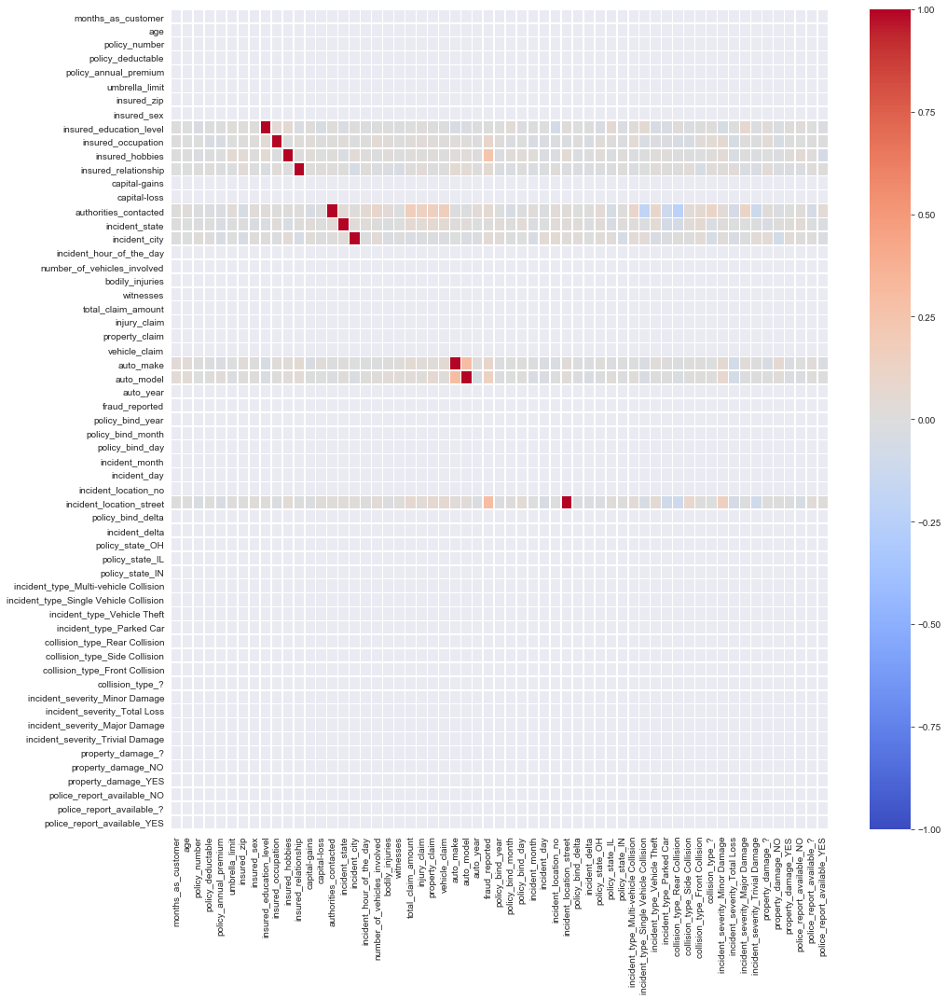

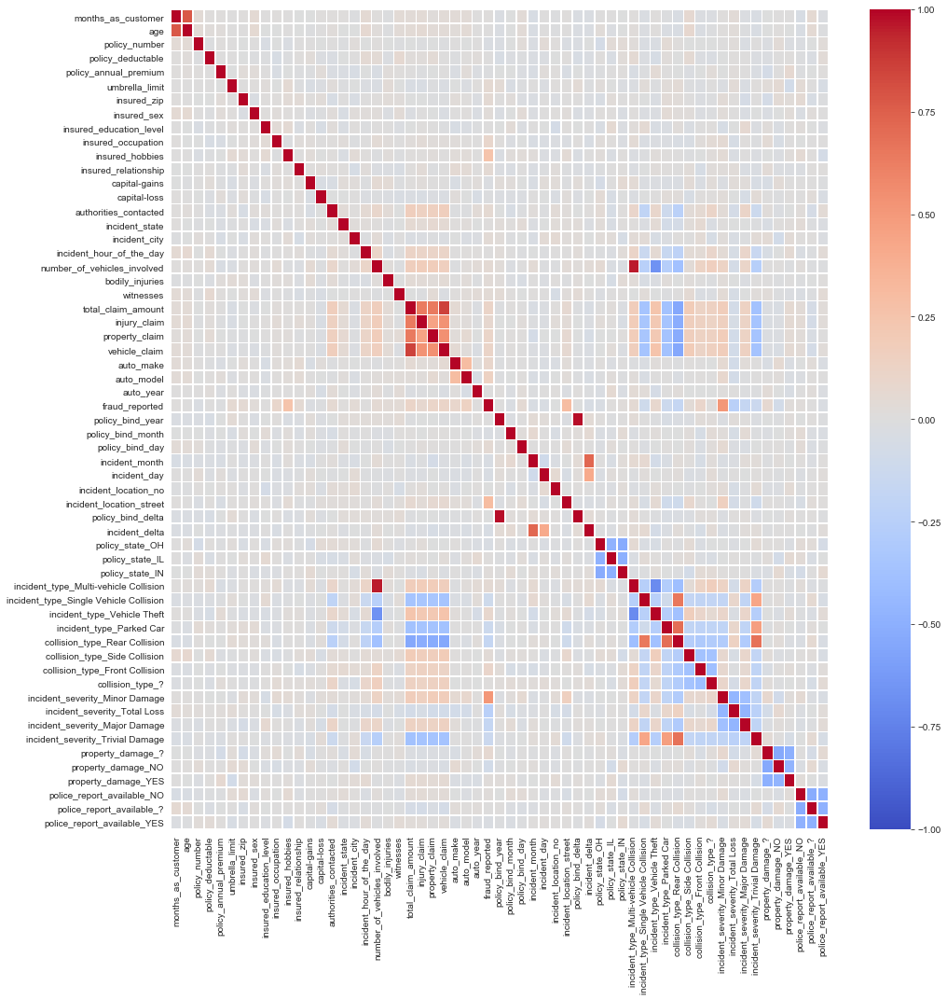

In [16]:
Correlations = DF.corr(method='kendall')

msk = np.ones_like(Correlations)
id = 0
for col in Correlations.index:
    if col in TargetColumns:
        msk[id] = len(msk[id]) * [0]
    id += 1

fig, axarr = plt.subplots(nrows=1, figsize=(15,15))
sns.heatmap(Correlations, vmin=-1, vmax=1, cmap='coolwarm', mask=msk,
            linewidths=.5, ax=axarr)
plt.tight_layout()
plt.show()

fig, axarr = plt.subplots(nrows=1, figsize=(15,15))
sns.heatmap(Correlations, vmin=-1, vmax=1, cmap='coolwarm', linewidths=.5, ax=axarr)
plt.tight_layout()
plt.show()

Die erste Heatmap zeigt nur die target-codierten Merkmale, damit eine entsprechend veränderte Interpretation erfolgen kann.
Die Korrelationen für diese Merkmale sind eher schwach und werden daher nicht in der Interpretation berücksichtigt.

**Triviale Erkenntnisse:**
* Das Kundenalter korreliert positiv mit der Kundendauer 
* *injury_claim*, *property_claim* und *vehicle_claim* korrelieren positiv 
* je größer *injury_claim*, *property_claim* und *vehicle_claim*, desto größer *total_claim_amount* 
* je mehr Autos in einem unfall involviert sind, desto häufiger handelt es sich um eine Multi-Vehicle-Collision
* je mehr Autos in einem unfall involviert sind, desto unwahrscheinlicher ist es, dass kein Property Damage angegeben wird
* bei einer mulit-vehicle-collision sind die claim_Amounts höher
* bei trivialem Schaden sind die claims kleiner
* bei Multivehicle collision ist trivial damage unwahrscheinlich
* bei single vehicle colision ist Rearcollision und trivial damage wahrscheinlich
* rear collision ist bei parked car sehr wahrscheinlich

**Latente Informationen:**
* bei einem Autodiebstahl sind alle Claims höher, auch injury claim und property claim (ist losgelöst von vehicle claim)
* Handelt es sich um eine RearCollision, sind die Claims niedriger
* Handelt es sich um eine Side oder Front Collision, sind die Claims höher
* Handelt es sich um einen Unfall im geparkten zustand, sind die Claims kleiner (auch auto claim)
* Totalschaden korreliert **nicht** mit den Claims
* Fraud korreliert mit den Insured hobbies (target codiert), d.h. Fraud-Bereitschaft kann in der Tat an Hobbies abgelesen werden
* Fraud korreliert schwach mit den Claims, d.h. je kleiner die Claims, desto geringer die Fraud-W'keit
* Fraud korreliert mit minor incident severity, d.h. zusammen mit dem vorherigen Punkt: Wenn bei geringer Unfallschwere dennoch hohe claims gefordert werden, ist das ein guter Indikator für einen Betrug
* Fraud korreliert schwach mit Auto-Marke und -Modell (Target Codiert), d.h. Fraud-Bereitschaft kann (mit Unsicherheit) an diesen Features geschätzt werden
* Bei Totalschaden ist ein Betrug in der Regel unwahrscheinlich
* Fraud korreliert mit Straße des Unfalls (Target Codiert), d.h. diese ist ein guter Indikator für Fraud
* triviale Schäden gibt es häufig bei geparkten Autos, single car incidents und rear collision

Zusammenfassend ergeben sich aus diesem Abschnitt viele Zusammenhänge, aus denen strategische Entscheidungen für angepasste Tarife oder neue Versicherungsprodukte entstehen können. Bei diesen und anderen Erkenntnissen ist jedoch stets zwischen Koinzidenz und Kausalität zu unterscheiden. Dies haben wir am Beispiel der Baksetballspieler bzw. durch das Nichthinzuziehen von Behörden verdeutlicht. Im Folgenden wollen wir auf Basis von Machine Learning latente Muster im Datensatz erkennen, die auf Betrugsfälle hinweisen und die jeweiligen Fälle automatisch als Prüffälle markieren (z.B. für eine tiefergehende menschliche Überprüfung).

##  3. Feature Importance und Betrugsvorhersage (Prediction)

Im Folgenden untersuchen wir die Fraud-Detection Performance von gängigen Classifiern in der Implementierung von Scikit. Dabei fokussieren wir uns auf:
* **Logistische Regression** optimiert eine Sigmoid-Funktion für den Zusammenhang dichotomer und ordinaler Merkmale und liefert durch die stetige Fortsetzung zwischen 0 und 1 eine Wahrscheinlichkeitsinterpretation. [https://de.wikipedia.org/wiki/Logistische_Regression]
* **Random Forest** entstehen durch das anlernen von mehreren Decision Trees auf verschiedenen Subsamples des Trainingsdatensatzes. Jeder Decision Tree kann dabei als eine Abfolge regelbasierter Entscheidungen verstanden werden, wobei die Induktion der Entscheidungsregeln sukzessive anhand eines Splittings von wichtigen Features durchgeführt wird, sodass dieser Split die Gini Impurity minimiert (= W'keit für Fehlklassification anhand der Verteilung die aus diesem Split entsteht). [https://en.wikipedia.org/wiki/Decision_tree_learning]
* **Naive Bayes** beschreibt Algorithmen, die auf der Anwendung des Bayes Theorems beruhen und die naive Annahme vonn iid-Merkmalen voraussetzt. Aus den auf dem Training Set errechneten bedingten Wahrscheinlichkeiten $P(target|FeatureVector)$ kann anschließend durch maximum a-posteriori Schätzung ein Schätzer für die Klassenzugehörigkeit einer ungesehenen Zielvariable berechnet werden. Wir verwenden die zusätzliche Annahme, dass die Merkmale normalverteilt vorliegen. [https://scikit-learn.org/stable/modules/naive_bayes.html#gaussian-naive-bayes]
* **SVM** erzeugt eine Menge von Hyperebenen in einem Hochdimensionalen Vektorraum durch Minimierung des Abstandes zu den verschiedenen Clustern. [https://en.wikipedia.org/wiki/Support_vector_machine]

An Feature Importance verwenden wir:
* **PCA** ermittelt ein neues Koordinatensystem mit einer niedrigeren Dimension als der ursprüngliche Feature-Raum. Dabei werden die neuen Koordinatenachsen entlang der größten Varianzen innerhalb des Datensatzes gelegt und ein Koordinatenwechsel durch orthogonale Projektion durchgeführt. Die neuen Koordinaten stellen dann eine niederdimensionale Repräsentation des Datensatzes bei minimalem Informationsverlust dar. [https://de.wikipedia.org/wiki/Hauptkomponentenanalyse]
* **Mutual k-Best** wählt die $k$ Features mit der höchsten Transinformation zum Merkmal *fraud_reported* aus. Transinformation ist hierbei ein Maß für die gewonnene Information einer Variable (z.B. *fraud_reported*), wenn eine andere Variable (z.B. *total_claim_amount*) beobachtet wird. [https://en.wikipedia.org/wiki/Mutual_information]
* **Permutation Importance** ist eine Classifier-abhängige Methode zur Schätzung der wichtigsten Features. Dabei wird ein Classifier auf einem Teildatensatz angelernt und die Referenz-Accuracy berechnet. Anschließend wird jedes Feature nach und nach permutiert, um eventuelle Abhängigkeiten zur Target-Variable zu zerstören. Anschließend wird die Accuracy erneut gemessen. So können die wichtigsten Features bestimmt werden. Wir verwenden im Folgenden die 10 wichtigsten Features. [https://scikit-learn.org/stable/modules/permutation_importance.html]

Die Classifier werden zunächst in einem Dictionary initialisiert und der Datensatz zur Verbesserung der Performance normalisiert:

In [95]:
CLFdict = {
'Logistic'     : LogisticRegression(random_state=41856),
'RandomForest' : RandomForestClassifier(bootstrap=True, random_state=41856),
'NaiveBayes'   : GaussianNB(),
'SVM'          : SVC(random_state=41856)
}

scaler = StandardScaler()
X  = DF.drop(columns=OneHotColumns).drop(columns=['fraud_reported'])
_X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
Y  = DF['fraud_reported']

Die oben erwähnten Modelle werden im Folgenden getestet. Dazu verwenden wir einen randomisierten 70/30-Split des Datensatzes in Training und Testing. Wir verwenden kein Dev-Set, da wir lediglich einen Vergleich der Ausgangsbasis anstellen und an dieser Stelle keine Optimierung vornehmen. Wir trainieren auf dem Train-Set und testen sowohl auf Train- wie auch auf Test-Set, um ein Gefühl für das Overfitting zu bekommen. Als Metriken wählen wir Precision und Recall, später auch den F1-Score. Precision beschreibt, mit welcher Wahrscheinlichkeit ein gefundener Betrug wirklich ein Betrug ist. Recall gibt an, welcher relative Anteil an Betrugsfällen tatsächlich gefunden wurde. der F1-Score ist ein gewichtetes Mittel aus Precision und Recall [https://en.wikipedia.org/wiki/Precision_and_recall]. Da Betrug in unserem Datensatz ein dichotomes Merkmal ist, gibt zu jeder Metrik theoretisch zwei Werte (Metrik für Klasse 0, d.h. kein Betrug und für Klasse 1, d.h. Betrug). Da es uns darauf ankommt, Betrug zu erkennen, verwenden wir nur die Metrik-Werte für die Klasse 1. Dies schlägt sich im Code durch *average='binary'* wieder. Eine Besonderheit unserer Auswertung, die leider nicht weit Verbreitet ist, ist die Wiederholung der obigen Messung. Die Performance von Machine Learning hängt maßgeblich von der Wahl des Trainingsdatensatzes ab, sodass sich bei (un)günstiger Randomisierung bessere oder schlechtere Werte ergeben können. Um die Gesamtperformance besser bewerten und den Einfluss des Trainingsdatensatzes vollständig abschätzen zu können, werden die oben beschriebenen Analysen 250 mal wiederholt, sodass sich für Precision und Recall (bzw. F1-Score) Verteilungen ergeben. Um bei erneutem Durchlauf gleiche Ergebnisse zu garantieren, setzen wir einen fixen Seed für den Zufallsgenerator. Für die folgende Analyse kodieren wir den Datensatz vollständig vor dem Splitting, damit wir die bestmöglichen Ergebnisse erhalten. Bei der finalen Bewertung wird die Kodierung nach dem Splititng erfolgen, um der Realität Rechnung zu tragen, in der der neue Datensatz unbekannt ist und durch fix angelernte Pipelines bearbeitet wird.

In [96]:
def TestMyModels(Features, Labels, CLFdict, FeatureMethod, reps=25, verbose=True):
    np.random.seed(41856)
    Seeds = np.random.randint(0,10**6, size=reps)
    Results = []
    if verbose == True:
        for rep in range(reps):
            print('Repetition:', rep)
            X_train, X_test, Y_train, Y_test = train_test_split(Features, Labels, test_size=.3, 
                                                                shuffle=True, random_state=Seeds[rep])
            for classifier_string in CLFdict:
                print('Classifier: %s -- Repetition: %s'%(classifier_string,rep))
                clf = CLFdict[classifier_string].fit(X_train, Y_train)
                ### Prediction on Training Set
                Predictions = clf.predict(X_train)
                p,r,f1,s = precision_recall_fscore_support(Y_train, Predictions, average='binary')
                Results.append([classifier_string, FeatureMethod, 'train', p, r, f1])
                print('\t Train Set F1 Score: %.2f'%f1)
                ### Prediction on Test Set
                Predictions = clf.predict(X_test)
                p,r,f1,s = precision_recall_fscore_support(Y_test, Predictions, average='binary')
                Results.append([classifier_string, FeatureMethod, 'test', p, r, f1])
                print('\t Test Set F1 Score: %.2f'%f1)
    else:
        for rep in range(reps):
            X_train, X_test, Y_train, Y_test = train_test_split(Features, Labels, 
                                                                test_size=.3, shuffle=True)
            for classifier_string in CLFdict:
                clf = CLFdict[classifier_string].fit(X_train, Y_train)
                ### Prediction on Training Set
                Predictions = clf.predict(X_train)
                p,r,f1,s = precision_recall_fscore_support(Y_train, Predictions, average='binary', warn_for=tuple())
                Results.append([classifier_string, FeatureMethod, 'train', p, r, f1])
                ### Prediction on Test Set
                Predictions = clf.predict(X_test)
                p,r,f1,s = precision_recall_fscore_support(Y_test, Predictions, average='binary', warn_for=tuple())
                Results.append([classifier_string, FeatureMethod, 'test', p, r, f1])
    ### Building the Data Frame of Results
    ResArray = np.array(Results).reshape(-1,6)
    ResDF    = pd.DataFrame(ResArray, columns=['Classifier', 'FeatureSelection', 'EvalSet', 'Precision', 'Recall', 'F1score'])
    ResDF['Classifier']       = ResDF['Classifier'].astype(str)
    ResDF['FeatureSelection'] = ResDF['FeatureSelection'].astype(str)
    ResDF['Precision']        = ResDF['Precision'].astype(float)
    ResDF['Recall']           = ResDF['Recall'].astype(float)
    ResDF['F1score']          = ResDF['F1score'].astype(float)
    return ResDF

Wir wählen für die Hauptkomponentenanalyse (PCA) so viele Variablen aus, dass 90% der Gesamtinformation (Varianz) des Datensatzes erhalten bleibt und projezieren den Datensatz anschließend in den reduzierten Vektorraum. Dadurch erhalten wir letztlich eine Reduktion der statistischen Merkmale, die ggf. zu einer Steigerung der Performance führen wird. Es ist zu beachten, dass diese neu generierten Merkmale in der Regel keine semantische Information mehr besitzen.

In [97]:
pca   = PCA(.90) ; pca.fit(_X) ; npc = len(pca.explained_variance_ratio_)
print("Reduction: From %s to %s dimensions.\n"%(len(_X.columns),npc))
print("Explained Variance:\n", pca.explained_variance_ratio_)
X_pca = pca.transform(_X)

ResDF = TestMyModels(X_pca, Y, CLFdict, 'pca', reps=100, verbose=False)

Reduction: From 58 to 37 dimensions.

Explained Variance:
 [0.10854186 0.04564576 0.03815715 0.03389547 0.03277678 0.0312266
 0.02933039 0.02896455 0.02724055 0.02651668 0.02615768 0.02523479
 0.02455643 0.02439578 0.02338701 0.02260311 0.02133421 0.02021376
 0.0199643  0.01956088 0.01915984 0.01896218 0.01858238 0.0179439
 0.01749571 0.01745507 0.01664793 0.01649824 0.01628924 0.01601722
 0.01564392 0.01536802 0.01527112 0.01489398 0.01461979 0.01456604
 0.01419869]


Für den k-Best Algorithmus verwenden wir $k=1,\ldots,10$ und erzeugen somit 10 Datensätze, die mit den verschiedenen Classifiern getestet werden.

In [98]:
for K in range(1,11):
    selector = SelectKBest(mutual_info_classif, k=K).fit(X, Y)
    X_new    = selector.transform(X)
    mask     = selector.get_support()
    SelectedFeatures = np.array(X.columns)
    SelectedFeatures = SelectedFeatures[mask]
    X_kbest  = pd.DataFrame(X_new, columns=SelectedFeatures)

    FeaturetMethod = str(K)+'best'
    
    _ResDF = TestMyModels(X_kbest, Y, CLFdict, FeaturetMethod, reps=100, verbose=False)
    ResDF  = pd.concat([ResDF,_ResDF], ignore_index=True)

Da die Permutation Feature Importance vom Classifier abhängig ist, müssen wir die oben definierte Funktion hier wieder aufbrechen. Für jeden Classifier lernen wir diesen zunächst auf dem Trainingsdatensatz an und berechnen dann die zehn wichtigsten Features. Anschließend wird jeder Classifier auf 250 verschiedenen 70/30-Train-Test-Splits auf dem reduzierten Datensatz getestet.

In [99]:
Results  = []
for classifier_string in CLFdict:
    clf  = CLFdict[classifier_string].fit(_X, Y)
    perm = permutation_importance(clf, _X, Y, n_repeats=30, scoring='f1')
    ImportanceDF = pd.DataFrame(perm.importances_mean,  
                                columns=['FeatureImportance'], index=_X.columns)
    ImportanceDF = ImportanceDF.sort_values(by='FeatureImportance', ascending=False)
    Top5 = list(ImportanceDF.iloc[:10].index)
    
    np.random.seed(41856); Seeds = np.random.randint(0,10**6, size=100)
    for rep in range(100):
        X_train, X_test, Y_train, Y_test = train_test_split(_X[Top5], Y, test_size=.3, 
                                                            shuffle=True, random_state=Seeds[rep])
        clf.fit(X_train, Y_train)
        ### Prediction on Training Set
        Predictions = clf.predict(X_train)
        p,r,f1,s    = precision_recall_fscore_support(Y_train, Predictions, average='binary')
        Results.append([classifier_string, 'Top10Permut', 'train', p, r, f1])
        ### Prediction on Test Set
        Predictions = clf.predict(X_test)
        p,r,f1,s    = precision_recall_fscore_support(Y_test, Predictions, average='binary')
        Results.append([classifier_string, 'Top10Permut', 'test', p, r, f1])
        
ResArray = np.array(Results).reshape(-1,6)
_ResDF   = pd.DataFrame(ResArray, columns=['Classifier', 'FeatureSelection', 'EvalSet', 'Precision', 'Recall', 'F1score'])
_ResDF['Classifier'] = _ResDF['Classifier'].astype(str)
_ResDF['FeatureSelection'] = _ResDF['FeatureSelection'].astype(str)
_ResDF['Precision']  = _ResDF['Precision'].astype(float)
_ResDF['Recall']     = _ResDF['Recall'].astype(float)
_ResDF['F1score']    = _ResDF['F1score'].astype(float)       
ResDF = pd.concat([ResDF,_ResDF] , ignore_index=True) 

Wir entscheiden uns bei den Vergleichen für Boxplots, da diese die statistische Natur der Quality Measures darstellen und gleichzeitig übersichtlicher sind, als z.B. die Betrachtung aller Kerndichteschätzungen in einem Bild. Wir betrachten für jeden einzelnen Classifier Precision und Recall unterteilt nach Datensatz mit einem zusätzlichen Farbsplitting für Train- und Test-Set.

------- Logistic -------


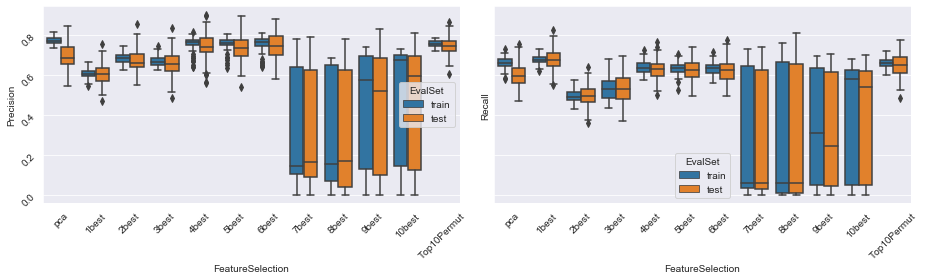




------- RandomForest -------


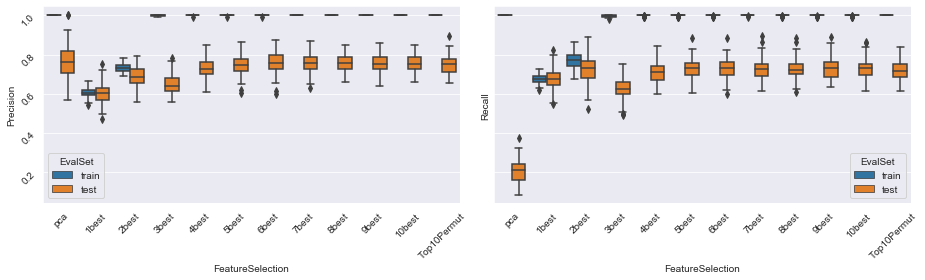




------- NaiveBayes -------


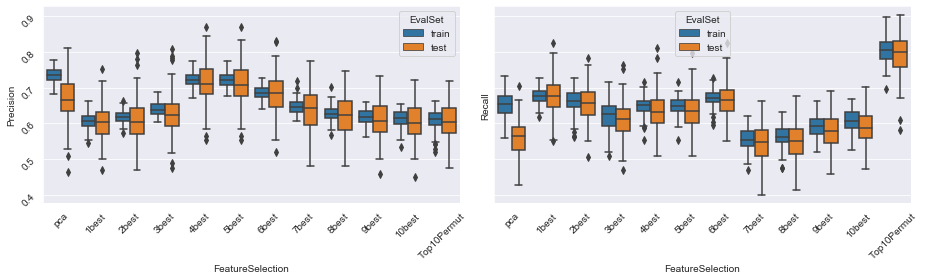




------- SVM -------


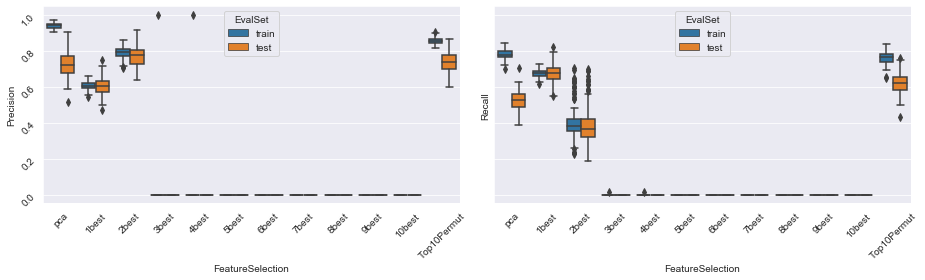

In [100]:
for clst in CLFdict:
    AuxDF = ResDF[(ResDF.Classifier == clst)]
    print('-------',clst,'-------')
    fig,axarr = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(13,4))
    sns.boxplot(x='FeatureSelection', y="Precision", hue='EvalSet', data=AuxDF, ax=axarr[0])
    sns.boxplot(x='FeatureSelection', y="Recall",    hue='EvalSet', data=AuxDF, ax=axarr[1])
    axarr[0].tick_params(labelrotation=45)
    axarr[1].tick_params(labelrotation=45)
    plt.tight_layout()
    plt.show()          
    print('\n\n')

* **Logistische Regression** funktioniert gut mit PCA (leichtes Overfitting) und Top10 Permutation. Ab 6best führen weitere Features nur zur Verschlechterung. Zwischen Precision und Recall gibt es keine Auffälligkeiten. Insgesamt kratzt dieser Classifier an der 0.9-Marke (Verteilungen mit hoher Varianz ausgeschlossen).
* **Random Forest** weist fast immer Overfitting auf. Die beste Precision ist mit der PCA zu erreichen, geht jedoch mit dem schlechtesten Recall einher. Da es (im ersten Schritt) nicht darum geht, Betrugsfälle endgültig und ohne menschliche Prüfung zu erkennen und abzuweisen, sondern vielmehr darum Prüffälle zu finden, die näher untersucht werden müssen, ist Recall insgesamt sogar etwas wichtiger als Precision. Für K-Best ist eine Qualitätssteigerung bis K=4 zu erkennen, danach bleibt die Qualität konstant. Insgesamt werden Werte von 0.9 öfters überschritten. 
* **NaiveBayes** besitzt nur leichtes Overfitting bei PCA und liefert die besten Ergebnisse bei 4best und 5best. Insgesamt bleiben die Werte aber bei der 0.85-Grenze. Der Classifier ist daher eher ungeeignet.
* **SVM** liefert zwar sehr oft gute Ergebnisse für die Precision aber immer einhergehend mit einem schlechten Recall. Für Top10Permut und pca existiert sehr starkes Overfitting. Insgesamt ist dieser Classifier ungeeignet.

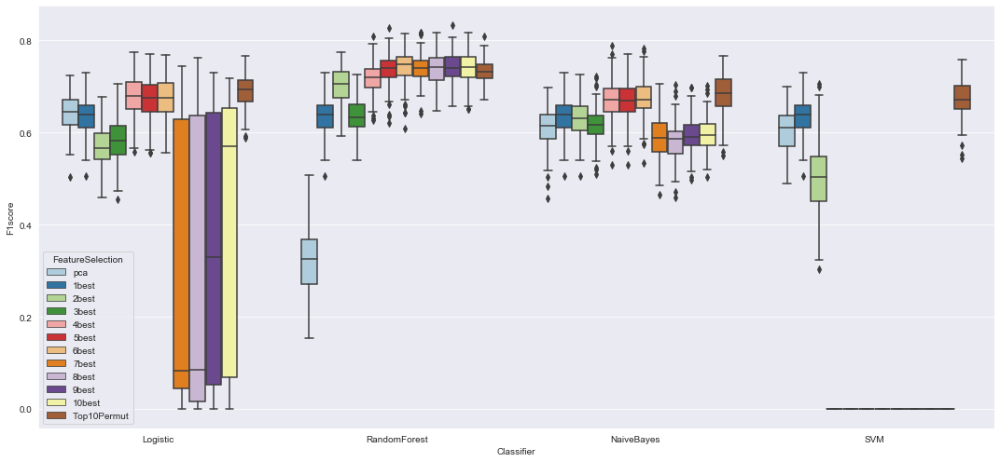

In [101]:
fig, axs = plt.subplots(nrows=1, figsize=(15,7))
sns.boxplot(y="F1score", x='Classifier', hue='FeatureSelection', palette='Paired',
            data=ResDF[ResDF.EvalSet == 'test'], ax=axs)
plt.tight_layout()
plt.show()

Es gibt große Überschneidungen, der Verteilungen, sodass ein 'besser' oder 'schlechter' immer mit einer gewissen Fehlerwahrscheinlichkeit verbunden ist. Insgesamt sind aber die meisten Scores für den Random Forrest ein wenig höher als die der anderen Classifier. Im Vergleich bietet der Random Forest von allen Classifiern von Natur aus die besten Startvoraussetzungen. Die besten Werte werden für die Feature Selection 6best bis 10best erreicht. Da die Qualität ab 5best nicht mehr weiter zunimmt, stellt k=6 aus Gründen der Komplexitätsreduktion die beste Wahl dar.
Overfitting ist beim Random Forest zwar gegeben, aber nicht so ausgeprägt, dass man es nicht in den Griff kriegen könnte, insbesondere indem die Tiefe der Zweige limitiert wird. Dieser Classifier bietet, wie schon gesagt, die besten Startbedingungen für eine Optimierung.

### Optimierung des besten Classifiers

Leider ist der Random Forest aber auch ein Classifier, der nur wenige Hyperparameter für das Tuning bietet. Beispielsweise kann die Anzahl der verwendeten Decision Trees zu besseren und robusteren Entscheidungen führen. Da wir jedoch ein dichotomes Merkmal vorhersagen und die Standardeinstellung bereits 100 Decision Trees vorsieht, ist eine Verbesserung der Scores durch zusätzliche Decision Trees eher unwahrscheinlich. Zusätzlich bietet ein Random Forest noch die maximale Tiefe, sowie die Mindestzahl an Samples pro Zweig oder Split als mögliche Parameter. All diese Parameter beeinflussen die Verzweigung und verhindern, dass jedes Sample im Trainings-Datensatz einen eigenen Ast bekommt. So ist davon auszugehen, dass eine Optimierung lediglich das Overfitting in den Griff kriegt.

**Bemerkungen:**
* Wir haben bislang den vollständig kodierten Datensatz verwendet und die Classifier mit einem 70/30-Split untersucht. Dadurch haben wir den besten Algorithmus unter optimalen Bedingungen gefunden. Dies war zulässig, weil wir nur verglichen und nicht optimiert haben.
* Beim Optimieren kann es jedoch auch zu einem Overfitting auf dem Test-Set kommen, sodass die berechneten Scores nur wenig Aussagekraft auf die Performance ungesehener Daten besitzt. Deshalb teilen wir den Datensatz in ein Dev-Set und ein Test-Set mittels 75/25-Split. Auf dem Test-Set wird dann mittels 3-Fold-Splitting optimiert. Dies ergibt dann abermals 50% für das Training und 25% für das Testing.
* In der Realität wird der Test-Datensatz aber unabhängig vom Trainingsdatensatz kodiert, da dieser in der Regel erst nach der Erstellung des Classifiers entsteht. Dies wird im Folgenden berücksichtigt werden.
* Die Herausforderung besteht darin, dass der Test-Datensatz neue Label enthält, die durch die Encoder nicht berücksichtigt werden können. Da die SciKit-Encoder kein akzeptables oder konfigurierbares UnknownValue-Handling haben, müssen diese eigens neu programmiert werden (auch das muss ein guter Data Scientist können - dafür braucht man Leute, die wissen, was hinter dem Deckmantel einer Funktion eigentlich passiert).
* Natürlich müssen wir den Datensatz hierfür noch einmal neu laden und augmentieren. Glücklicherweise haben wir das zuvor als Funktion implementiert!

In [5]:
DF = pd.read_csv(".\datasets_45152_82501_insurance_claims.csv")
DF = cleanup(DF)
DF = augment(DF)

In [6]:
class Encoder:
    def __init__(self):
        pd.options.mode.chained_assignment = None
        self.EncoderDict   = {}
        self.BinaryColumns = []
        self.OneHotColumns = []
        self.TargetColumns = []
        self.ignore_count  = 0
    
    def reset(self):
        self.EncoderDict   = {}
        self.BinaryColumns = []
        self.OneHotColumns = []
        self.TargetColumns = []
        self.ignore_count  = 0

    
    def determine_encoding_types(self, DF_0):
        DF = DF_0.copy(deep=True)
        for col in DF.select_dtypes(include=['object']).columns:
            if len(DF[col].value_counts()) == 2:
                self.BinaryColumns.append(col)
            elif 2 < len(DF[col].value_counts()) <= 4:
                self.OneHotColumns.append(col)
            else:
                self.TargetColumns.append(col)
    
    def fit(self, DF_0):
        self.reset()
        DF = DF_0.copy(deep=True)
        self.determine_encoding_types(DF)
        for col in self.BinaryColumns:
            Vals = sorted(list(set(DF[col])))
            BinaryDict = {Vals[0]:0 , Vals[1]:1}
            self.EncoderDict[col] = BinaryDict
        for col in self.OneHotColumns:
            AuxDF = DF[col]
            Vals  = AuxDF.value_counts().index
            self.EncoderDict[col] = Vals
        for col in self.TargetColumns:
            Vals    = DF[col].value_counts().index
            AuxList = [] 
            for val in Vals:
                DF_fltr = DF[DF[col]==val]
                s       = np.sum(DF_fltr['fraud_reported'].replace({'Y':1,'N':0}))
                AuxList.append([val,s])
            AuxDF  = pd.DataFrame(AuxList).sort_values(by=[1,0], ascending=True)
            Labels = list(AuxDF[0]) ; TargetDict = {}
            for id in range(len(Labels)):
                TargetDict[Labels[id]] = id
            self.EncoderDict[col] = TargetDict
        
    def transform(self, DF_0):
        DF = DF_0.copy(deep=True)
        self.ignore_count = 0
        ###
        for col in self.BinaryColumns:
            BinaryDict = self.EncoderDict[col]
            for val in BinaryDict:
                mask = (DF[col]==val)
                DF[col][mask] = BinaryDict[val]
            mask = (DF[col]!=0) & (DF[col]!=1)
            DF[col][mask] = -99 #np.nan
            self.ignore_count += np.sum(mask)
            DF[col] = DF[col].astype(int)
        ###
        for col in self.OneHotColumns:
            AuxDF = DF[col]
            Vals_fit = self.EncoderDict[col]
            Vals     = AuxDF.value_counts().index
            for id in range(len(Vals)):
                if Vals[id] in Vals_fit:
                    DF[col+'_'+Vals[id]] = 1 * np.array(AuxDF == Vals[id])
                    DF[col+'_'+Vals[id]] = DF[col+'_'+Vals[id]].astype(int)
                else:
                    self.ignore_count += np.sum(AuxDF == Vals[id])
        DF = DF.drop(columns=self.OneHotColumns)
        ###
        for col in self.TargetColumns:
            TargetDict = self.EncoderDict[col]
            msk = ~DF[col].isin(TargetDict.keys())
            DF[col][msk] = -99 #np.nan
            DF[col] = DF[col].replace(TargetDict)
            self.ignore_count += np.sum(mask)
        return DF
    
    def fit_transform(self, DF_0):
        self.fit(DF_0)
        DF = self.transform(DF_0)
        return DF

Wie gravierend ist eigentlich das Problem, dass neue Labels im Test-Datensatz vorkommen? Diese können leider nicht nachträglich kodiert werden. Bei Binärcodierung (1,0), würde ein zusätzliches Label noch eine weitere Zahl erfordern, worauf der Classifier nicht angelernt wurde (weniger problematisch). Bei OneHot-Encoding würde eine neue Feature-Spalte geschaffen werden, sodass die Dimension des Datensatzes nicht mit den Dimensionen des angelernten Classifiers übereinstimmt (sehr problematisch). Bei TargetCoding ist die Ordnungsrelation des neuen Labels zu den anderen vollkommen unklar und kreirte Korrelationen können zerstört werden. Wir müssen also wissen, wie oft dieser Umstand vorkommt.

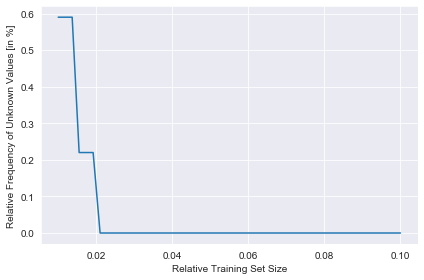

In [27]:
X = np.linspace(.01,.1, num=50)
Y = []

enc = Encoder()
for trainsize in X:
    Unknowns = []
    for rep in range(50):
        A, B = train_test_split(DF, train_size=trainsize, shuffle=True, random_state=41856)  
        a,b = B.shape ; N = a*b
        enc.fit(A) ; B_ = enc.transform(B)
        H = enc.ignore_count ; h = np.round(H/N, decimals=4)
        Unknowns.append(h)
    Y.append(np.mean(Unknowns))

sns.lineplot(x=100*np.array(X), y=100*np.array(Y))
plt.xlabel('Relative Training Set Size [in %]')
plt.ylabel('Relative Frequency of Unknown Values [in %]')
plt.tight_layout()
plt.show()

Das Problem ist existent für eine Trainingsgröße von weniger als 3% (etwa 30 Samples). Wenn wir den Datensatz in 50/25/25 splitten, tritt das befürchtete Problem gar nicht auf. Im Folgenden verwenden wir 50% des Datensatzes als Training-Set und 25% als Test-Set. Hier wird der Random Forest optimiert. Seine Gesamtperformance wird dann anschließend auf die restlichen 25% des Datensatzes überprüft. Dies geschieht mehrmals für unterschiedliche Zusammenstellungen dieser Datensätze. Die Kodierung ist also für unsere weitere Analysen bedenkenlos nutzbar.

Zur Vereinfachung bauen wir aus Kodierung und Normalisierung eine Data-Pipeline:

In [7]:
def pipeline(Train, Test, feature_reduction=[]):
    enc     = Encoder()
    scaler  = StandardScaler()
    # Kodieren
    Train_enc   = enc.fit_transform(Train)
    Test_enc    = enc.transform(Test)
    # Labels 
    Y_train = Train_enc['fraud_reported']
    Y_test  = Test_enc['fraud_reported']
    # Features
    X_train = Train_enc.drop(columns=['fraud_reported'])
    X_test  = Test_enc.drop(columns=['fraud_reported'])
    # Reduzierung
    if len(feature_reduction) > 0:
        X_train = X_train[feature_reduction]
        X_test  = X_test[feature_reduction]
    # Skalierung
    X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
    X_test  = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
    return X_train, Y_train, X_test, Y_test

Für die folgende Optimierung verwenden wir einen randomisierten Grid-Search mit einer k-fold Cross Validation, um Train-Dev-Test-Splitting zu realisieren. Dabei wird für jeden zu variierenden Hyperparameter eine Liste mit möglichen Werten vorgegeben, sodass das Kreuzprodukt ein Gitter von möglichen Parameterkonstellationen erzeugt. Aus diesem Gitter werden zufällig $n$ Punkte ausgewählt und getestet. Der 75%-Split wird dann in drei gleichgroße Segmente (3-fold cross validation) aufgeteilt, von denen je zwei Teile (50%) zum anlernen und der übrige Teil (25%) zur Evaluation genutzt wird. Entsprechend ergeben sich für jede Parameterkombination drei Durchläufe von denen der resultierende Performance-Score durch mittelwertbildung abgeleitet wird. 
Auf diese Weise kann ein randomisiertes Train-Dev-Verfahren implementiert werden. Um der Zufälligkeit des Test-Sets Rechnung zu Tragen, wird der initiale 75/25-Split ebenfalls 100 Mal wiederholt. So erhalten wir ein vollständig randomisiertes Train-Dev-Test-Set Framework mit 50/25/25-Splitting. Für die folgende Analyse verwenden wir ein Parametergitter mit 2500 Punkten von denen in jedem der 100 Durchläufe genau 500 Kombinationen getestet werden. Später kann das Cross-validierte Modell nochmals auf Train/Test-Splits getestet werden. Wir folgen damit dem Vorgehen, wie es hier empfohlen wird: [https://scikit-learn.org/stable/modules/cross_validation.html]

**Achtung: Die Ausführung des folgenden Codes benötigt zwischen 12 und 13 Stunden!**

In [ ]:
random_grid = {'n_estimators':      np.linspace(10, 1000, num=10, dtype=int),
               'max_depth':         np.linspace(5, 50,    num=10, dtype=int),
               'min_samples_split': np.linspace(2, 10,    num=5,  dtype=int),
               'min_samples_leaf':  np.linspace(1, 10,    num=5,  dtype=int)}

selector  = SelectKBest(mutual_info_classif, k=6)
clf       = RandomForestClassifier(bootstrap=True, class_weight='balanced_subsample', random_state=41856)
optimizer = RandomizedSearchCV(estimator=clf, param_distributions=random_grid, scoring='f1',
                               n_iter=500, cv=3, n_jobs = -1, random_state=41856, verbose=True)

Cols                 = list(random_grid.keys())+['EvalSet','Precision','Recall','F1score']
BestHyPa_DF          = pd.DataFrame(columns=Cols)  
SelectedFeaturesList = []  
 
np.random.seed(41856); Seeds = np.random.randint(0,10**6, size=100)
for rep in range(100):
    print('Repetition', rep)
    ### Datensätze vorbereiten
    Dev, Test  = train_test_split(DF, test_size=.25, shuffle=True, random_state=Seeds[rep])
    X_dev, Y_dev, X_test, Y_test = pipeline(Dev, Test)
        
    X_new = selector.fit_transform(X_dev, Y_dev)
    mask  = selector.get_support()
    SelectedFeatures = np.array(X_dev.columns)[mask]
    X_dev_reduced = pd.DataFrame(X_new, columns=SelectedFeatures)
    
    X_new = selector.transform(X_test)
    X_test_reduced = pd.DataFrame(X_new, columns=SelectedFeatures)
    SelectedFeaturesList.append(SelectedFeatures)
    
    ### Optimierung des Classifiers
    optimizer.fit(X_dev_reduced, Y_dev) 
    BestDict = optimizer.best_params_
    
    clf.set_params(**BestDict)
    clf.fit(X=X_dev_reduced, y=Y_dev)
    
    ### Speichern der Performance Results
    AuxDF = pd.DataFrame(BestDict, index=[0])
    Predictions = clf.predict(X_dev_reduced)
    p,r,f1,s = precision_recall_fscore_support(Y_dev, Predictions, average='binary')
    AuxDF['EvalSet']='dev'; AuxDF['Precision']=p; AuxDF['Recall']=r; AuxDF['F1score']=f1
    BestHyPa_DF  = pd.concat([BestHyPa_DF,AuxDF] , ignore_index=True)
    
    AuxDF = pd.DataFrame(BestDict, index=[0])
    Predictions = clf.predict(X_test_reduced)
    p,r,f1,s = precision_recall_fscore_support(Y_test, Predictions, average='binary')
    AuxDF['EvalSet']='test'; AuxDF['Precision']=p; AuxDF['Recall']=r; AuxDF['F1score']=f1
    BestHyPa_DF  = pd.concat([BestHyPa_DF,AuxDF] , ignore_index=True)

BestHyPa_DF[list(random_grid.keys())] = BestHyPa_DF[list(random_grid.keys())].astype('int64')

Als Ergebnis erhalten wir eine Tabelle (genauer: Data Frame), die jeder zufällig ausgewählten Parameterkombination die Metriken *Precision*, *Recall* und *F1* auf dem Dev- und Testset gegenüberstellt. Weiterhin erhalten wir eine Liste mit den ausgewählten Merkmalen, die durch k-Best in den Iterationen ausgewählt wurden. 
Zuerst betrachten wir, welche Features am häufigsten ausgewählt wurden (Ergebnisse unterscheiden sich aufgrund des randomisierten Train-Dev-Test-Splits):

most frequent 6-Best features:

 incident_severity_Major Damage    100
incident_location_street           99
insured_hobbies                    96
incident_severity_Minor Damage     49
property_claim                     37
total_claim_amount                 20
Name: 0, dtype: int64


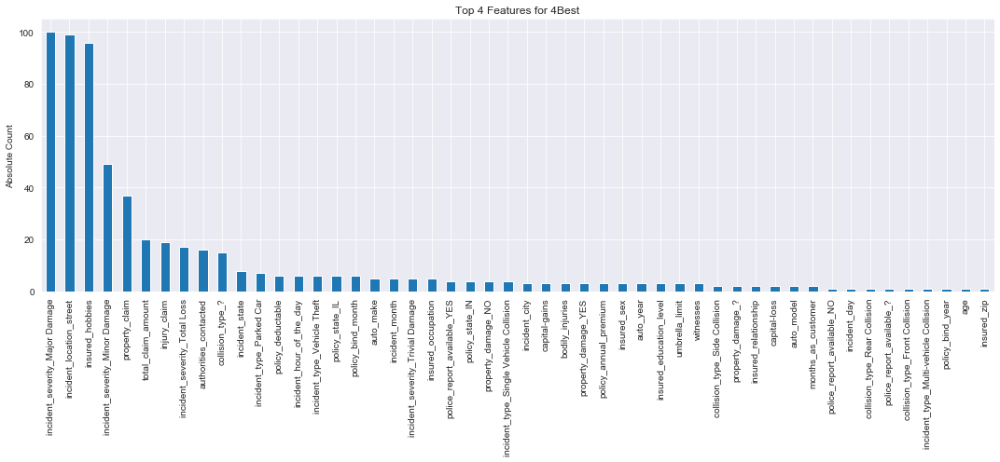

In [35]:
print('most frequent 6-Best features:\n\n', pd.DataFrame(np.array(SelectedFeaturesList).flatten())[0].value_counts().head(6))

fig, axs = plt.subplots(nrows=1, figsize=(15,7))
pd.DataFrame(np.array(SelectedFeaturesList).flatten())[0].value_counts().plot(kind='bar', ax=axs)
plt.title('Top 4 Features for 4Best')
plt.ylabel('Absolute Count')
plt.tight_layout()
plt.show()

**Erkenntnis:** Die vier am häufigsten als 4best erkannten Features sind:
* incident_severity_Major Damage
* incident_location_street
* insured_hobbies
* incident_severity_Minor Damage
* property_claim
* total_claim_amount

Diese werden auch für unseren finalen Classifier verwendet werden.

Für die Auswahl der optimalen Parameter für unseren Random Forest gibt es verschiedene Vorgehensweisen:
* Modalwert
* Mittelwert
* Single Best Score

Betrachten wir zuerst die ersten beiden Vorgehensweisen:

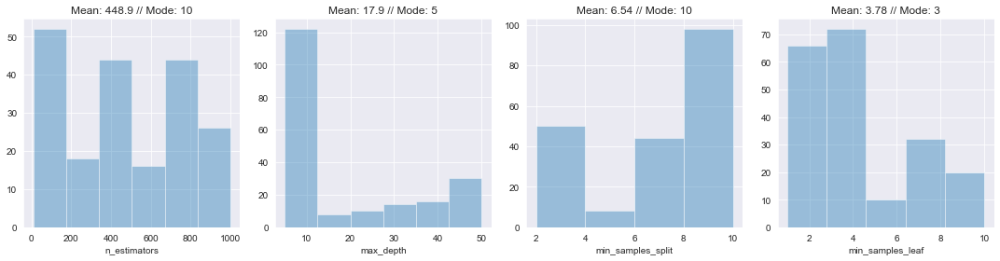

In [32]:
fig, axs = plt.subplots(ncols=4, figsize=(15,4))
for id in range(4):
    ParameterVals = BestHyPa_DF.iloc[:,id]
    sns.distplot(ParameterVals, kde=False, ax=axs[id])
    meanval = np.mean(ParameterVals)
    modeval = ParameterVals.mode().iloc[0]
    axs[id].set_title('Mean: %s // Mode: %s'%(meanval,modeval))
plt.tight_layout()
plt.show()

* Laut Modalwert wären die Parameter (10,5,10,3).
* Laut Mittelwert wären die Parameter (449,18,7,4).

Betrachten wir nun die letzte Vorgehensweise (Single Best Score):

In [36]:
BestHyPa_DF[BestHyPa_DF.EvalSet == 'test'].sort_values(by='F1score', ascending=False)

,n_estimators,max_depth,min_samples_split,min_samples_leaf,EvalSet,Precision,Recall,F1score
171,670,5,6,1,test,0.866408,0.848,0.854232
127,670,50,6,1,test,0.860071,0.836,0.843843
193,10,30,10,3,test,0.851708,0.836,0.841390
191,670,5,6,1,test,0.840000,0.840,0.840000
137,890,10,2,3,test,0.851367,0.828,0.835592
...,...,...,...,...,...,...,...,...
115,670,5,6,10,test,0.605582,0.612,0.608726
17,120,5,2,3,test,0.600211,0.608,0.603983
163,560,5,8,1,test,0.577104,0.592,0.584071
117,230,5,4,3,test,0.570163,0.600,0.583159


Ausgehend vom besten F1-Score sind die Parameter (640,5,6,1) am erfolgsversprechendsten.

### Vergleich der optimierten Systeme
Mit den drei genannten Parameterkonstellationen werden nun entsprechende Classifier antrainiert und gegen den nicht-optimierten Random Forest als Referenz getestet.

In [17]:
reps = 100
clf0 = RandomForestClassifier(bootstrap=True, class_weight='balanced_subsample')
clf1 = RandomForestClassifier(bootstrap=True, class_weight='balanced_subsample', 
                              n_estimators=10,   max_depth=5,  min_samples_split=10, min_samples_leaf=3)
clf2 = RandomForestClassifier(bootstrap=True, class_weight='balanced_subsample', 
                              n_estimators=449,  max_depth=18, min_samples_split=7,  min_samples_leaf=4)
clf3 = RandomForestClassifier(bootstrap=True, class_weight='balanced_subsample', 
                              n_estimators=640, max_depth=5,  min_samples_split=6,  min_samples_leaf=1)

Important_Features = ['incident_severity_Major Damage','incident_location_street','insured_hobbies',
                      'incident_severity_Minor Damage','property_claim','total_claim_amount']

Results = []
np.random.seed(41856); Seeds = np.random.randint(0,10**6, size=reps)
for rep in range(reps):
    Train, Test     = train_test_split(DF, test_size=.3, shuffle=True, random_state=Seeds[rep])
    X_train, Y_train, X_test, Y_test = pipeline(Train, Test, feature_reduction=Important_Features)
    
    clf0.fit(X=X_train, y=Y_train)
    clf1.fit(X=X_train, y=Y_train)
    clf2.fit(X=X_train, y=Y_train)
    clf3.fit(X=X_train, y=Y_train)
    
    Predictions0 = clf0.predict(X_train)
    Predictions1 = clf1.predict(X_train)
    Predictions2 = clf2.predict(X_train)
    Predictions3 = clf3.predict(X_train)
    p0,r0,f10,s  = precision_recall_fscore_support(Y_train, Predictions0, average='binary')
    p1,r1,f11,s  = precision_recall_fscore_support(Y_train, Predictions1, average='binary')
    p2,r2,f12,s  = precision_recall_fscore_support(Y_train, Predictions2, average='binary')
    p3,r3,f13,s  = precision_recall_fscore_support(Y_train, Predictions3, average='binary')
    Results.append(['simple', 'train', p0, r0, f10])
    Results.append(['mode', 'train', p1, r1, f11])
    Results.append(['mean', 'train', p2, r2, f12])
    Results.append(['singlemax', 'train', p3, r3, f13])
    
    Predictions0 = clf0.predict(X_test)
    Predictions1 = clf1.predict(X_test)
    Predictions2 = clf2.predict(X_test)
    Predictions3 = clf3.predict(X_test)
    p0,r0,f10,s  = precision_recall_fscore_support(Y_test, Predictions0, average='binary')
    p1,r1,f11,s  = precision_recall_fscore_support(Y_test, Predictions1, average='binary')
    p2,r2,f12,s  = precision_recall_fscore_support(Y_test, Predictions2, average='binary')
    p3,r3,f13,s  = precision_recall_fscore_support(Y_test, Predictions3, average='binary')
    Results.append(['simple', 'test', p0, r0, f10])
    Results.append(['mode', 'test', p1, r1, f11])
    Results.append(['mean', 'test', p2, r2, f12])
    Results.append(['singlemax', 'test', p3, r3, f13])

ResDF = pd.DataFrame(Results, columns=['OptimisationMode', 'EvalSet', 'Precision', 'Recall', 'F1score'])

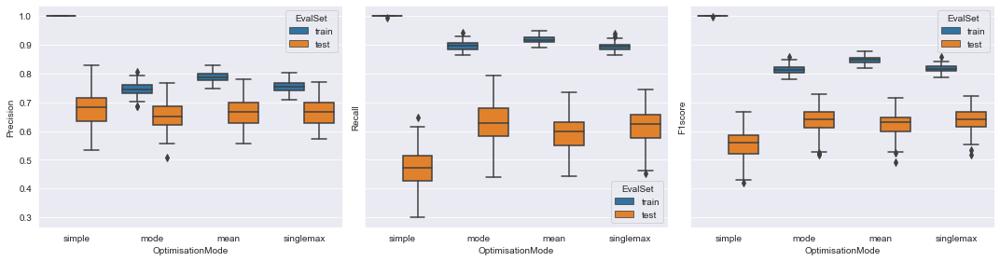

In [18]:
fig, axs = plt.subplots(ncols=3, sharey=True, figsize=(15,4))
sns.boxplot(x='OptimisationMode', y='Precision', hue='EvalSet', data=ResDF, ax=axs[0])
sns.boxplot(x='OptimisationMode', y='Recall',    hue='EvalSet', data=ResDF, ax=axs[1])
sns.boxplot(x='OptimisationMode', y='F1score',   hue='EvalSet', data=ResDF, ax=axs[2])
plt.tight_layout()
plt.show()

Wie zu erwarten war, hat die Optimierung zu einer Reduktion des Overfittings bei gleichbleibender Prediction-Performance geführt. Die Ergebnisse sind etwas schlechter als jene, die für den initialen Vergleich erzielt wurden. Dies liegt daran, dass für diesen Vergleich der gesamte Datensatz Target- und OneHot-kodiert wurde. So wurden sowohl fehlende Labels beim Fit als auch fehlende Samples für die Labelsortierung vermieden. Dies ist hier anders und führt zu einer Qualitätseinbuße, was aber auch für sämtliche andere Classifier zu erwarten gewesen wäre. Wir wählen an dieser Stelle die Modalwert-Parameter für die weitere Analyse, da bei diesen das Overfitting am geringsten ist und gleichzeitig die geringsten Computational Cost entstehen.

## Neuronale Netze

Es gibt noch eine weitere Sorte von ML-Algorithmen, die bislang nicht berücksichtigt wurde: Neuronale Netze.
Der Grund für diese Auslassung war die lediglich rudimentäre Implementierung mitsamt der notwendigen Steuermöglichkeiten in SciKit. Daher wechseln wir zu einem anderen ML-Framework (TensorFlow/Keras), welches eine andere Syntax als SciKit erfordert und daher nur umständlich in die obigen Analysen hätte eingefügt werden können.

Neuronale Netze bestehen aus einer Vielzahl von miteinander verbundenen Einheiten (Neuronen), von denen jede eine gewichtete Summe von Signalen aufnimmt (Input) und durch eine nichtlineare Funktion verarbeitet. Dieses verarbeitete Signal (Output) wird anschließend als Bestandteil weiterer gewichteter Summen an nachgeschaltete Neuronen weitergegeben. Diese Gewichte sind es, die die Freiheitsgrade des Systems darstellen und durch Optimierungsverfahren angelernt werden. Einen ersten Gesamtüberblick über neuronale Netze erhält man unter https://en.wikipedia.org/wiki/Artificial_neural_network.

Neben den Gewichtungen gibt es eine Vielzahl weiterer Parameter, die nicht angelernt werden können. Diese werden auch Hyperparameter genannt. Einige Beispiele hierfür sind
* Anzahl von Neuronen und Neuronenschichten (Layer)
* Activation Functions
* Learning Rate
* Optimierungsalgorithmen (Gradient Descent, Adam, Momentum, etc.)
* Initialisierungsalgorithmen
* Anzahl von Epochen
* uvm.

Aus diesem Grund ist die Optimierung von neuronalen Netzen eher experimentell und würde den Rahmen dieses Notebooks sprengen.
Im Folgenden präsentieren wir das optimierte neuronale Netz, welches in mehreren Iterationsschritten erarbeitet wurde.
Dieses Netz besteht aus einem Input-Layer mit fünf Neuronen, einem sogenannten Hidden Layer mit zwei Neuronen und einem Output-Layer mit einem Neuron. Dieses eine Neuron besitzt eine Sigmoid-Funktion als Aktivierung, sodass der Output Zahlenwerte zwischen 0 und 1 liefert und somit eine Interpretations als Wahrscheinlichkeit zulassen. Zwischen den Layern verwenden wir Dropout, das bei jedem Iterationsschritt neuronale Verbindungen per Zufall trennt. Somit wirken wir dem Overfitting entgegen.

In [ ]:
reps = 100
Results = []
np.random.seed(41856); Seeds = np.random.randint(0,10**6, size=reps)
for rep in range(reps):

    model = Sequential()
    model.add(Dense(units = 5, activation='tanh'))
    model.add(Dropout(0.3))
    model.add(Dense(units = 2, activation='tanh'))
    model.add(Dropout(0.3))
    model.add(Dense(units = 1, activation='sigmoid'))   
    model.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate=0.001, momentum=0.9), metrics=['accuracy'])
    
    Train, Test = train_test_split(DF, test_size=.3, shuffle=True, random_state=Seeds[rep])
    X_train, Y_train, X_test, Y_test = pipeline(Train, Test, feature_reduction=Important_Features)
    
    model.fit(X_train.to_numpy(), Y_train.to_numpy(), batch_size=64, nb_epoch=100, class_weight={0:1., 1:3.}, verbose=0)
    
    Predictions = model.predict_classes(X_train.to_numpy())
    p,r,f1,s    = precision_recall_fscore_support(Y_train, Predictions, average='binary')
    Results.append(['KerasDeepL', 'train', p, r, f1])
    
    Predictions = model.predict_classes(X_test.to_numpy())
    p,r,f1,s    = precision_recall_fscore_support(Y_test, Predictions, average='binary')
    Results.append(['KerasDeepL', 'test', p, r, f1])

ResDF_keras = pd.DataFrame(Results, columns=['OptimisationMode', 'EvalSet', 'Precision', 'Recall', 'F1score'])

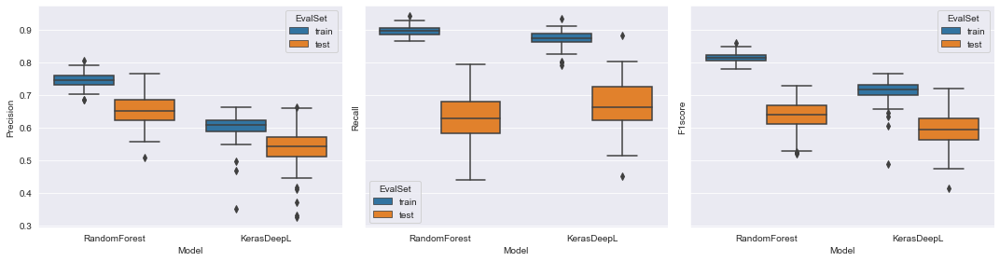

In [21]:
FinalResults = pd.concat([ResDF[ResDF.OptimisationMode=='mode'], ResDF_keras], ignore_index=True)
FinalResults = FinalResults.rename(columns={"OptimisationMode": "Model"}).replace('mode', 'RandomForest')

fig, axs = plt.subplots(ncols=3, sharey=True, figsize=(15,4))
sns.boxplot(x='Model', y='Precision', hue='EvalSet', data=FinalResults, ax=axs[0])
sns.boxplot(x='Model', y='Recall',    hue='EvalSet', data=FinalResults, ax=axs[1])
sns.boxplot(x='Model', y='F1score',   hue='EvalSet', data=FinalResults, ax=axs[2])
plt.tight_layout()
plt.show()

Im Vergleich zeigt sich, dass das neuronale Netz einen höheren Recall auf dem Test-Set bei geringerem Overfitting bietet als der RF. Gleichzeitig ist die Precision geringer als beim RF. Dies ist ein Zeichen dafür, dass das neurale Netz wesentlich verhaltener ist und sich im Zweifel für einen Betrug entscheidet, auch wenn keiner vorliegt. Aus diesem Grund ist der F1-Score auch geringer als beim RF. Tendenziell ist ein vorsichtigeres System mit höherem Recall aber zu bevorzugen. Die als Betrug gekennzeichneten Fälle werden ohnehin noch einmal einer menschlichen Prüfung unterzogen. Daher ist ein hoher Recall wichtiger als eine hohe Precision.

##  4. Monetäre Aspekte
Nun wollen wir eine weitere Metrik untersuchen und prüfen, wie viel Geld uns das beide Systeme sparen können. Hierzu betrachten wir die folgenden Fälle:
* **Saved Money** ist die Höhe der Claims, die korrekterweise als Betrug identifiziert wurden.
* **Lost Money** ist die Höhe der Claims, die fälschlicherweise nicht als Betrug identifiziert wurden.
* **Unnecessary** ist die Anzahl der Fälle, die fälschlicherweise als Betrug identifiziert wurden und eine unnötige Fallprüfung durch Mitarbeiter notwendig machen würden.

In [28]:
reps = 200
clf  = RandomForestClassifier(bootstrap=True, class_weight='balanced_subsample', 
                              n_estimators=10,   max_depth=5,  min_samples_split=10, min_samples_leaf=3)

Important_Features = ['incident_severity_Major Damage','incident_location_street','insured_hobbies',
                      'incident_severity_Minor Damage','property_claim','total_claim_amount']

np.random.seed(41856); Seeds = np.random.randint(0,10**6, size=reps)
Results = [] ; Unnecessary = []
for rep in range(reps):
    Train, Test = train_test_split(DF, test_size=.3, shuffle=True, random_state=Seeds[rep])
    X_train, Y_train, X_test, Y_test = pipeline(Train, Test, feature_reduction=Important_Features)
    
    clf.fit(X_train, Y_train)
    RF_predicts = clf.predict(X_test)
    
    RF_Money = pd.DataFrame({'claim':Test['total_claim_amount'].to_numpy(),
                            'fraud_reported':Y_test.to_numpy(),
                            'fraud_predicted':RF_predicts})
    Saved = RF_Money[(RF_Money.fraud_predicted==1)&(RF_Money.fraud_reported==1)]
    Lost  = RF_Money[(RF_Money.fraud_predicted==0)&(RF_Money.fraud_reported==1)]
    Unnec = RF_Money[(RF_Money.fraud_predicted==1)&(RF_Money.fraud_reported==0)]

    Results.append(['RandomForest', 'saved', np.sum(Saved.claim)])
    Results.append(['RandomForest', 'lost', np.sum(Lost.claim)])
    Unnecessary.append(['RandomForest', 100*len(Unnec)/len(RF_Money)])
        
    model = Sequential()
    model.add(Dense(units = 5, activation='tanh'))
    model.add(Dropout(0.3))
    model.add(Dense(units = 2, activation='tanh'))
    model.add(Dropout(0.3))
    model.add(Dense(units = 1, activation='sigmoid'))   
    model.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate=0.001, momentum=0.9), metrics=['accuracy'])
    
    model.fit(X_train.to_numpy(), Y_train.to_numpy(), batch_size=64, nb_epoch=100, class_weight={0:1., 1:3.}, verbose=0)
    NN_predicts = model.predict_classes(X_test.to_numpy())
    
    NN_Money = pd.DataFrame({'claim':Test['total_claim_amount'].to_numpy(),
                            'fraud_reported':Y_test.to_numpy(),
                            'fraud_predicted':NN_predicts.flatten()})
    Saved = NN_Money[(NN_Money.fraud_predicted==1)&(NN_Money.fraud_reported==1)]
    Lost  = NN_Money[(NN_Money.fraud_predicted==0)&(NN_Money.fraud_reported==1)]
    Unnec = NN_Money[(NN_Money.fraud_predicted==1)&(NN_Money.fraud_reported==0)]

    Results.append(['KerasDeep', 'saved', np.sum(Saved.claim)])
    Results.append(['KerasDeep', 'lost', np.sum(Lost.claim)])
    Unnecessary.append(['KerasDeep', 100*len(Unnec)/len(NN_Money)])

MonDF = pd.DataFrame(Results, columns=['model', 'saved_lost', 'money'])
UnnDF = pd.DataFrame(Unnecessary, columns=['model', 'percentage'])

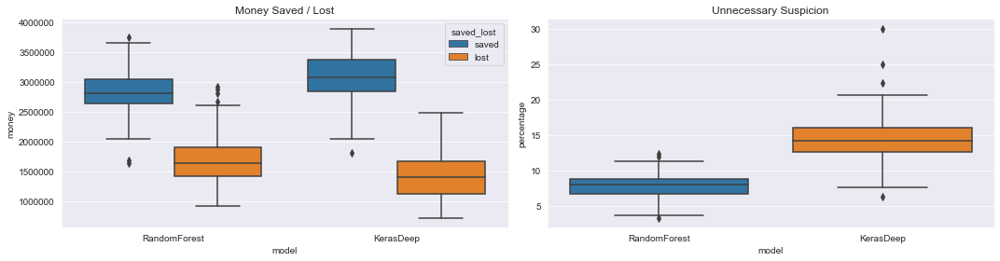

In [29]:
fig, axarr = plt.subplots(ncols=2, figsize=(15,4))
sns.boxplot(x='model', y='money', hue='saved_lost', data=MonDF, ax=axarr[0])
sns.boxplot(x='model', y='percentage', data=UnnDF, ax=axarr[1])
axarr[0].set_title('Money Saved / Lost')
axarr[1].set_title('Unnecessary Suspicion')
plt.tight_layout()
plt.show()

**Erkenntnisse:**

Die Vorsicht des neuronalen Netzes wird auch hier offensichtlich. Da mehr Fälle als Betrug markiert werden, liegt der Prozentsatz der unnötigen Überprüfungen etwa bei 15%, während er beim RF bei etwa 7.5% liegt.
Gleichzeitig zeigt sich, dass ein vorsichtigeres System (auch wenn es doppelt so viel unnötige Arbeit macht) Verluste vermehrt vermeidet. Insgesamt erkennen wir:
* Bei Verwendung des **Random Forest**
    * Betrugsfälle im Wert von 2.5 bis 3 Mio. USD können direkt als solche identifiziert werden
    * Betrugsfälle im Wert von 1.5 bis 2 Mio. USD werden nicht erkannt
    * Die Rate der falsch markierten Betrugsfälle (unnötige Arbeit beim anschließenden Prüfen) liegt bei etwa 7.5%

* Bei Verwendung des **neuronalen Netzes**
    * Betrugsfälle im Wert von 3 bis 3.5 Mio. USD können direkt als solche identifiziert werden
    * Betrugsfälle im Wert von 1.2 bis 1.7 Mio. USD werden nicht erkannt
    * Die Rate der falsch markierten Betrugsfälle (unnötige Arbeit beim anschließenden Prüfen) liegt bei etwa 15%

Das vorsichtigere neuronale Netz erkennt jährlich Betrugsfälle im Wert von 500.000 USD mehr als der RF, liefert aber doppelt so viele unnötige Prüffälle. Welches System nun letztlich als Fraud Detector implementiert werden sollte, kann nur individuell mit der jeweiligen Versicherung entschieden werden. Hier kommt es auf die Präferenzen an: Auf 500.000 USD verzichten und eine (weitere) Entlastung der Mitarbeiter gewinnen, oder eine Mehrbelastung in Kauf nehmen und 500.000 USD hinzugewinnen. Auch ist hier individuell zu prüfen, wie viel ein unnötiger Prüffall im Durchschnitt kostet (Personentage x Tagessatz) und ob die Zusatzarbeit des NN gegenüber dem RF wirtschaftlich mit dem erzielten Zusatzgewinn die Waage hält.

Abschließend wäre es für ein Versicherungsunternehmen interessant, die Erkennungsrate der bereits implementierten Kfz-Betrugsprüfung zu kennen, um einen realistischen Vergleich zu den hier erzielten Resultaten anstellen zu können und dem trivialen Ansatz ("keine ML-Betrugsprüfung") zu vergleichen.

## 5. Zusammenfassung
Data Science eröffnet viele Potenziale zur Verbesserung in Versicherungen, bspw. in Form von stärker automatisierten Prozessen (wie hier zur Aufdeckung von potenziellen Betrugsfällen), im Bereich Predictive Analytics oder auch im Pricing.
Allerdings lassen sich Data Science und aktuarielles Know-How sich für eine zielführende Arbeit in der Versicherungsbranche nicht voneinander trennen. Das Ziel muss sein, dass Aktuare das Thema Data Science innerhalb der Versicherungen vorantreiben, damit ein ganzheitlicher "alles aus einer Hand"-Ansatz ermöglicht wird. Dies wird niemals vollständig alleine geschehen, da viele weitere Entscheidungsfelder angeschnitten werden (insbesondere aus dem Management), aber das aktuarielle Betätigungsfeld und Data Science liegen "nah genug" beieinander, um die möglichen Synergieeffekte abzuschöpfen - insbesondere in dem Wissen, dass Data Science allein keine tragfähigen Ergebnisse produzieren wird.
In diesem Sinne wird das sich auftuende Betätigungsfeld prototypisch für die Zukunft sein: Eine kleine Anzahl extrem hochqualifizierter Mitarbeiter werden die komplexen Aufgabenstellungen bewältigen müssen, während immer mehr weniger komplexe Aufgaben "in die Maschine" gegeben werden.